In [2]:
from astropy import constants, units
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import matplotlib as mpl
import scipy 
from scipy import signal
from scipy.fft import fft, fftshift
from astropy.units import Quantity
from astropy import units
import matplotlib.ticker as ticker
import cmcrameri.cm as cmc
import sys
from mpl_toolkits.axes_grid1 import ImageGrid
import corner
from tqdm import tqdm

import hera_sim
from pyuvdata import UVData
from uvtools.dspec import gen_window
from uvtools.plot import waterfall
from uvtools.utils import FFT, fourier_freqs
from hydra_pspec.sys_solver import sys_modes
from astropy import units as u
mpl.rcParams['font.size']=20
from plotting_functions import plot_waterfalls,plot_waterfalls_from_dlfr
from functions import covariance_from_pspec,fourier_operator, data_dly_fr

# Setup

In [3]:
# Check power spectrum
def calc_ps(s):
    # NOTE: This uses inverse FFT instead of FFT to get the right normalisation
    axes = (1,)
    sk = np.fft.ifftshift(s, axes=axes)
    sk = np.fft.fftn(sk, axes=axes)
    sk = np.fft.fftshift(sk, axes=axes)
    Nobs, Nfreqs = sk.shape
    return np.mean(sk * sk.conj(), axis=0).real / Nfreqs # CHECK: This takes an average

In [4]:
'''Plot specs'''
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'
plt.rcParams.update({'font.size': 20})

'''Colour maps'''
paper_map=LinearSegmentedColormap.from_list('my_gradient', (
    # Edit this gradient at https://eltos.github.io/gradient/#0:031D44-25:8DA9C4-50:EEF4ED-75:BC7C95-100:89043D
    (0.000, (0.012, 0.114, 0.267)),
    (0.250, (0.553, 0.663, 0.769)),
    (0.500, (0.933, 0.957, 0.929)),
    (0.750, (0.737, 0.486, 0.584)),
    (1.000, (0.537, 0.016, 0.239))))

paper_map_pink = LinearSegmentedColormap.from_list('my_gradient', (
    # Edit this gradient at https://eltos.github.io/gradient/#EEF4ED-BC7C95-89043D
    (0.000, (0.933, 0.957, 0.929)),
    (0.500, (0.737, 0.486, 0.584)),
    (1.000, (0.537, 0.016, 0.239))))
paper_map_blue = LinearSegmentedColormap.from_list('my_gradient', (
    # Edit this gradient at https://eltos.github.io/gradient/#031D44-8DA9C4-EEF4ED
    (0.000, (0.012, 0.114, 0.267)),
    (0.500, (0.553, 0.663, 0.769)),
    (1.000, (0.933, 0.957, 0.929))))


colors=['#219ebc','#606c38','#BC7C95','m','cyan']


In [5]:
result_dir='paper_plots/'
fig_dir='/nvme2/scratch/sohini/Systematics-in-hydra-pspec/Figures'
# run_version = 'low_dl_fr_0'
run_version = 'high_dl_fr_0'
# run_version = 'low_dl_low_fr'
# run_version = 'fixed_sky'

# Build systematics model
# nm_list = [(3,0),(4,0),(5,0),(6,0)] #low dl fr 0
nm_list = [(10,0), (11,0), (12,0), (13,0)] #high dl fr 0
# nm_list = [(3,3),(3,4),(3,5),(3,6)] #low dl low fr

In [6]:
Ntimes = 80 #60 #203
Nfreqs = 60
freqs = np.linspace(100., 120., 120) ##120) 
Nfgmodes = 12
freqs = freqs[:Nfreqs]
# Generate FG mode matrix
fgmodes = np.array([
                scipy.special.legendre(i)(np.linspace(-1., 1., freqs.size))
                for i in range(Nfgmodes)
            ]).T

lsts = np.linspace(0., 1., Ntimes)
sys_modes_operator = sys_modes(freqs_Hz=freqs*1e6, 
                                    times_sec=lsts * 24./(2.*np.pi) * 3600., 
                                    modes=nm_list)

sys_amps_true = np.array([4., 4.1, 5., -2.]) #np.array([4., 4.01])
sys_prior = 4**2. * np.eye(sys_amps_true.size)

fourier_op = fourier_operator(freqs.size, unitary=True)

# Generate noise
noise_ps_val = 0.0004 #0.000004 #0.000004 # 0.0004
noise_ps_true = noise_ps_val * np.ones(Nfreqs)
N_true = covariance_from_pspec(noise_ps_true, fourier_op)
Ninv = np.diag(1./np.diag(N_true)) # get diagonal, invert, pack back into diagonal
n = np.sqrt(N_true) @ (np.random.randn(freqs.size, Ntimes) 
                    + 1.j*np.random.randn(freqs.size, Ntimes)) / np.sqrt(2.)
# Note factor of sqrt(2) above
noise_ps_check = calc_ps(n.T)

10 0
11 0
12 0
13 0


# Plotting the delay power spectra

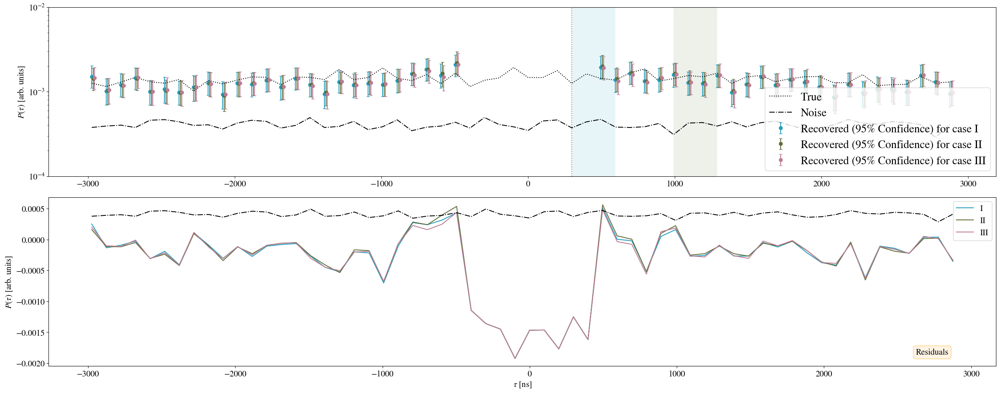

In [7]:

# run_version_arr = ['masked_data','high_dl_fr_0','low_dl_low_fr']
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/'
run_version_arr = ['low_dl_fr_0','high_dl_fr_0','1e7_bound/10modes']
conf_interval=95
Nburn = 10
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)
plt.rcParams.update({'font.size': 15})
dl_inds=[[3,4,5,6],[10,11,12,13],[3,3,3,3]]
fig, ax = plt.subplots(2,1,figsize=(25, 10))
i=0
fig_labels=['I','II','III','Residuals']
for run_version in run_version_arr:
    eor_true=np.load(result_dir+'high_dl_fr_0/eor_true.npy')
    ps_sample = np.load(result_dir+run_version+'/dps-eor.npy')
    ln_post = np.load(result_dir+run_version+'/ln-post.npy')
    ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
    ps_mean = np.mean(ps_sample, axis=0)
    df = (freqs[1] - freqs[0]) * u.MHz
    delays = np.fft.fftshift(np.fft.fftfreq(Nfreqs, d=df.to("1/ns")))

 
    sys_delays= delays[np.unique(dl_inds[i])+int(Nfreqs/2)].value
    if Nburn > 0:
        ps_sample = ps_sample[Nburn:]
        ln_post = ln_post[Nburn:]
    # Posterior-weighted mean delay power spectrum
    dps_eor_hp_pwm = np.average(ps_sample, weights=ln_post, axis=0)
    
    # Confidence interval of delay power spectrum posteriors
    percentile = conf_interval/2 + 50
    dps_eor_hp_ubound = np.percentile(ps_sample, percentile, axis=0)
    dps_eor_hp_lbound = np.percentile(ps_sample, 100-percentile, axis=0)
    dps_eor_hp_err = np.vstack((
        dps_eor_hp_pwm - dps_eor_hp_lbound,
        dps_eor_hp_ubound - dps_eor_hp_pwm
    ))
    
    ax[0].errorbar(
                    delays.value+i*10,
                    dps_eor_hp_pwm,
                    yerr=np.abs(dps_eor_hp_err),
                    color=colors[i],
                    ls="",
                    marker="o",
                    capsize=3,
                    label=f"Recovered ({conf_interval}% Confidence) for case "+fig_labels[i]
                    )
    
    x0, x1 = np.min(sys_delays), np.max(sys_delays)   # the x-range to shade
    ax[0].axvspan(x0, x1, color=colors[i], alpha=0.1, ec=None, zorder=0.1)
    # ax[-1].axvspan(x0, x1, color=colors[i], alpha=0.1, ec=None, zorder=0.1)

    if i==2:
        for dl in sys_delays:
            ax[0].axvline(dl,ls='dotted',c=colors[i])

    ax[-1].plot(delays,(dps_eor_hp_pwm-ps_true),color=colors[i],label=fig_labels[i])
    ax[-1].set_ylabel(r"$P(\tau)$ [arb. units]")
    ax[-1].set_xlabel(r'$\tau$ [ns]')
    ax[-1].legend()
    # ax[-1].grid()

    i=i+1
ax[-1].text(0.95,0.07,fig_labels[-1],fontsize=15, bbox=bbox,
            transform=ax[-1].transAxes, horizontalalignment='right')
ax[-1].plot(delays,calc_ps(n.T),'k',ls='-.',label='Noise')


ax[0].plot(delays, ps_true, "k:", label="True")
ax[0].plot(delays,calc_ps(n.T),'k',ls='-.',label='Noise')
ax[0].legend(loc="lower right",fontsize=20)
ax[0].set_ylabel(r"$P(\tau)$ [arb. units]")
ax[0].set_ylim(1e-4,1e-2)
# ax.set_title("EoR Delay Power Spectrum Comparison")
ax[0].set_yscale("log")
# ax[i].grid()
fig.tight_layout()
# plt.savefig(fig_dir+'/delay_power_spectrum_full.pdf',bbox_inches='tight',dpi=300)

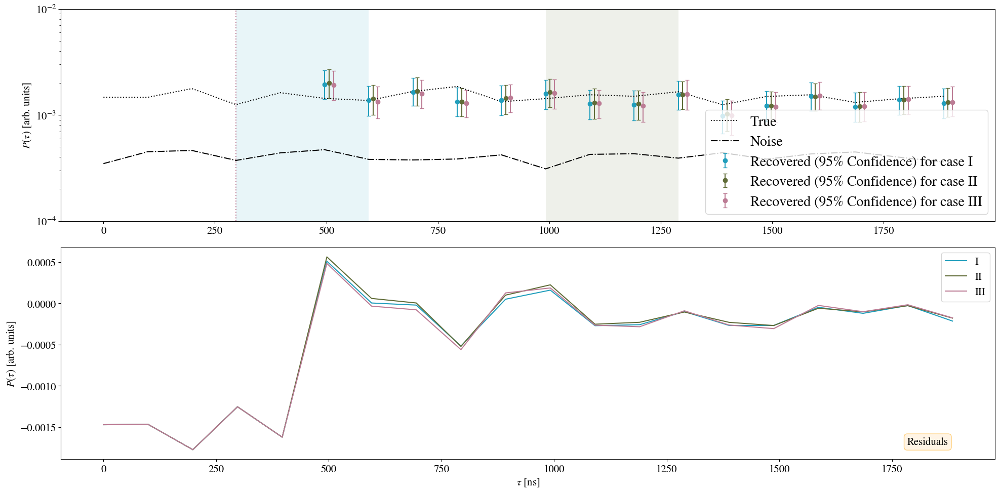

In [8]:

# run_version_arr = ['masked_data','high_dl_fr_0','low_dl_low_fr']
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/'
run_version_arr = ['low_dl_fr_0','high_dl_fr_0','1e7_bound/10modes']
conf_interval=95
Nburn = 10
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)

dl_inds=[[3,4,5,6],[10,11,12,13],[3,3,3,3]]
fig, ax = plt.subplots(2,1,figsize=(20, 10))
i=0
fig_labels=['I','II','III','Residuals']
for run_version in run_version_arr:
    eor_true=np.load(result_dir+'high_dl_fr_0/eor_true.npy')
    ps_sample = np.load(result_dir+run_version+'/dps-eor.npy')
    ln_post = np.load(result_dir+run_version+'/ln-post.npy')
    ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
    ps_mean = np.mean(ps_sample, axis=0)
    df = (freqs[1] - freqs[0]) * u.MHz
    delays = np.fft.fftshift(np.fft.fftfreq(Nfreqs, d=df.to("1/ns")))

 
    sys_delays= delays[np.unique(dl_inds[i])+int(Nfreqs/2)].value
    if Nburn > 0:
        ps_sample = ps_sample[Nburn:]
        ln_post = ln_post[Nburn:]
    # Posterior-weighted mean delay power spectrum
    dps_eor_hp_pwm = np.average(ps_sample, weights=ln_post, axis=0)
    
    # Confidence interval of delay power spectrum posteriors
    percentile = conf_interval/2 + 50
    dps_eor_hp_ubound = np.percentile(ps_sample, percentile, axis=0)
    dps_eor_hp_lbound = np.percentile(ps_sample, 100-percentile, axis=0)
    dps_eor_hp_err = np.vstack((
        dps_eor_hp_pwm - dps_eor_hp_lbound,
        dps_eor_hp_ubound - dps_eor_hp_pwm
    ))
    
    ax[0].errorbar(
                    delays[30:50].value+i*10,
                    dps_eor_hp_pwm[30:50],
                    yerr=np.abs(dps_eor_hp_err[:,30:50]),
                    color=colors[i],
                    ls="",
                    marker="o",
                    capsize=3,
                    label=f"Recovered ({conf_interval}% Confidence) for case "+fig_labels[i]
                    )
    
    x0, x1 = np.min(sys_delays), np.max(sys_delays)   # the x-range to shade
    ax[0].axvspan(x0, x1, color=colors[i], alpha=0.1, ec=None, zorder=0.1)
    # ax[-1].axvspan(x0, x1, color=colors[i], alpha=0.1, ec=None, zorder=0.1)

    if i==2:
        for dl in sys_delays:
            ax[0].axvline(dl,ls='dotted',c=colors[i])

    ax[-1].plot(delays[30:50],(dps_eor_hp_pwm-ps_true)[30:50],color=colors[i],label=fig_labels[i])
    ax[-1].set_ylabel(r"$P(\tau)$ [arb. units]")
    ax[-1].set_xlabel(r'$\tau$ [ns]')
    ax[-1].legend()
    # ax[-1].grid()

    i=i+1
ax[-1].text(0.95,0.07,fig_labels[-1],fontsize=15, bbox=bbox,
            transform=ax[-1].transAxes, horizontalalignment='right')
# ax[-1].plot(delays[30:50],calc_ps(n.T)[30:50],'k',ls='-.',label='Noise')


ax[0].plot(delays[30:50], ps_true[30:50], "k:", label="True")
ax[0].plot(delays[30:50],calc_ps(n.T)[30:50],'k',ls='-.',label='Noise')
ax[0].legend(loc="lower right",fontsize=20)
ax[0].set_ylabel(r"$P(\tau)$ [arb. units]")
ax[0].set_ylim(1e-4,1e-2)
# ax.set_title("EoR Delay Power Spectrum Comparison")
ax[0].set_yscale("log")
# ax[i].grid()
fig.tight_layout()
# plt.savefig(fig_dir+'/delay_power_spectrum.pdf',bbox_inches='tight',dpi=300)


# Plotting the different systematic locations in DL FR space

3 0
4 0
5 0
6 0
10 0
11 0
12 0
13 0
3 20
4 20
5 20
6 20


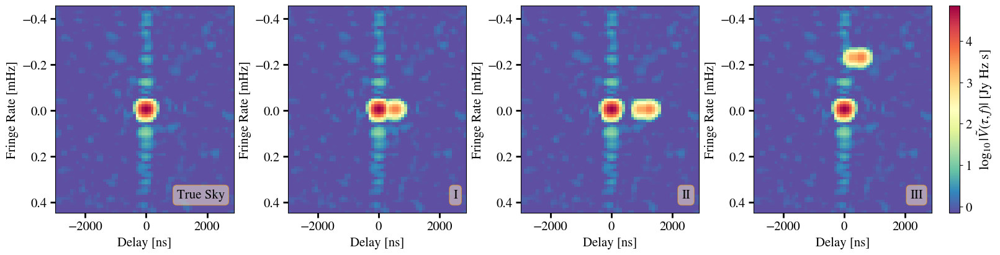

In [9]:
result_dir='paper_plots/'
run_version_arr = ['low_dl_fr_0','high_dl_fr_0','1e7_bound/10modes']

nm_list_arr = [
            [(3,0),(4,0),(5,0),(6,0)],
            [(10,0), (11,0), (12,0), (13,0)],
            [(3,20),(4,20),(5,20),(6,20)]
            ]

fig,axs = plt.subplots(1,4,layout="constrained",figsize=(16,4))
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)
i=0

eor_true=np.load(result_dir+run_version_arr[0]+'/eor_true.npy')
fg_true=np.load('npy_data/fg_true.npy')
ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
data_true = eor_true[:Ntimes,:Nfreqs] + fg_true[:Ntimes,:Nfreqs]

_=plot_waterfalls(data_true, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=axs[0], mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',colorbar_flag=False,
                freq_window_kwargs=None, time_window_kwargs=None)
axs[0].text(0.95,0.07,'True Sky',fontsize=15, bbox=bbox,
            transform=axs[0].transAxes, horizontalalignment='right')

fig_labels = ['I','II','III']
for run_version in run_version_arr:
    sys_modes_operator = sys_modes(freqs_Hz=freqs*1e6, 
                                    times_sec=lsts * 24./(2.*np.pi) * 3600., 
                                    modes=nm_list_arr[i])
    sys_model_true= (1+sys_modes_operator @ sys_amps_true).reshape((Nfreqs, Ntimes)).T
    total_data_true = sys_model_true * data_true
    
    plot_op=plot_waterfalls(total_data_true, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=axs[i+1], mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=False,
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
    axs[i+1].text(0.95,0.07,fig_labels[i],fontsize=15, bbox=bbox,
            transform=axs[i+1].transAxes, horizontalalignment='right')
    i=i+1

_=fig.colorbar(plot_op[0], ax=axs, orientation='vertical', fraction=0.9, pad=0.02)
vis_label = r"$\log_{10}|\tilde{V}(\tau, f)|$ [Jy Hz s]"
_.set_label(vis_label,c='black',fontsize=16)
# _.ax.tick_params(axis='y',which='both', color='black', labelcolor='black',labelsize=15)
# plt.savefig(fig_dir+'/'+'test_cases_in_dlfr.pdf',bbox_inches='tight',dpi=300)

# Adding new systematic cases

3 0
4 0
5 0
6 0
10 0
11 0
12 0
13 0
3 20
4 20
5 20
6 20
10 20
11 20
12 20
13 20
3 3
3 4
3 5
3 6


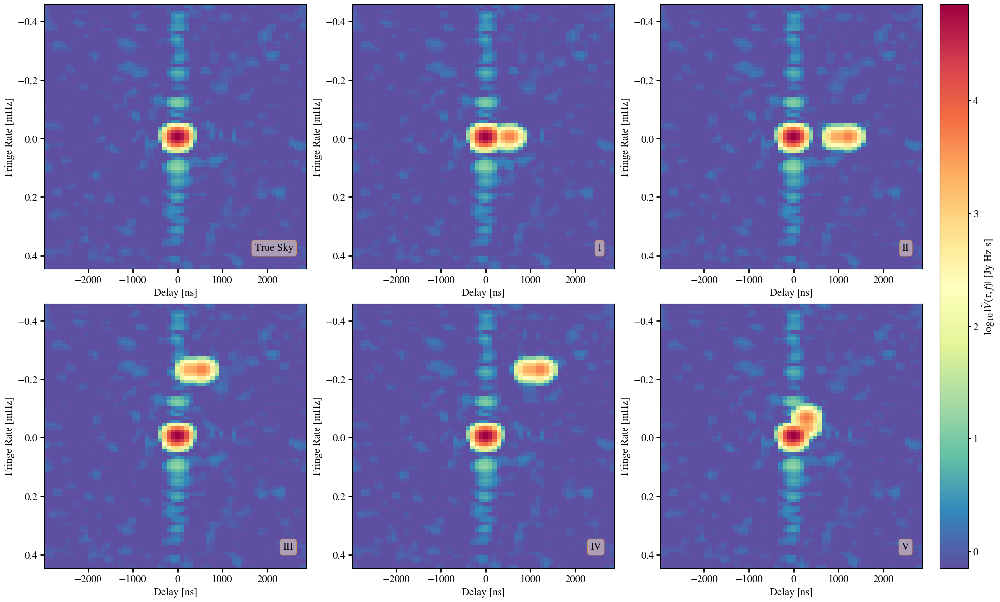

In [10]:
result_dir='paper_plots/'
run_version_arr = ['low_dl_fr_0',
                   'high_dl_fr_0',
                   'low_dl_fr_5',
                   'high_dl_fr_5',
                   'low_dl_low_fr']

nm_list_arr = [
            [(3,0),(4,0),(5,0),(6,0)],
            [(10,0), (11,0), (12,0), (13,0)],
            [(3,20),(4,20),(5,20),(6,20)],
            [(10,20), (11,20), (12,20), (13,20)],
            [(3,3),(3,4),(3,5),(3,6)],  #Need to fix this
            # [(3,5),(4,5),(5,5),(6,5)]   #Need to fix this
            ]

fig,axs = plt.subplots(2,3,layout="constrained",figsize=(20,12))
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)

eor_true=np.load(result_dir+run_version_arr[0]+'/eor_true.npy')
fg_true=np.load('npy_data/fg_true.npy')
ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
data_true = eor_true[:Ntimes,:Nfreqs] + fg_true[:Ntimes,:Nfreqs]

# _=plot_waterfalls(data_true, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=grid[0], mode='log', 
#                 vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
#                 baseline=None, horizon_color='magenta',colorbar_flag=False,
#                 freq_window_kwargs=None, time_window_kwargs=None)
# grid[0].text(0.95,0.07,'True Sky',fontsize=15, bbox=bbox,
#             transform=grid[0].transAxes, horizontalalignment='right')
i=0
fig_labels = ['I','II','III','IV','V']
for ax in axs.flatten():
    if i==0:
        _=plot_waterfalls(data_true, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=ax, mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',colorbar_flag=False,
                freq_window_kwargs=None, time_window_kwargs=None)
        ax.text(0.95,0.07,'True Sky',fontsize=15, bbox=bbox,
            transform=ax.transAxes, horizontalalignment='right')
    else:
        sys_modes_operator = sys_modes(freqs_Hz=freqs*1e6, 
                                    times_sec=lsts * 24./(2.*np.pi) * 3600., 
                                    modes=nm_list_arr[i-1])
        sys_model_true= (1+sys_modes_operator @ sys_amps_true).reshape((Nfreqs, Ntimes)).T
        total_data_true = sys_model_true * data_true
        plot_op=plot_waterfalls(total_data_true, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=ax, mode='log', 
                    vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=False,
                    baseline=None, horizon_color='magenta',
                    freq_window_kwargs=None, time_window_kwargs=None)
        ax.text(0.95,0.07,fig_labels[i-1],fontsize=15, bbox=bbox,
                transform=ax.transAxes, horizontalalignment='right')
    i=i+1

_=fig.colorbar(plot_op[0], ax=axs, orientation='vertical', fraction=0.9, pad=0.02)
vis_label = r"$\log_{10}|\tilde{V}(\tau, f)|$ [Jy Hz s]"
_.set_label(vis_label,c='black',fontsize=16)
# plt.savefig(result_dir+'/'+'test_cases_in_dlfr2.pdf',bbox_inches='tight',dpi=300)

In [11]:
# eor_true=np.load('/Users/user/Documents/Codes/hydra_sys_project1/multi_phil/hydra-pspec-systematic/npy_data/eor_true.npy')
eor_true=np.load(result_dir+run_version+'/eor_true.npy')
fg_true=np.load('/nvme2/scratch/sohini/hydra-pspec-systematic/npy_data/fg_true.npy')
# sys_model_true=np.load(result_dir+run_version+'true_gain.npy') #1+delta_g has been saved
sys_model_true= (1+sys_modes_operator @ sys_amps_true).reshape((Ntimes, Nfreqs))
ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])

In [12]:
signal_amps = np.load(result_dir+run_version+'/gcr-eor.npy')
fg_amps = np.load(result_dir+run_version+'/fg-amps.npy').mean(axis=0)
ps_sample = np.load(result_dir+run_version+'/dps-eor.npy')
sys_amps = np.load(result_dir+run_version+'/b-sys.npy').mean(axis=0)
ln_post = np.load(result_dir+run_version+'/ln-post.npy')

In [13]:
data_true = eor_true[:Ntimes,:Nfreqs] + fg_true[:Ntimes,:Nfreqs]
model = signal_amps + fg_amps @ fgmodes.T
sys_model_sampled = (1. + sys_modes_operator @ sys_amps).reshape((Ntimes, Nfreqs))

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 12 is different from 10)

In [ ]:
total_data_true = sys_model_true * data_true

In [ ]:
paper_cmap=LinearSegmentedColormap.from_list('my_gradient', (
    # Edit this gradient at https://eltos.github.io/gradient/#89023E-EA638C-FFD9DA
    (0.000, (0.537, 0.008, 0.243)),
    (0.500, (0.918, 0.388, 0.549)),
    (1.000, (1.000, 0.851, 0.855))))

paper_cmap_res=LinearSegmentedColormap.from_list('my_gradient', (
    # Edit this gradient at https://eltos.github.io/gradient/#89023E-EA638C-FFD9DA-EA638C-89023E
    (0.000, (0.537, 0.008, 0.243)),
    (0.250, (0.918, 0.388, 0.549)),
    (0.500, (1.000, 0.851, 0.855)),
    (0.750, (0.918, 0.388, 0.549)),
    (1.000, (0.537, 0.008, 0.243))))

In [ ]:
lsts_round=np.array([round(l,2) for l in lsts])

In [ ]:

times = Quantity(np.unique(lsts_round * 12 / np.pi), unit='h')
# freqs_mhz = freqs * u.MHz
xticklocs=[0,9,19,29,39,49,59]
yticklocs=[0,9,19,29,39,49,59]
xstep = (freqs[-1]-freqs[0])/freqs.size
ystep = (lsts[-1]-lsts[0])/Ntimes

xticks= freqs[xticklocs]
yticks=times[yticklocs]

xticklabels = [f"{val:.2f} MHz" for val in xticks]
yticklabels = [f"{val:.2f} h" for val in yticks.value]

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((6, 6))  # Force sci notation for values >= 1e6

# Plotting masked and filtered data

In [ ]:
result_dir='/Users/user/Documents/Codes/hydra_sys_project1/multi_phil/hydra-pspec-systematic/paper_plots/'
# run_version = 'low_dl_fr_0'
# run_version = 'high_dl_fr_0'
run_version = 'low_dl_low_fr'
# run_version = 'fixed_sky'

# Build systematics model
# nm_list = [(3,0),(4,0),(5,0),(6,0)] #low dl fr 0
# nm_list = [(10,0), (11,0), (12,0), (13,0)] #high dl fr 0
nm_list = [(3,3),(3,4),(3,5),(3,6)] #low dl low fr



Ntimes = 80 #60 #203
Nfreqs = 60
freqs = np.linspace(100., 120., 120) ##120) 
Nfgmodes = 12
freqs = freqs[:Nfreqs]
# Generate FG mode matrix
fgmodes = np.array([
                scipy.special.legendre(i)(np.linspace(-1., 1., freqs.size))
                for i in range(Nfgmodes)
            ]).T

lsts = np.linspace(0., 1., Ntimes)
sys_modes_operator = sys_modes(freqs_Hz=freqs*1e6, 
                                    times_sec=lsts * 24./(2.*np.pi) * 3600., 
                                    modes=nm_list)

sys_amps_true = np.array([4., 4.1, 5., -2.]) #np.array([4., 4.01])
sys_prior = 4**2. * np.eye(sys_amps_true.size)

fourier_op = fourier_operator(freqs.size, unitary=True)

# Generate noise
noise_ps_val = 0.000004 #0.000004 # 0.0004
noise_ps_true = noise_ps_val * np.ones(freqs.size)
N_true = covariance_from_pspec(noise_ps_true, fourier_op)
Ninv = np.diag(1./np.diag(N_true)) # get diagonal, invert, pack back into diagonal
n = np.sqrt(N_true) @ (np.random.randn(freqs.size, Ntimes) 
                    + 1.j*np.random.randn(freqs.size, Ntimes)) / np.sqrt(2.)
# Note factor of sqrt(2) above
noise_ps_check = calc_ps(n.T)

In [ ]:
# eor_true=np.load('/Users/user/Documents/Codes/hydra_sys_project1/multi_phil/hydra-pspec-systematic/npy_data/eor_true.npy')
eor_true=np.load(result_dir+run_version+'/eor_true.npy')
fg_true=np.load('/Users/user/Documents/Codes/hydra_sys_project1/multi_phil/hydra-pspec-systematic/npy_data/fg_true.npy')
# sys_model_true=np.load(result_dir+run_version+'true_gain.npy') #1+delta_g has been saved
sys_model_true= (1+(sys_modes_operator @ sys_amps_true)).reshape((Ntimes, Nfreqs),order='F')
ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
fg_true=fg_true[:Ntimes,:Nfreqs]

data_true = sys_model_true * (fg_true + eor_true)

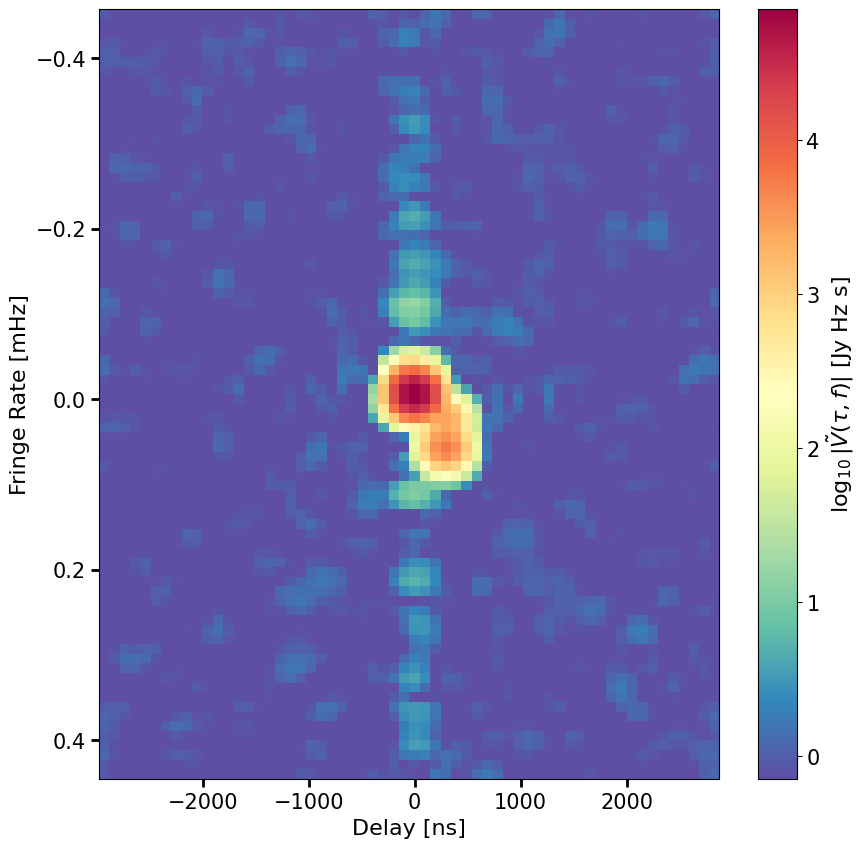

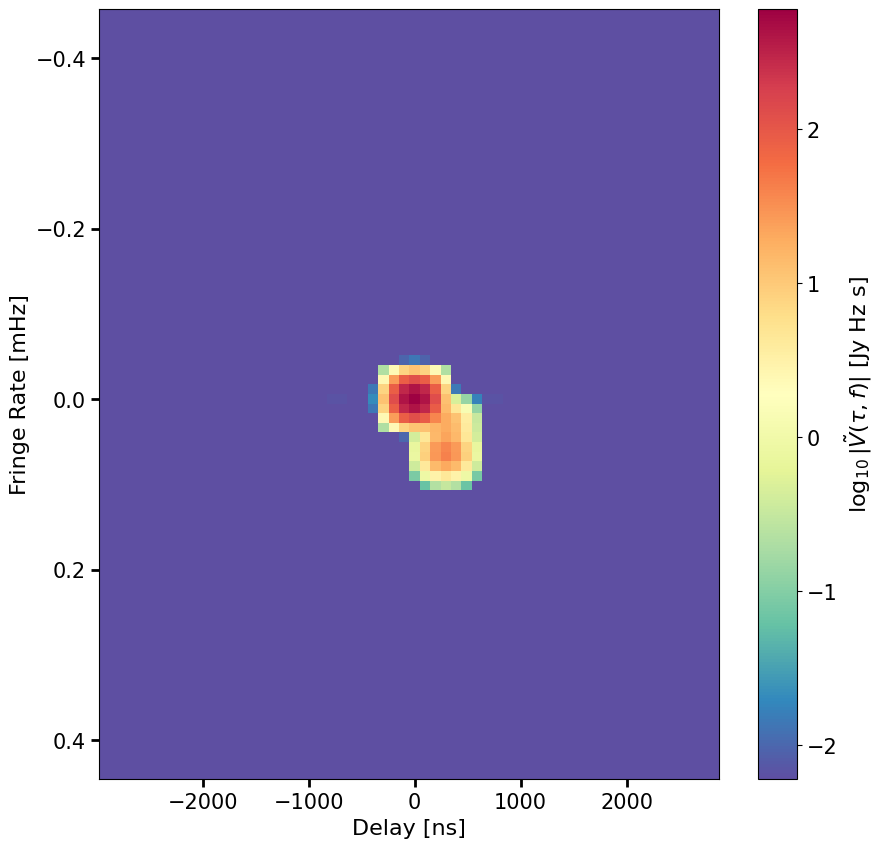

In [ ]:
true_total_dlfr=plot_waterfalls(data_true, freqs*1e6, lsts, windows='blackman-harris', fig=None,ax=None, mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=True,
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)[1]

sys_subtraction=(1+(sys_modes_operator@ (sys_amps_true))).reshape((Ntimes,Nfreqs),order='F')

sys_true_dlfr=plot_waterfalls(sys_subtraction, freqs*1e6, lsts, windows='blackman-harris', fig=None,ax=None, mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=True,
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)[1]

data_filtered_dlfr = true_total_dlfr - sys_true_dlfr


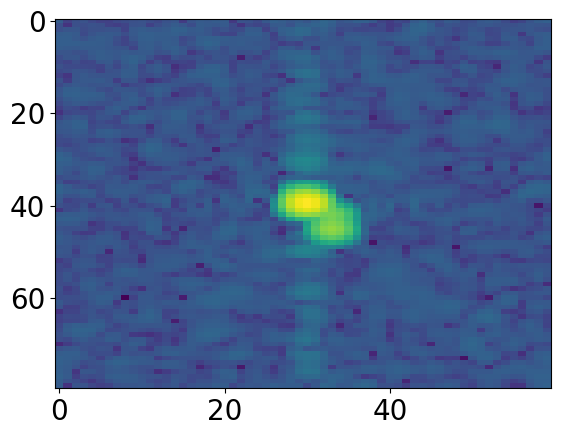

In [ ]:
waterfall(data_filtered_dlfr)

In [ ]:
eps=1e-12
data_unshifted = np.fft.ifftshift(data_filtered_dlfr,axes=1)
temp = np.fft.ifft(data_unshifted,axis=1)
freq_window = gen_window('blackman-harris', freqs.size)[None,:]
data_recon = temp / np.where(freq_window != 0, freq_window, eps)

data_unshifted = np.fft.ifftshift(data_recon,axes=0)
temp = np.fft.ifft(data_unshifted,axis=0)
time_window = gen_window('blackman-harris', lsts.size)[:,None]
data_recon = temp / np.where(time_window != 0, time_window, eps)

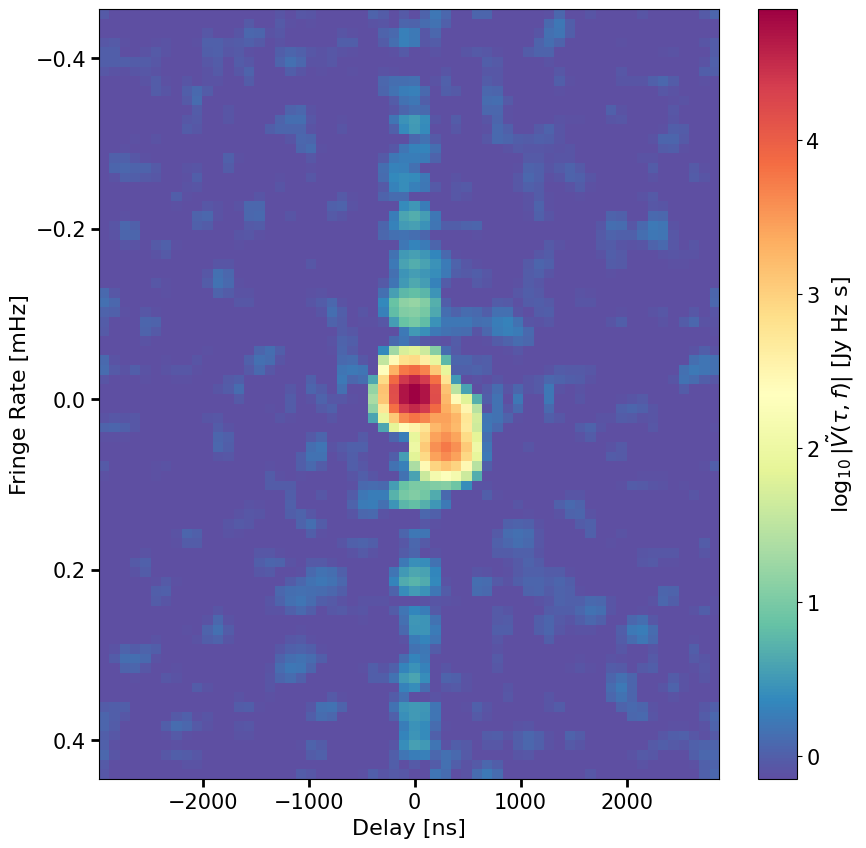

In [ ]:
data_filtered_dlfr = plot_waterfalls(data_true-sys_subtraction, freqs*1e6, lsts, windows='blackman-harris', fig=None,ax=None, mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=True,
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)[1]

In [ ]:
waterfall(true_total_dlfr.real-(true_total_dlfr -_[1]).real)
plt.colorbar()

TypeError: 'Colorbar' object is not subscriptable

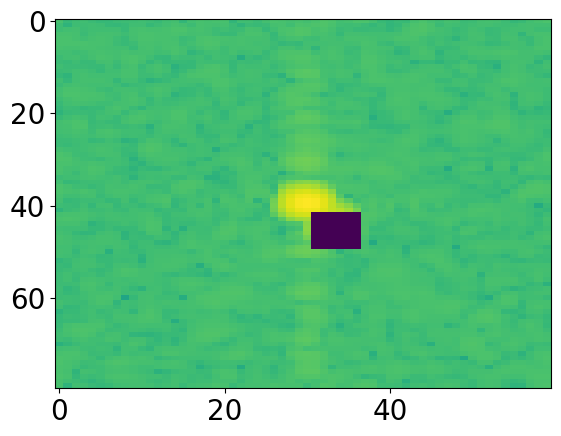

In [ ]:
waterfall(true_total_dlfr[44:53,37:45])

masked_dlfr=true_total_dlfr.copy()
masked_dlfr[42:50,31:37]=1e-12

waterfall(masked_dlfr)

# eps=1e-12
# data_unshifted = np.fft.ifftshift(masked_dlfr,axes=1)
# temp = np.fft.ifft(data_unshifted,axis=1)
# freq_window = gen_window('blackman-harris', freqs.size)[None,:]
# data_recon = temp / np.where(freq_window != 0, freq_window, eps)

# data_unshifted = np.fft.ifftshift(data_recon,axes=0)
# temp = np.fft.ifft(data_unshifted,axis=0)
# time_window = gen_window('blackman-harris', lsts.size)[:,None]
# data_recon = temp / np.where(time_window != 0, time_window, eps)

# plt.imshow(data_recon.real)
# plt.colorbar()

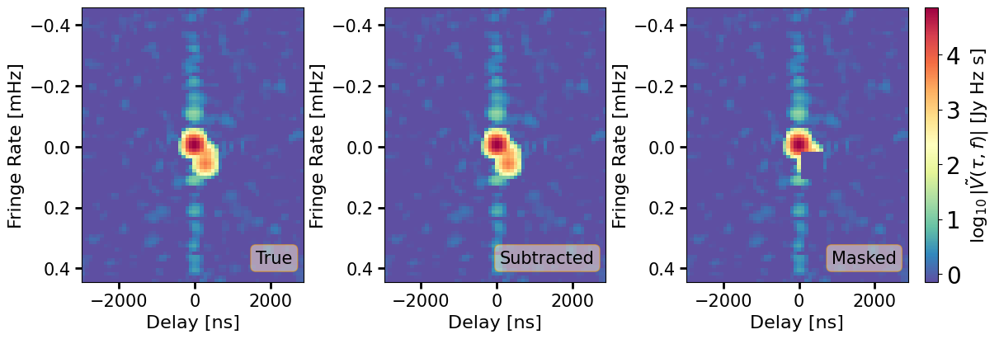

In [ ]:
fig,axs = plt.subplots(1,3,layout="constrained",figsize=(12,4))
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)
i=0
data_arr=[data_true,true_total_dlfr-sys_true_dlfr,masked_dlfr]
fig_labels = ['True','Subtracted','Masked']
plot_op=plot_waterfalls(data_true, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=axs[0], mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',colorbar_flag=False,
                freq_window_kwargs=None, time_window_kwargs=None)
axs[0].text(0.95,0.07,fig_labels[i],fontsize=15, bbox=bbox,
            transform=axs[0].transAxes, horizontalalignment='right')


for i in range(2):
    _=plot_waterfalls_from_dlfr(data_arr[i+1], freqs*1e6, lsts, fig=fig,ax=axs[i+1], mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=False,
                baseline=None, horizon_color='magenta')
    axs[i+1].text(0.95,0.07,fig_labels[i+1],fontsize=15, bbox=bbox,
            transform=axs[i+1].transAxes, horizontalalignment='right')
    i=i+1

_=fig.colorbar(plot_op[0], ax=axs, orientation='vertical', fraction=0.9, pad=0.02)
vis_label = r"$\log_{10}|\tilde{V}(\tau, f)|$ [Jy Hz s]"
_.set_label(vis_label,c='black',fontsize=16)
# plt.savefig(result_dir+'/'+'method_comparison.pdf',bbox_inches='tight',dpi=300)

# Plotting data

In [ ]:
uvd=UVData()
uvd.read('/nvme2/scratch/sohini/hydra-pspec-systematic/test_data/vis-eor.uvh5')
antpairpols=uvd.get_antpairpols()
vis_eor=uvd.get_data(antpairpols[0], force_copy=True) #EoR test
freqs_=uvd.freq_array
freqs_corr=freqs_.reshape(freqs_.shape[0],) #[0]
lst_corr=np.unique(uvd.lst_array)

uvd=UVData()
uvd.read('/nvme2/scratch/sohini/hydra-pspec-systematic/test_data/vis-ptsrc-gsm.uvh5')
antpairpols=uvd.get_antpairpols()
fg_true=uvd.get_data(antpairpols[0], force_copy=True) #EoR test

uvd=UVData()
uvd.read('/nvme2/scratch/sohini/hydra-pspec-systematic/hera_val/vis_corrupted_test.uvh5')
antpairpols=uvd.get_antpairpols()
vis_corr=uvd.get_data(['xx'], force_copy=True) #EoR test

noise=np.load('/nvme2/scratch/sohini/hydra-pspec-systematic/test_data/noise.npy')

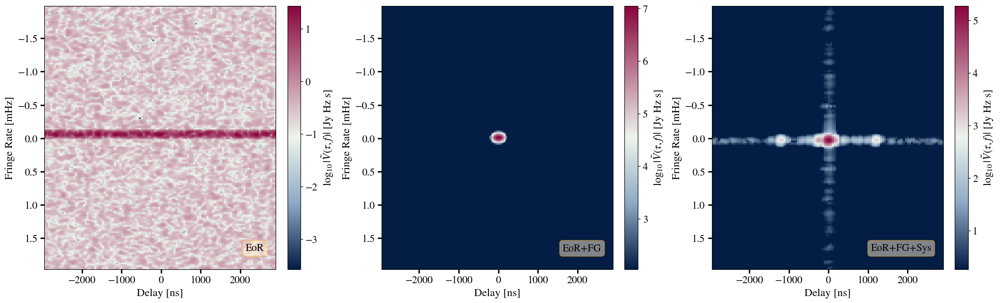

In [ ]:
fig,axs = plt.subplots(1,3,layout="constrained",figsize=(20,6))
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)
vmax = np.log10(np.abs(vis_eor)).max()
vmin = vmax - 5  
eor_dlfr=plot_waterfalls(vis_eor+noise, freqs_corr, lst_corr, windows='blackman-harris', fig=fig,ax=axs[0], mode='log', 
                vmin=vmin,vmax=vmax,cmap=paper_map, dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[0].text(0.95,0.07,'EoR',fontsize=15, bbox=bbox,
            transform=axs[0].transAxes, horizontalalignment='right')
fg_dlfr = plot_waterfalls(fg_true+noise, freqs_corr, lst_corr, windows='blackman-harris', mode='log', fig=fig,ax=axs[1],
                vmin=vmin,vmax=vmax,cmap=paper_map, dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[1].text(0.95,0.07,'EoR+FG',fontsize=15, bbox=bbox,
            transform=axs[1].transAxes, horizontalalignment='right')
corr_dlfr=plot_waterfalls(vis_corr+noise, freqs_corr, lst_corr, windows='blackman-harris', mode='log', fig=fig,ax=axs[2],
                vmin=vmin,vmax=vmax,cmap=paper_map, dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[2].text(0.95,0.07,'EoR+FG+Sys',fontsize=15, bbox=bbox,
            transform=axs[2].transAxes, horizontalalignment='right')
# _=fig.colorbar(corr_dlfr[0], ax=axs, orientation='vertical', fraction=0.9, pad=0.02)
vis_label = r"$\log_{10}|\tilde{V}(\tau, f)|$ [Jy Hz s]"
# _.set_label(vis_label,c='black',fontsize=16)
# _.ax.tick_params(axis='y',which='both', color='black', labelcolor='black',labelsize=15)
# plt.savefig(result_dir+'/'+'data_in_dlfr_space.pdf',bbox_inches='tight',dpi=300)

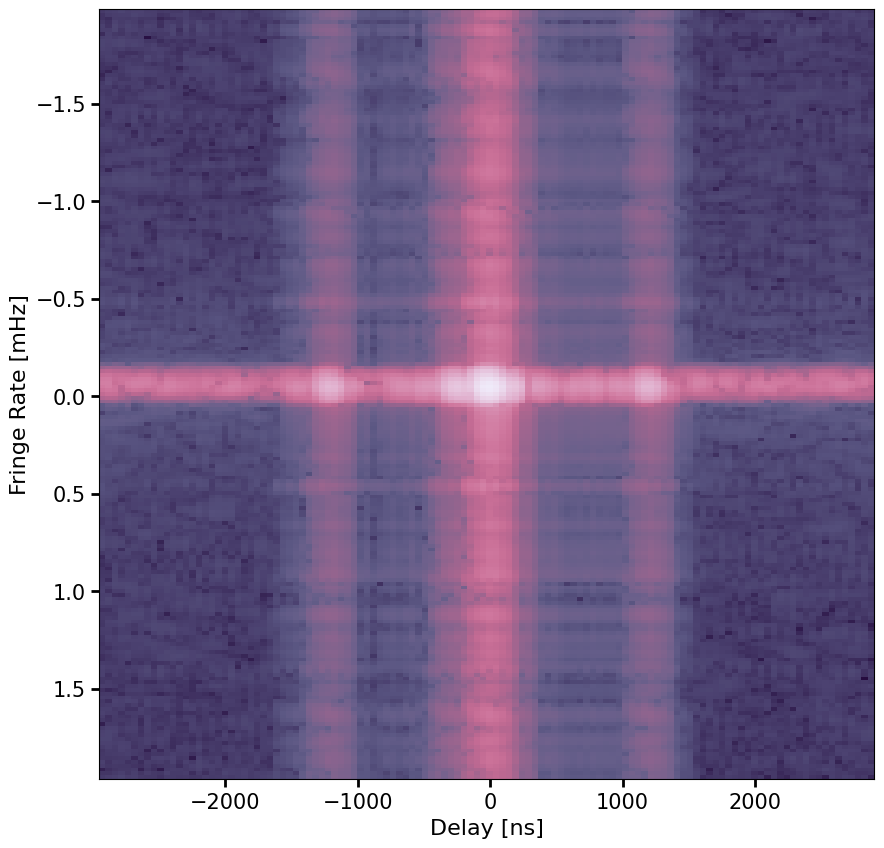

In [ ]:
corr_dlfr=plot_waterfalls(vis_corr, freqs_corr, lst_corr, windows='blackman-harris', mode='log', 
                    cmap=cmc.acton, dynamic_range=5, limit_drng='all',
                    baseline=None, horizon_color='magenta',
                    freq_window_kwargs=None, time_window_kwargs=None)

# plt.savefig(result_dir+'Corr_viss_dlfr_space.png',bbox_inches='tight',dpi=300)

In [ ]:
corr_dlfr[0]

In [ ]:
clean_dlfr=plot_waterfalls(total_data_true.T, freqs*1e6, lsts, windows='blackman-harris', mode='log', 
                    cmap=cmc.acton, dynamic_range=5, limit_drng='all',
                    baseline=None, horizon_color='magenta',
                    freq_window_kwargs=None, time_window_kwargs=None)
# plt.savefig('/Users/user/Documents/Codes/hydra_sys_project1/hydra-pspec-systematic-multiplicative/outputs/Sky data.png', transparent=True,
            # bbox_inches='tight',dpi=300)
# plt.title("Simulated visibilities in Delay-Fringe rate space",fontsize=16)
# plt.savefig(result_dir+run_version+'/plots/'+'data_in_dlfr_space.png',bbox_inches='tight',dpi=300)

ValueError: operands could not be broadcast together with shapes (60,60) (1,120) 

# Plotting results

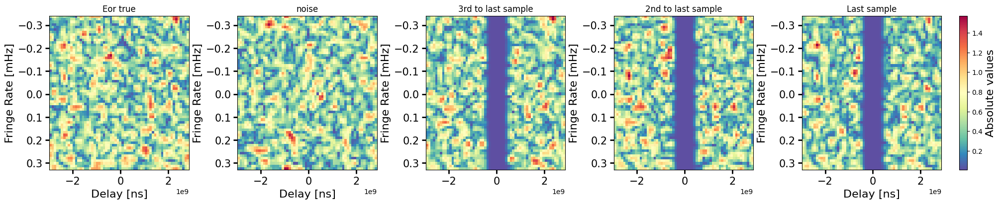

In [ ]:
fig,axs = plt.subplots(1,5,layout="constrained",figsize=(20,4))
# vmax = np.log10(np.abs(eor_true)).max()
# vmin = vmax - 5
vmin=None
vmax=None
eor_dlfr=plot_waterfalls(eor_true, freqs, lsts, windows='blackman-harris', fig=fig,ax=axs[0], mode='abs', 
                vmin=vmin,vmax=vmax,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[0].set_title("Eor true")

noise_dlfr=plot_waterfalls(n, freqs, lsts, windows='blackman-harris', fig=fig,ax=axs[1], mode='abs', 
                vmin=vmin,vmax=vmax,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[1].set_title('noise')
signal_amps_0=plot_waterfalls(signal_amps[-1,:,:], freqs, lsts, windows='blackman-harris', fig=fig,ax=axs[2], xlabel='',mode='abs', 
                vmin=vmin,vmax=vmax,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[2].set_title("3rd to last sample")

signal_amps_1 = plot_waterfalls(signal_amps[-2,:,:], freqs, lsts, windows='blackman-harris', mode='abs', xlabel='',fig=fig,ax=axs[3],
                vmin=vmin,vmax=vmax,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[3].set_title("2nd to last sample")

signal_amps_2=plot_waterfalls(signal_amps[-3,:,:], freqs, lsts, windows='blackman-harris', mode='abs', fig=fig,ax=axs[4],
                vmin=vmin,vmax=vmax,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[4].set_title("Last sample")

_=fig.colorbar(eor_dlfr[0], ax=axs, orientation='vertical', fraction=0.9, pad=0.02)
vis_label = r"Absolute values"
_.set_label(vis_label,c='black',fontsize=16)
# _.ax.tick_params(axis='y',which='both', color='black', labelcolor='black',labelsize=15)

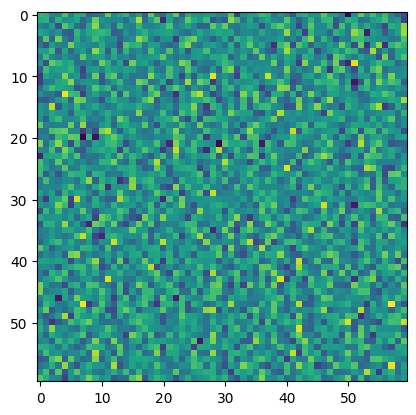

In [ ]:
fig,axs = plt.subplots(1,4,layout="constrained",figsize=(16,4))
vmax = np.log10(np.abs(eor_true)).max()
vmin = vmax - 5
eor_dlfr=plot_waterfalls(eor_true, freqs, lsts, windows='blackman-harris', fig=fig,ax=axs[0], mode='log', 
                vmin=vmin,vmax=vmax,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[0].set_title("Eor true")
signal_amps_0=plot_waterfalls(signal_amps[-1,:,:].T, freqs, lsts, windows='blackman-harris', fig=fig,ax=axs[1], xlabel='',mode='log', 
                vmin=vmin,vmax=vmax,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[1].set_title("3rd to last sample")

signal_amps_1 = plot_waterfalls(signal_amps[-2,:,:].T, freqs, lsts, windows='blackman-harris', mode='log', xlabel='',fig=fig,ax=axs[2],
                vmin=vmin,vmax=vmax,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[2].set_title("2nd to last sample")

signal_amps_2=plot_waterfalls(signal_amps[-3,:,:].T, freqs, lsts, windows='blackman-harris', mode='log', fig=fig,ax=axs[3],
                vmin=vmin,vmax=vmax,cmap='Spectral_r', dynamic_range=5, limit_drng='all',
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
axs[3].set_title("Last sample")

_=fig.colorbar(eor_dlfr[0], ax=axs, orientation='vertical', fraction=0.9, pad=0.02)
vis_label = r"$\log_{10}|\tilde{V}(\tau, f)|$ [Jy Hz s]"
_.set_label(vis_label,c='black',fontsize=16)
# _.ax.tick_params(axis='y',which='both', color='black', labelcolor='black',labelsize=15)

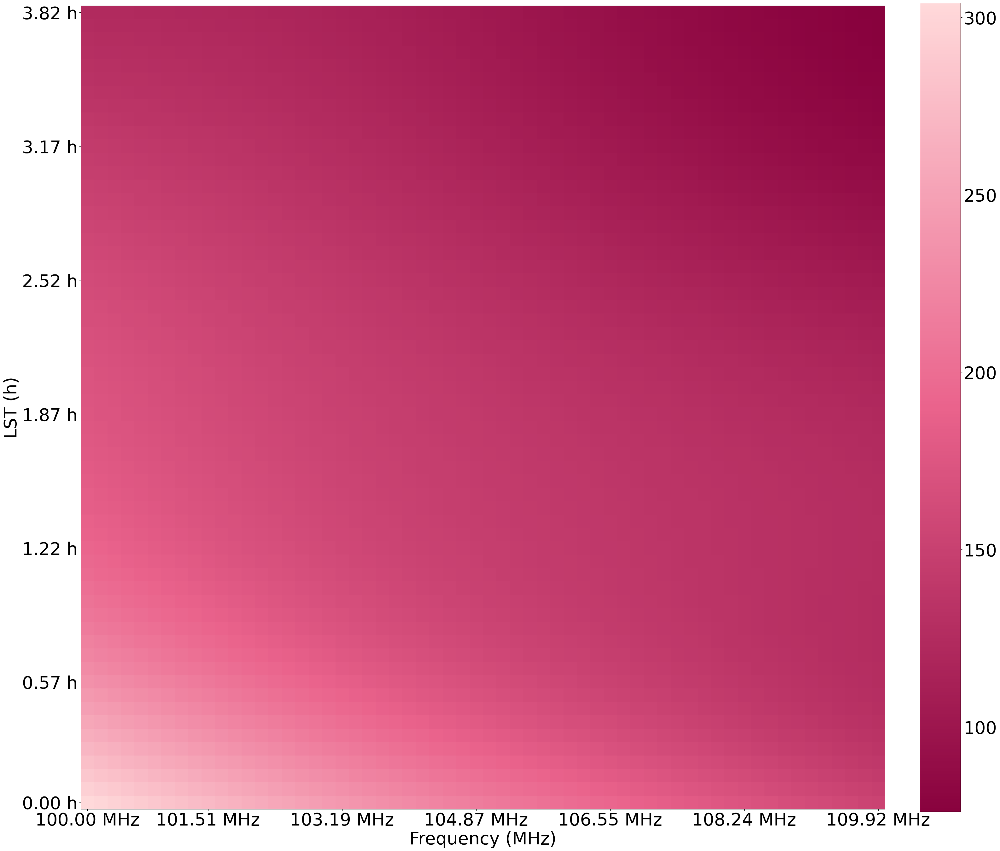

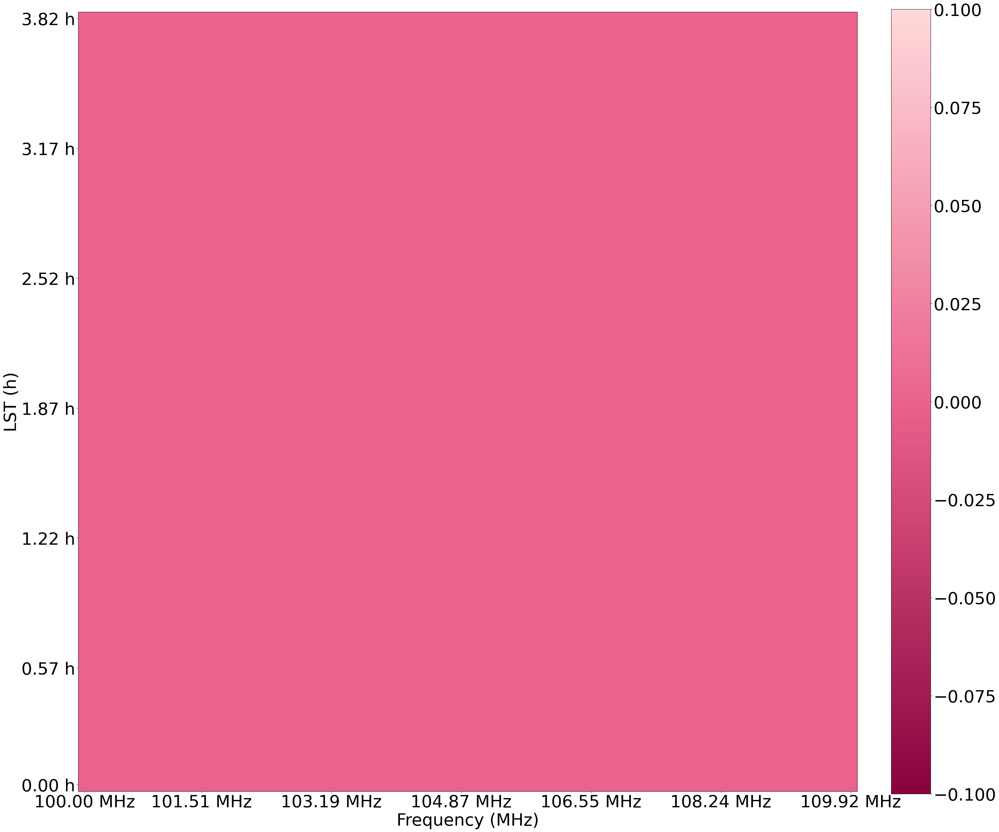

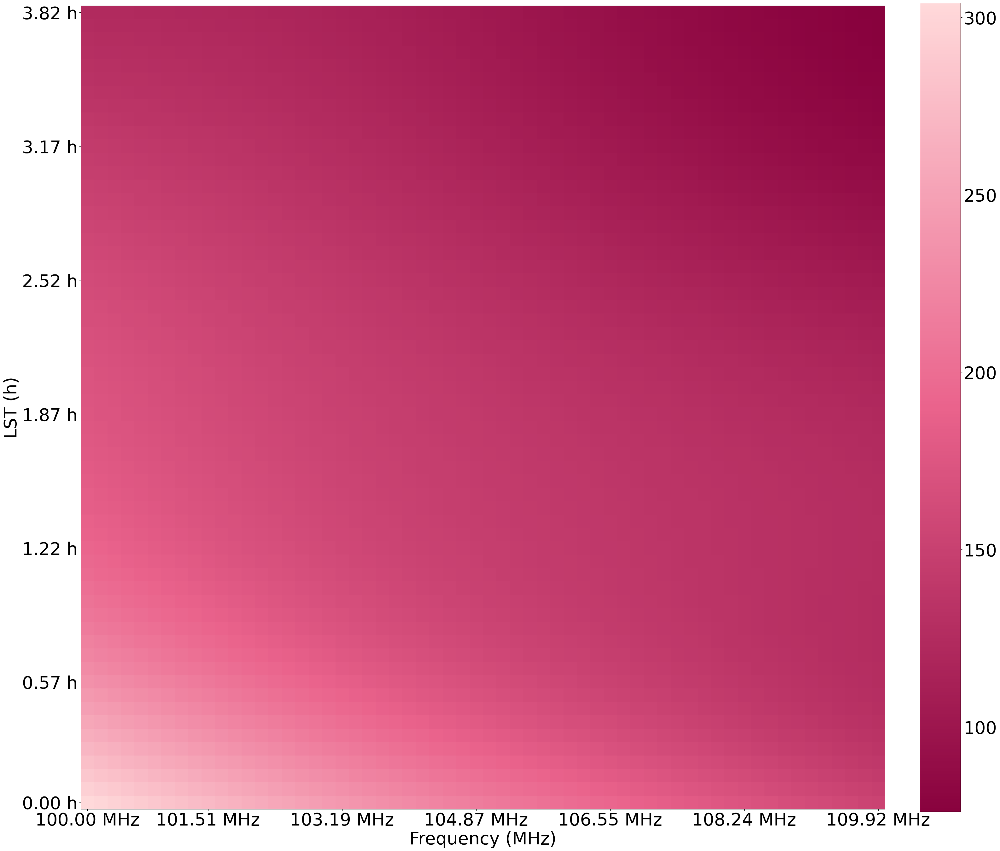

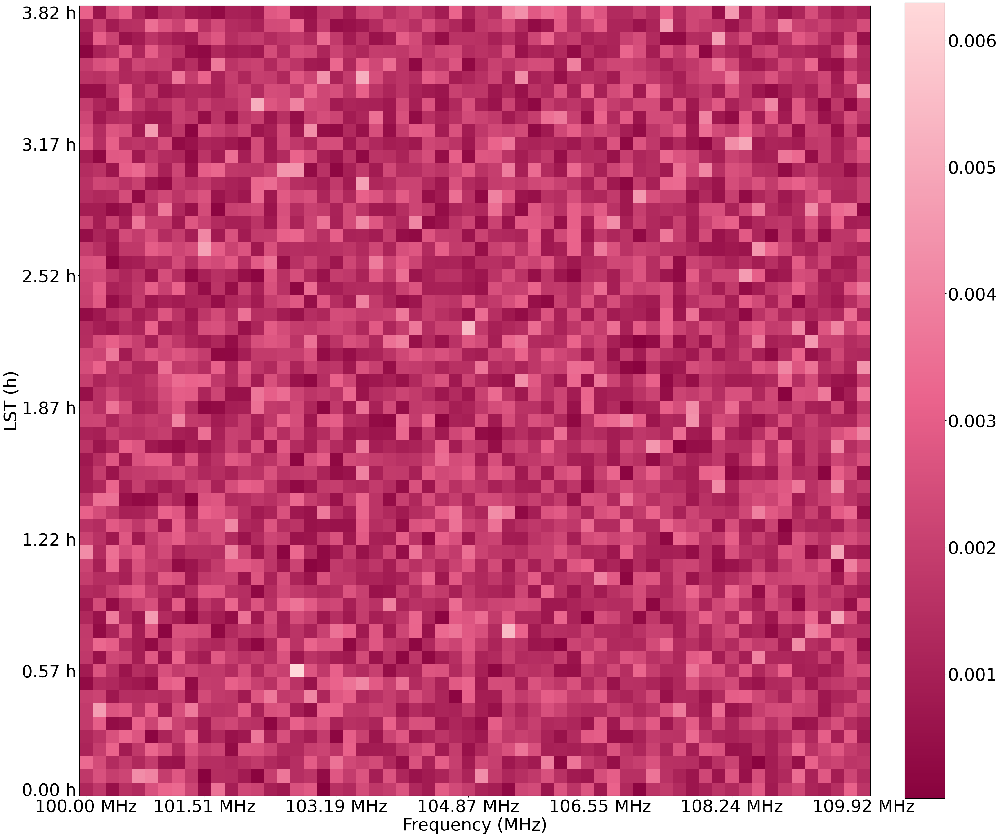

In [ ]:
import matplotlib as mpl

mpl.rcParams['font.size']=40

data_list=[np.abs(data_true),np.abs(model),np.abs(model-data_true),np.abs(n.T)]
names=['true_sky_model','sampled_sky_model','residuals','noise']
for i in range(0,4):
    fig,ax = plt.subplots(1,1,figsize=(36,36))

    im=ax.imshow(data_list[i],cmap=paper_cmap, origin='lower', norm='linear')
    plt.colorbar(im, ax=ax,fraction=0.046, pad=0.04)

    ax.set_xticks(xticklocs)
    ax.set_xticklabels(xticklabels)

    ax.set_yticks(yticklocs)
    ax.set_yticklabels(yticklabels)
    
    ax.set_xlabel("Frequency (MHz)")
    ax.set_ylabel("LST (h)")
    
    # plt.savefig(result_dir+run_version+'/plots/'+names[i]+'.png',bbox_inches='tight',dpi=300)


/Users/user/Documents/Codes/hydra_sys_project1/GCR_test_scripts/plotting_functions.py:745: RuntimeWarning: divide by zero encountered in log10
  vmax = np.log10(np.abs(use_data)).max()
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/uvtools/plot.py:109: RuntimeWarning: invalid value encountered in scalar subtract
  drng = vmax - vmin
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/uvtools/plot.py:45: RuntimeWarning: divide by zero encountered in log10
  data = np.log10(data)


Text(0.5, 1.0, 'Sampled visibilities in Delay-Fringe rate space')

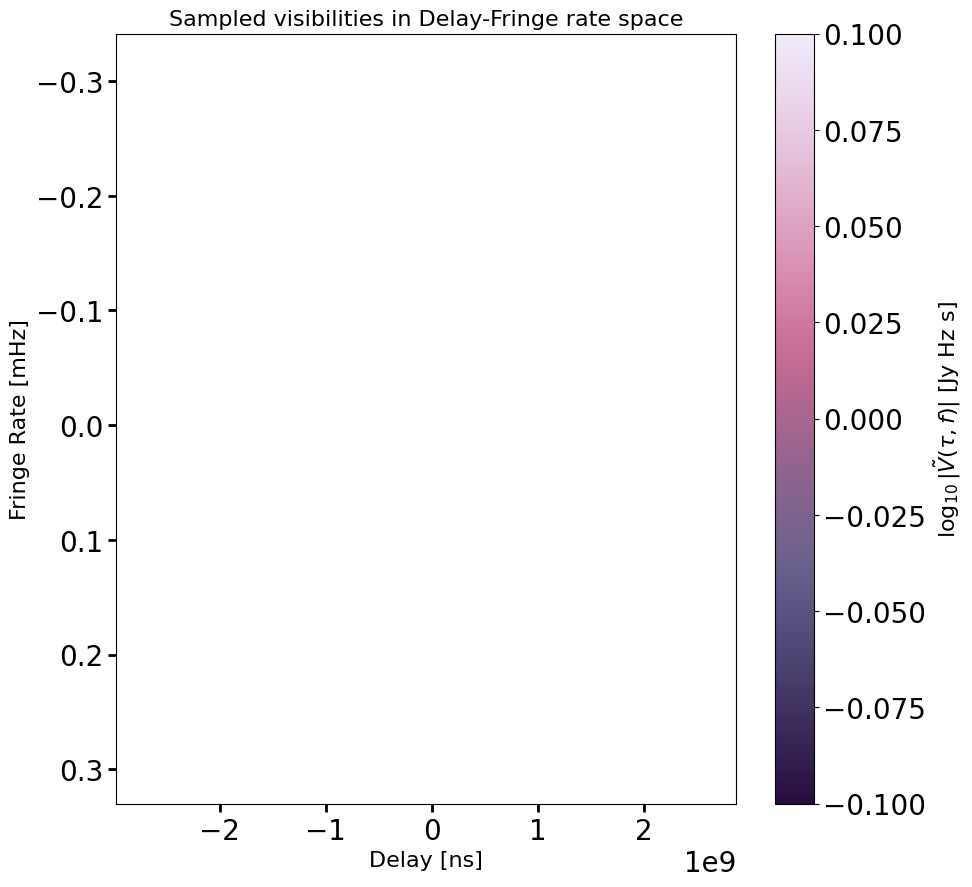

In [ ]:
sampled_dlfr=plot_waterfalls(model, freqs, lsts, windows='blackman-harris', mode='log', 
                    cmap=cmc.acton, dynamic_range=5, limit_drng='all',
                    baseline=None, horizon_color='magenta',
                    freq_window_kwargs=None, time_window_kwargs=None)
# plt.savefig('/Users/user/Documents/Codes/hydra_sys_project1/hydra-pspec-systematic-multiplicative/outputs/Sky data.png', transparent=True,
            # bbox_inches='tight',dpi=300)
plt.title("Sampled visibilities in Delay-Fringe rate space",fontsize=16)
# plt.savefig('/Users/user/Documents/Second_year_review/Images/figure_0a.png',bbox_inches='tight',dpi=300)

Text(0.5, 1.0, 'Residuals of DL-FR transform')

<Figure size 3200x3000 with 0 Axes>

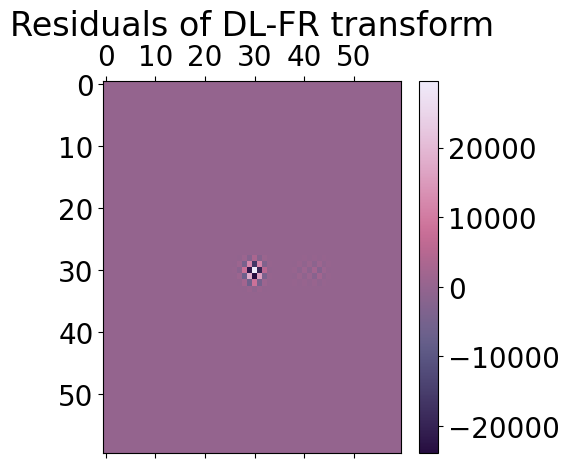

In [ ]:
plt.figure(figsize=(32,30))
plt.matshow((sampled_dlfr[1]-clean_dlfr[1]).real,aspect='auto',cmap=cmc.acton)
plt.colorbar()
plt.title('Residuals of DL-FR transform')

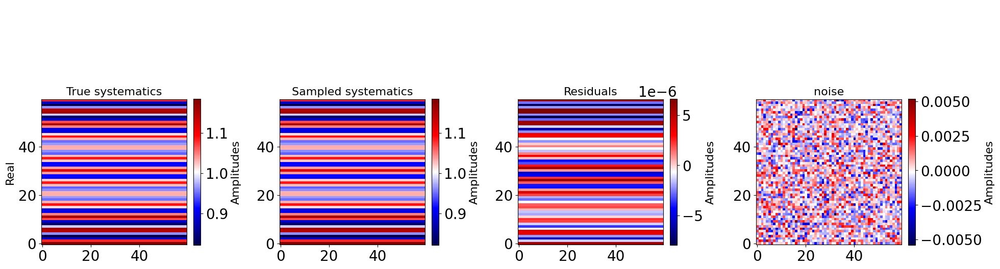

In [ ]:
master_plotter([sys_model_true,sys_model_sampled,sys_model_sampled-sys_model_true, n.T],col_labels=['True systematics','Sampled systematics','Residuals','noise'],fig_title=' ',save_flag=False,imag_flag=False)

In [ ]:
eor_res = eor_true[:Ntimes,:Nfreqs]-signal_amps
fg_res = fg_true[:Ntimes,:Nfreqs] - fg_amps @ fgmodes.T
sys_res = sys_model_true-sys_model_sampled

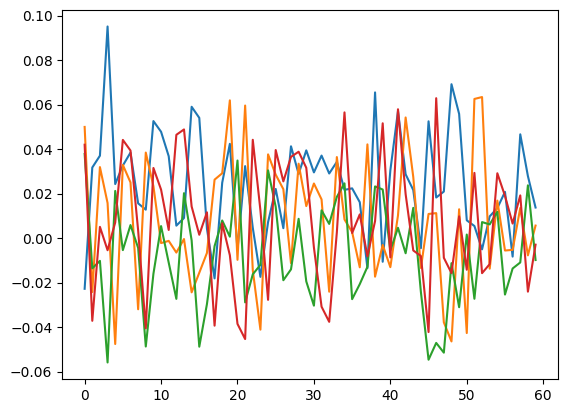

In [ ]:
for i in range(4):
    plt.plot(signal_amps[-1,i].real - eor_true.T[i].real)

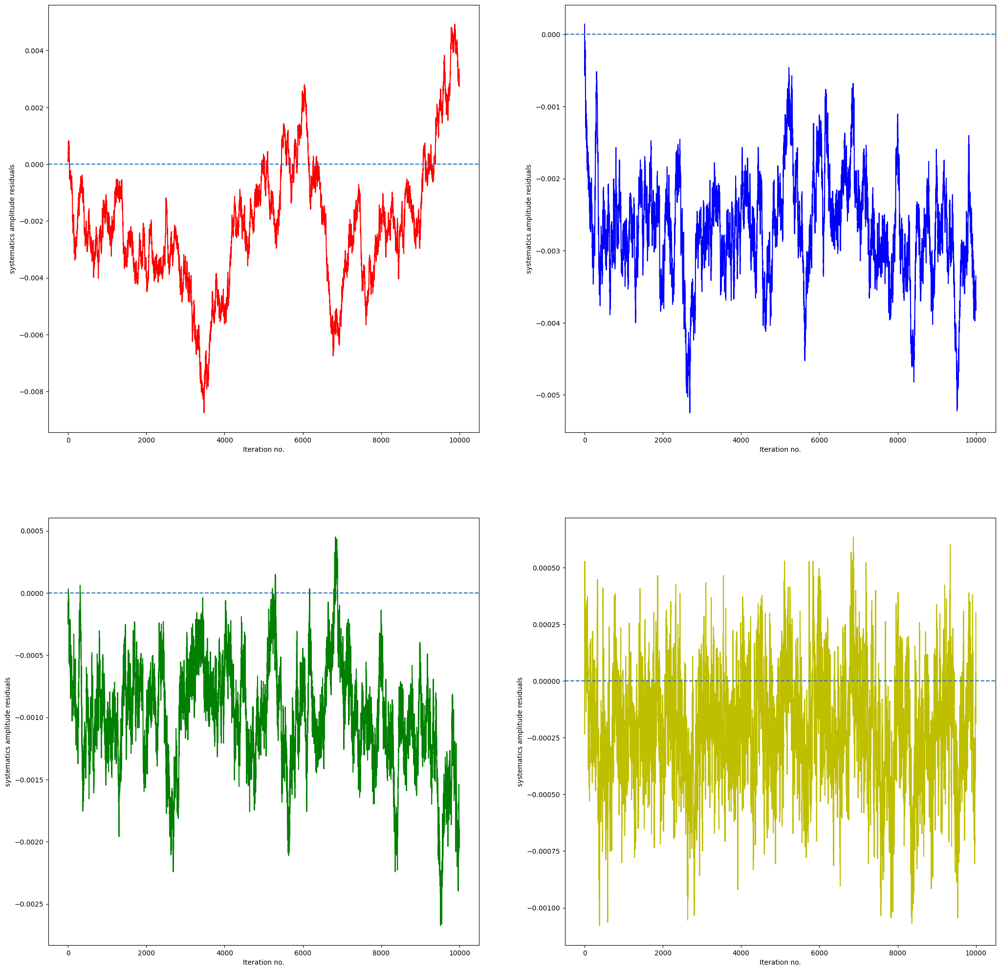

In [ ]:
sys_amps_true = np.array([4., 4.1, 5., -2.]) #np.array([4., 4.01])
sys_amps_complete = np.load(result_dir+run_version+'/b-sys.npy')

fig,axs=plt.subplots(2,2,figsize=(25,25))
colours = ['r', 'b', 'g', 'y', 'c', 'm']
for i,ax in enumerate(axs.flatten()):
    ax.plot(sys_amps_true[i].real-sys_amps_complete[:,i].real,c=colours[i])
    # plt.plot(fgmodes[:,1].real)
    ax.axhline(0,ls='dashed')
    ax.set_ylabel('systematics amplitude residuals')
    ax.set_xlabel('Iteration no.')

In [ ]:
signal_amps_complete.shape

(1000, 60)

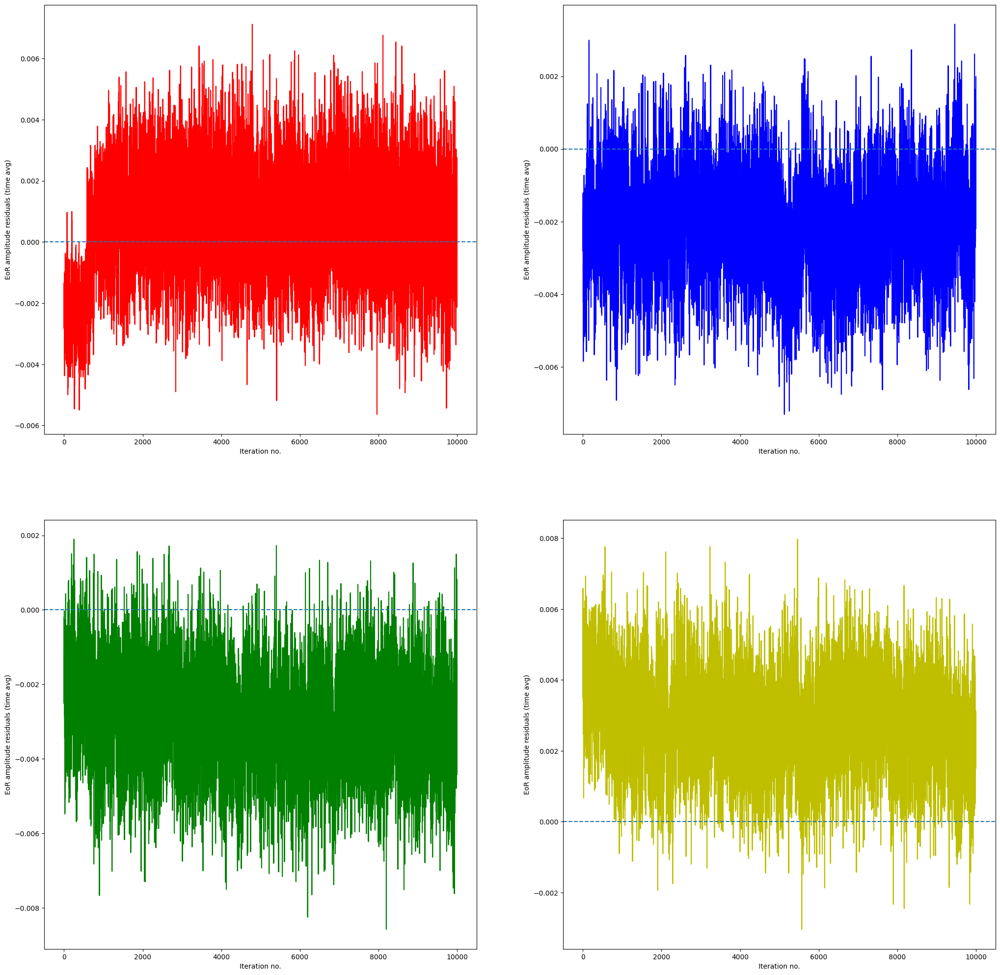

In [ ]:
signal_amps_complete = np.load(result_dir+run_version+'/gcr-eor.npy').mean(axis=1)

fig,axs=plt.subplots(2,2,figsize=(25,25))
colours = ['r', 'b', 'g', 'y', 'c', 'm']
for i,ax in enumerate(axs.flatten()):
    ax.plot(eor_true.mean(axis=1)[i].real-signal_amps_complete[:,i].real,c=colours[i])
    ax.axhline(0,ls='dashed')
    ax.set_ylabel('EoR amplitude residuals (time avg)')
    ax.set_xlabel('Iteration no.')

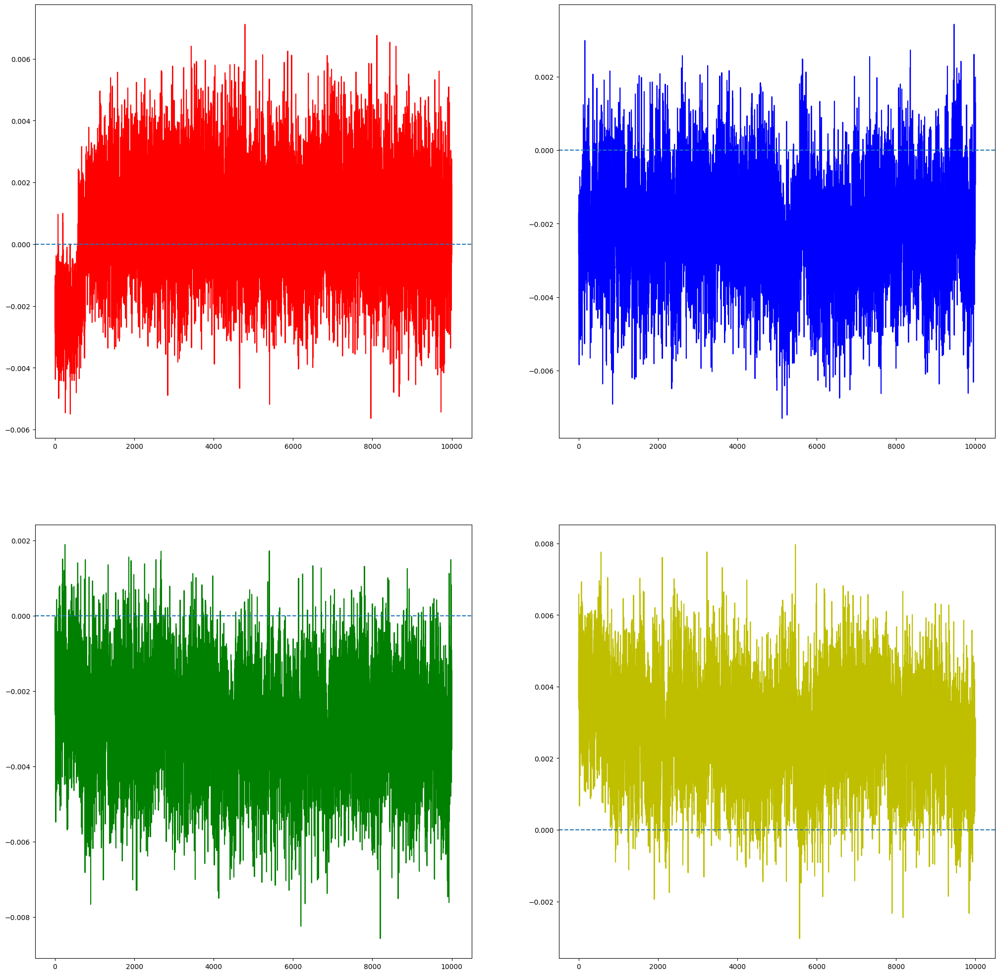

In [ ]:
fg_amps_complete = np.load(result_dir+run_version+'/gcr-eor.npy').mean(axis=1)

fig,axs=plt.subplots(2,2,figsize=(25,25))
colours = ['r', 'b', 'g', 'y', 'c', 'm']
for i,ax in enumerate(axs.flatten()):
    ax.plot(eor_true.mean(axis=1)[i].real-signal_amps_complete[:,i].real,c=colours[i])
    ax.axhline(0,ls='dashed')

divide by zero encountered in log10
invalid value encountered in scalar subtract


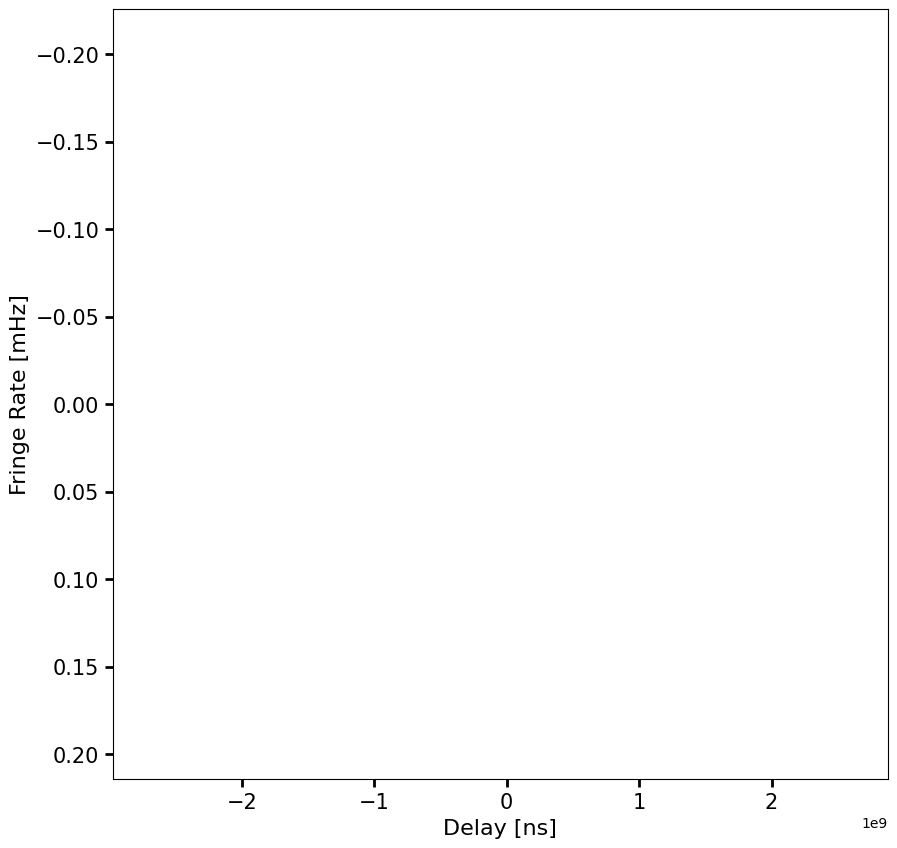

In [ ]:
eor_true=np.load('/Users/user/Documents/Codes/hydra_sys_project1/multi_phil/hydra-pspec-systematic/paper_plots/fixed_sky/gcr-eor.npy')
freqs = np.linspace(100., 120., 120) ##120) 
freqs=freqs[:60]
lsts = np.linspace(0., 1., 40)


eor_dlfr_test=plot_waterfalls(eor_true.mean(axis=0), freqs, lsts, windows='blackman-harris', mode='log', 
                    cmap=cmc.acton, dynamic_range=5, limit_drng='all',
                    baseline=None, horizon_color='magenta',
                    freq_window_kwargs=None, time_window_kwargs=None)

# Traces

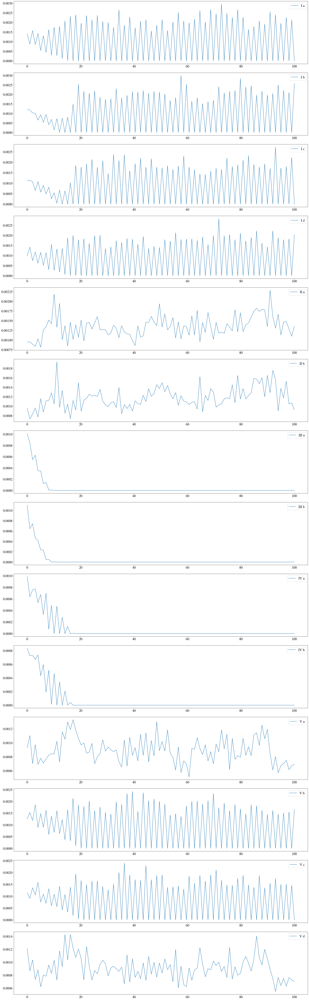

In [ ]:

# run_version_arr = ['masked_data','high_dl_fr_0','low_dl_low_fr']
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/'
run_version_arr = ['low_dl_fr_0','low_dl_fr_20','high_dl_fr_0','high_dl_fr_20','low_dl_low_fr']
conf_interval=95
Nburn = 10
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)

dl_inds=[[3,4,5,6],[3,4,5,6],[10,11,12,13],[10,11,12,13],[3,3,3,3]]
fig, ax = plt.subplots(14,1,figsize=(25, 80))
i=0
colors=['r','b','k','g','m']
fig_labels=['I','II','III','IV','V']
xvals = np.linspace(0,100,100)
for run_version in run_version_arr:
    ps_sample = np.load(result_dir+run_version+'/dps-eor.npy')
    ln_post = np.load(result_dir+run_version+'/ln-post.npy')
    ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
    ps_mean = np.mean(ps_sample, axis=0)

    if i==0:
        ax[0].plot(xvals,ps_sample[0:100,23],label='I a')
        ax[1].plot(xvals,ps_sample[0:100,24],label='I b')
        ax[2].plot(xvals,ps_sample[0:100,36],label='I c')
        ax[3].plot(xvals,ps_sample[0:100,37],label='I d')
    elif i==1:
        ax[4].plot(xvals,ps_sample[0:100,24],label='II a')
        ax[5].plot(xvals,ps_sample[0:100,36],label='II b')
    elif i==2:
        ax[6].plot(xvals,ps_sample[0:100,24],label='III a')
        ax[7].plot(xvals,ps_sample[0:100,36],label='III b')
    elif i==3:
        ax[8].plot(xvals,ps_sample[0:100,24],label='IV a')
        ax[9].plot(xvals,ps_sample[0:100,36],label='IV b')
    elif i==4:
        ax[10].plot(xvals,ps_sample[0:100,16],label='V a')
        ax[11].plot(xvals,ps_sample[0:100,23],label='V b')
        ax[12].plot(xvals,ps_sample[0:100,37],label='V c')
        ax[13].plot(xvals,ps_sample[0:100,44],label='V d')

    i=i+1

for a in ax.flatten():
    a.legend(loc="best",fontsize=20)
    # a.set_xscale('log')
    # a.set_yscale('log')
fig.tight_layout()
# plt.savefig(result_dir+'/delay_power_spectrum.pdf',bbox_inches='tight',dpi=300)


# Checking sky models and FG models for a few iterations

Text(0.5, 1.0, 'Zoomed in trace for iterations inspected')

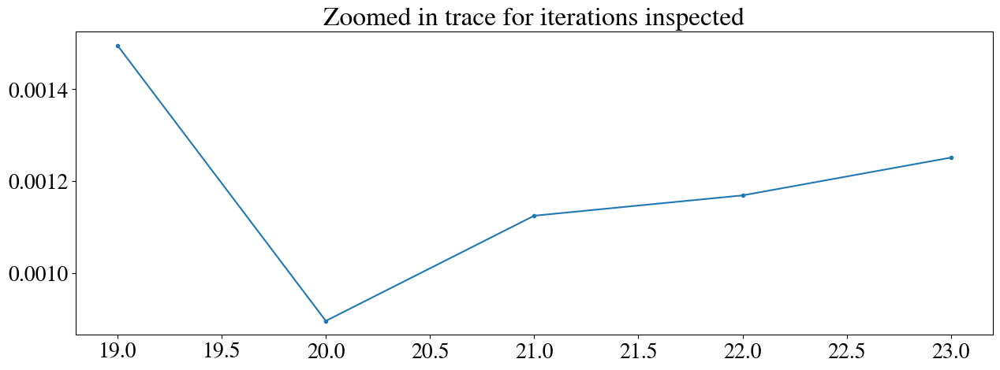

In [ ]:
ps_sample = np.load(result_dir+'low_dl_fr_20'+'/dps-eor.npy')
plt.figure(figsize=(15,5))
plt.plot([19,20,21,22,23],ps_sample[19:24,36],marker='.')
plt.title("Zoomed in trace for iterations inspected")

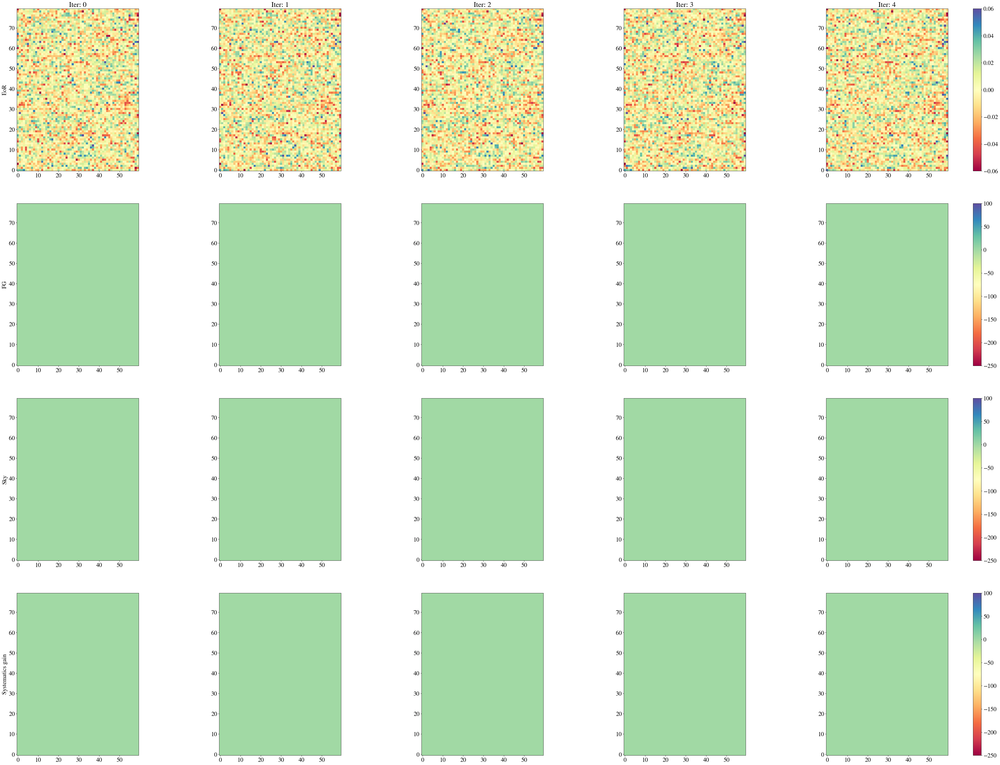

In [ ]:
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/1e7_bound/'
eor_true=np.load(result_dir+'10modes/eor_true.npy')
fg_true=fg_true[:Ntimes,:Nfreqs]
sys_model_true = (1. + (sys_modes_operator @ sys_amps_true).reshape([Nfreqs,Ntimes]).T)

fig, ax = plt.subplots(4,5,figsize=(75, 45))

for i in range(5):
    eor_gcr=np.load(result_dir+'10modes/gcr-eor.npy')[i,:,:]
    fg_amps=np.load(result_dir+'10modes/fg-amps.npy')[i,:]
    b_sys_gcr = np.load(result_dir+'10modes/b-sys.npy')[i,:]
    sky = eor_gcr + fg_amps @ fgmodes[:,:10].T
    sys_model = (1+(sys_modes_operator @ b_sys_gcr).reshape([Nfreqs,Ntimes]).T)
    im_eor=ax[0,i].imshow((eor_true-eor_gcr).real,origin='lower',cmap='Spectral',vmin=-0.06,vmax=0.06)
    
    im_fg=ax[1,i].imshow((fg_true-(fg_amps @ fgmodes[:,:10].T)).real,origin='lower',cmap='Spectral',vmin=-250,vmax=100)
    
    im_sky=ax[2,i].imshow(((eor_true+fg_true)-sky).real,origin='lower',cmap='Spectral',vmin=-250,vmax=100)
    
    im_sys=ax[3,i].imshow((sys_model_true-sys_model).real,origin='lower',cmap='Spectral',vmin=-250,vmax=100)


ylabel=['EoR','FG','Sky',"Systematics gain"]
for i in range(5):
    ax[0,i].set_title("Iter: "+str(i))
for i in range(4):
    ax[i,0].set_ylabel(ylabel[i])
_=fig.colorbar(im_eor, ax=ax[0,:], orientation='vertical', fraction=0.2, pad=0.02)
_=fig.colorbar(im_fg, ax=ax[1,:], orientation='vertical', fraction=0.2, pad=0.02)
_=fig.colorbar(im_sky, ax=ax[2,:], orientation='vertical', fraction=0.2, pad=0.02)
_=fig.colorbar(im_sys, ax=ax[3,:], orientation='vertical', fraction=0.2, pad=0.02)

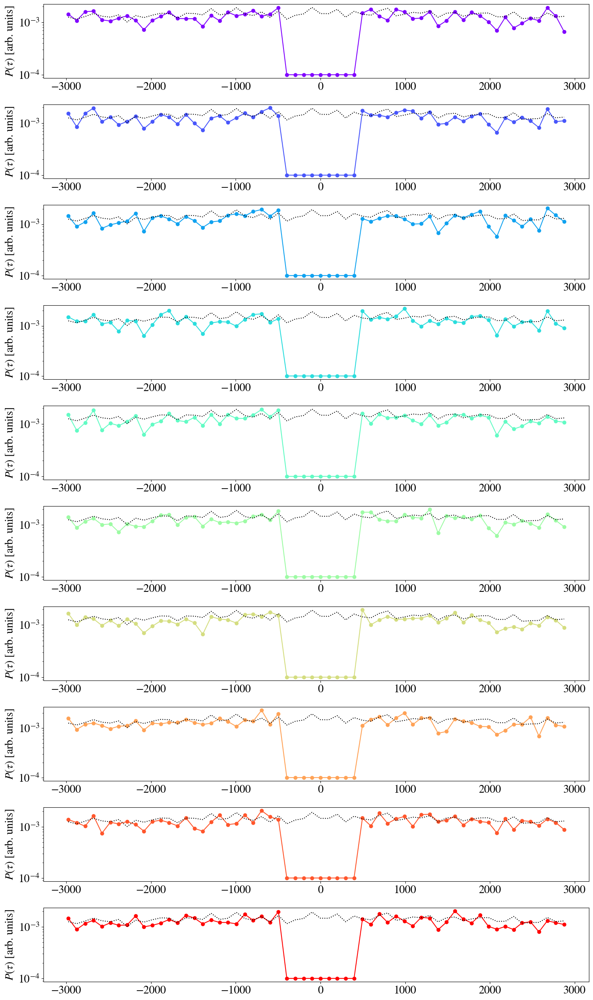

In [ ]:

# run_version_arr = ['masked_data','high_dl_fr_0','low_dl_low_fr']
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/1e7_bound/'
conf_interval=95
fig, ax = plt.subplots(10,1,figsize=(15, 25))
colors = iter(plt.cm.rainbow(np.linspace(0, 1, 10)))

for i in range(10):
    ps_sample = np.load(result_dir+'10modes/dps-eor.npy')[19+i,:]
    ln_post = np.load(result_dir+'10modes/ln-post.npy')[19+i]
    ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
    df = (freqs[1] - freqs[0]) * u.MHz
    delays = np.fft.fftshift(np.fft.fftfreq(Nfreqs, d=df.to("1/ns")))
    
    # Confidence interval of delay power spectrum posteriors
    percentile = conf_interval/2 + 50
    dps_eor_hp_ubound = np.percentile(ps_sample, percentile, axis=0)
    dps_eor_hp_lbound = np.percentile(ps_sample, 100-percentile, axis=0)
    dps_eor_hp_err = np.vstack((
        ps_sample - dps_eor_hp_lbound,
        dps_eor_hp_ubound - ps_sample
    ))
    
    ax[i].plot(
                    delays,
                    ps_sample,
                    color=next(colors),
                    # ls="",
                    marker="o",
                    label=f"Recovered ({conf_interval}% Confidence)"
                    )
    ax[i].plot(delays, ps_true, "k:", label="True")

    ax[i].set_ylabel(r"$P(\tau)$ [arb. units]")
    # ax.set_title("EoR Delay Power Spectrum Comparison")
    ax[i].set_yscale("log")
    # ax[i].grid()
    
    # ax[i].text(0.95,0.07,"Iter: "+str(19+i),fontsize=15, bbox=bbox,
            # transform=ax[i].transAxes, horizontalalignment='right')


fig.tight_layout()
# plt.savefig(result_dir+'/delay_power_spectrum.pdf',bbox_inches='tight',dpi=300)


Text(0.5, 0, 'Iteration')

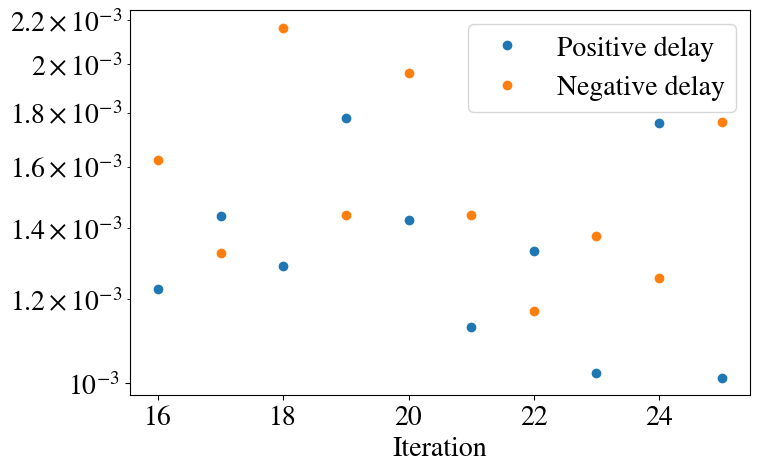

In [ ]:
ps_sample = np.load(result_dir+'10modes/dps-eor.npy')[16:26,:]
xvals=np.linspace(16,25,10)
plt.figure(figsize=(8,5))
plt.plot(xvals,ps_sample[:,36],'o',label='Positive delay')
plt.plot(xvals,ps_sample[:,24],'o',label='Negative delay')
plt.yscale('log')
plt.legend(loc='best')
plt.xlabel("Iteration")

Text(0.5, 0, 'Iteration')

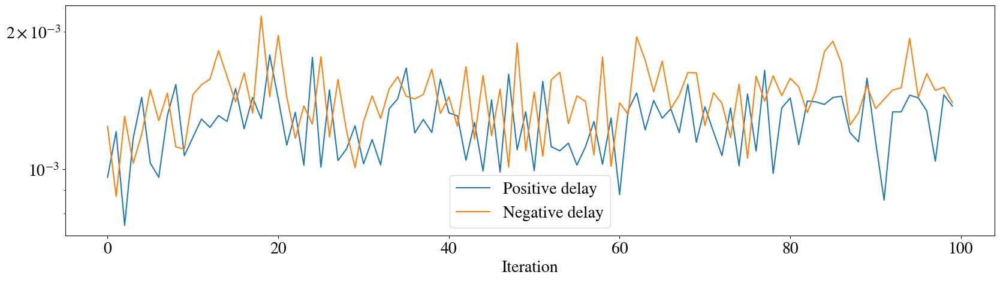

In [ ]:
ps_sample_24 = np.load(result_dir+'10modes/dps-eor.npy')[:,24]
ps_sample_36 = np.load(result_dir+'10modes/dps-eor.npy')[:,36]

plt.figure(figsize=(20,5))
plt.plot(ps_sample_36[:100],label='Positive delay')
plt.plot(ps_sample_24[:100],label='Negative delay')
plt.yscale('log')
plt.legend(loc='best')
plt.xlabel("Iteration")

3 20
2.974999999999976e-07 0.0014362605302870003
4 20
3.966666666666634e-07 0.0014362605302870003
5 20
4.958333333333293e-07 0.0014362605302870003
6 20
5.949999999999952e-07 0.0014362605302870003


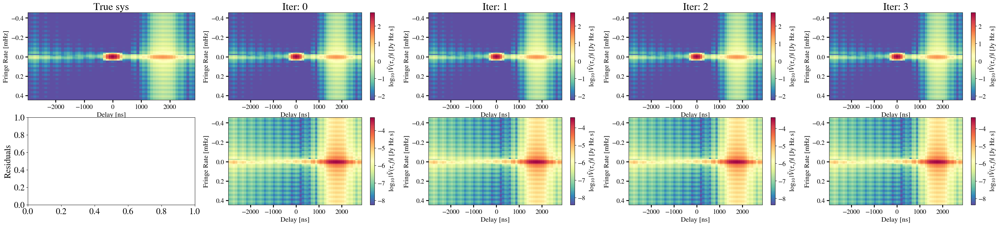

In [ ]:
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/1e7_bound/'

nm_list = [(3,20),(4,20),(5,20),(6,20)]
sys_modes_operator = sys_modes(freqs_Hz=freqs*1e6, 
                                    times_sec=lsts * 24./(2.*np.pi) * 3600., 
                                    modes=nm_list)

fig, ax = plt.subplots(2,5,figsize=(40, 8))
i=0
plot_op_true=plot_waterfalls(sys_model_true, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=ax[0,0], mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=False,
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
for i in range(4):
    b_sys=np.load(result_dir+'10modes/b-sys.npy')[i,:]
    sys_model = (1+(sys_modes_operator @ b_sys).reshape([Nfreqs,Ntimes]).T)
    plot_op=plot_waterfalls(sys_model, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=ax[0,i+1], mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=True,
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
    im=plot_waterfalls_from_dlfr(plot_op_true[1]-plot_op[1], freqs*1e6, lsts, fig=fig,ax=ax[1,i+1], mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=True,
                baseline=None, horizon_color='magenta')
    
ax[0,0].set_title("True sys")
ax[1,0].set_ylabel("Residuals")
for i in range(4):
    ax[0,i+1].set_title("Iter: "+str(i))

# _=fig.colorbar(plot_op[0], ax=ax, orientation='vertical', fraction=0.2, pad=0.02)

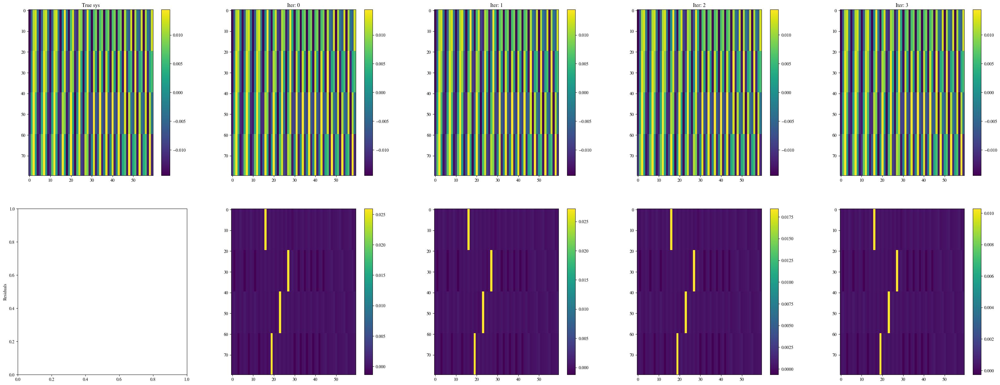

In [ ]:
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/1e7_bound/'

fig, ax = plt.subplots(2,5,figsize=(40, 15))

imt=ax[0,0].imshow((sys_model_true.real-1))
plt.colorbar(imt)
for i in range(4):
    b_sys=np.load(result_dir+'10modes/b-sys.npy')[i,:]
    sys_model = ((sys_modes_operator @ b_sys).reshape([Nfreqs,Ntimes]).T)     
    im = ax[0,i+1].imshow(sys_model.real)
    im2 = ax[1,i+1].imshow(((sys_model_true-1)-sys_model).real/(sys_model_true.real-1))
    plt.colorbar(im)
    plt.colorbar(im2)
    
ax[0,0].set_title("True sys")
ax[1,0].set_ylabel("Residuals")
for i in range(4):
    ax[0,i+1].set_title("Iter: "+str(i))

# _=fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.2, pad=0.02)

# Special test case for the problematic bins

In [ ]:
betas = np.loadtxt('paper_plots/ps_prior_check/beta.txt',dtype=complex,delimiter=',')
samples = np.loadtxt('paper_plots/ps_prior_check/samples.txt',dtype=complex,delimiter=',')

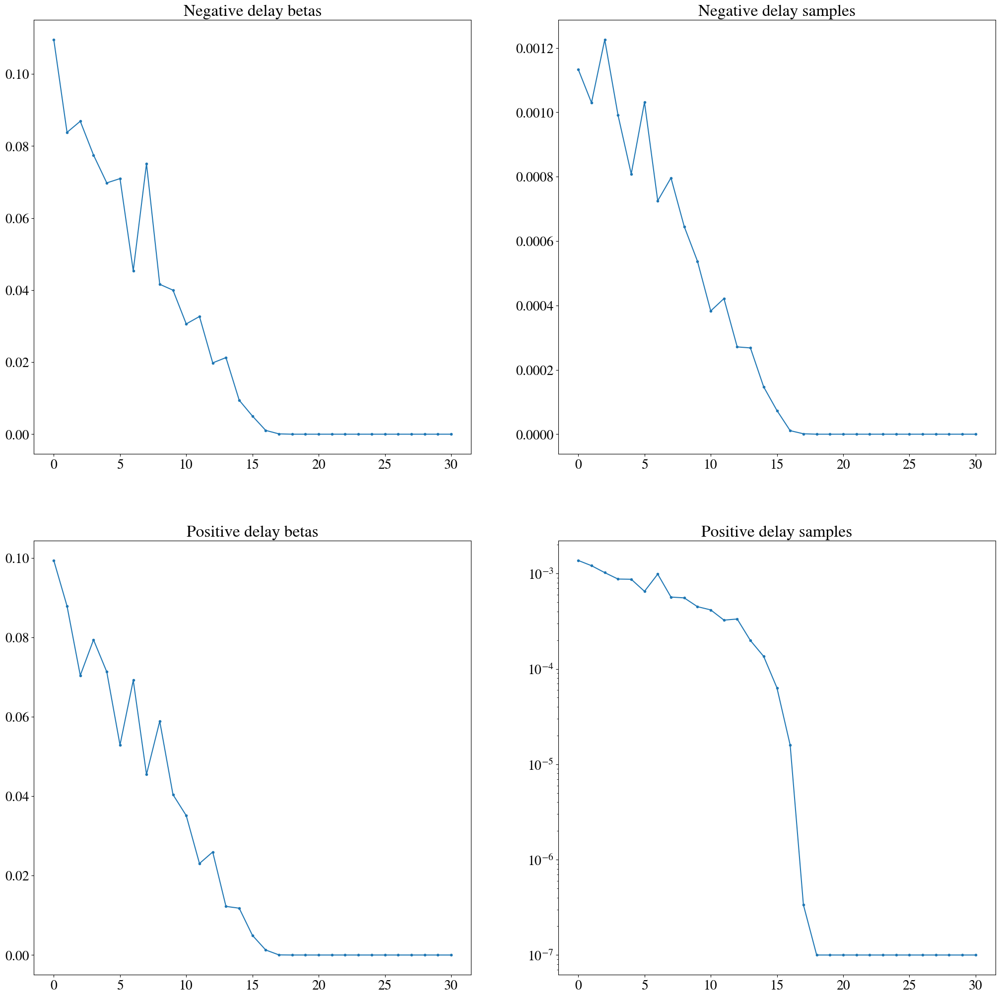

In [ ]:
fig,axs=plt.subplots(2,2,figsize=(25,25))
axs[0,0].plot(betas[:,24].real,marker='.')
axs[0,0].set_title('Negative delay betas')
axs[0,1].plot(samples[:,24].real,marker='.')
axs[0,1].set_title('Negative delay samples')
axs[1,0].plot(betas[:,36].real,marker='.')
axs[1,0].set_title('Positive delay betas')
axs[1,1].plot(samples[:,36].real,marker='.')
axs[1,1].set_title("Positive delay samples")
plt.yscale('log')

In [ ]:
def form_sk(s):
    axes=(1,)
    sk = np.fft.fftshift(s, axes=axes)
    sk = np.fft.ifftn(sk, axes=axes) * np.sqrt(s.shape[1]) # note normalisation
    sk = np.fft.ifftshift(sk, axes=axes)
    
    return sk

In [ ]:
eor_sols = np.load('paper_plots/ps_prior_check/gcr-eor.npy')

In [ ]:
sk=form_sk(eor_sols[0,:,:])

In [ ]:
pos_del_point = []
neg_del_point = []
for sam in eor_sols:
    sk = form_sk(sam)
    neg_del_point.append(sk[:,24])
    pos_del_point.append(sk[:,36])
neg_del_point = np.asarray(neg_del_point)
pos_del_point = np.asarray(pos_del_point)

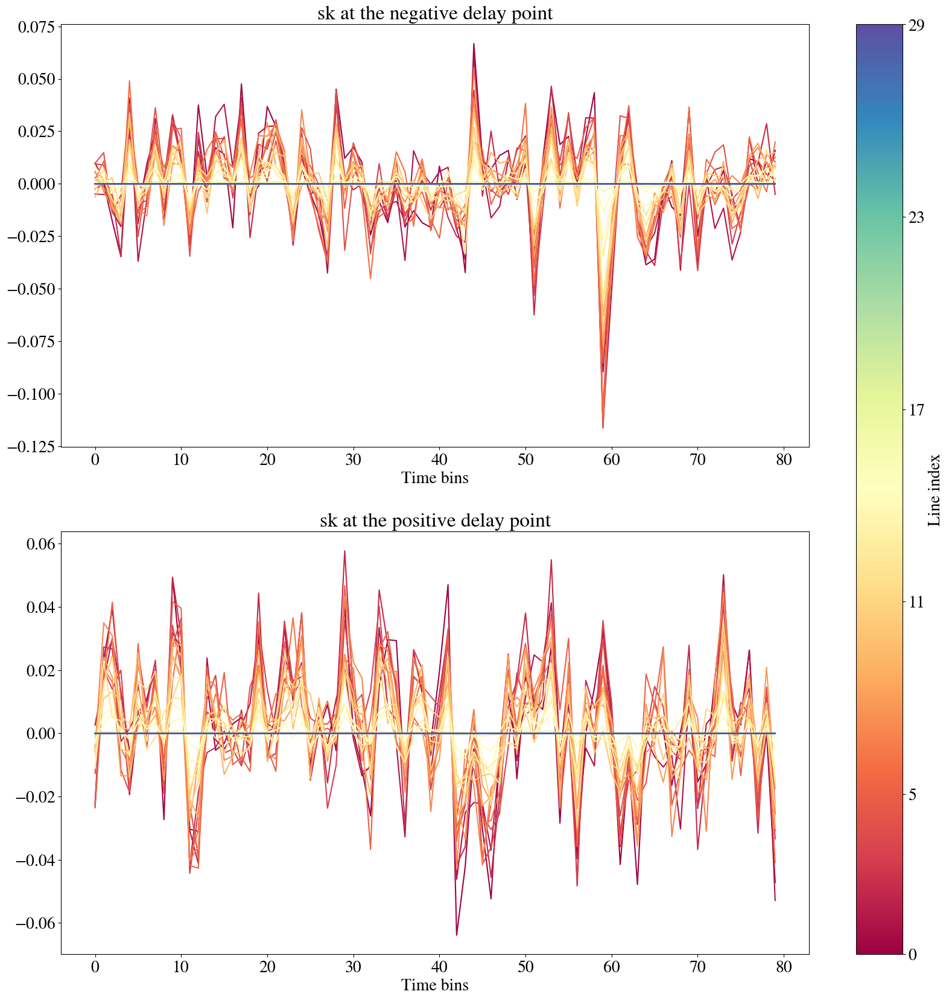

In [ ]:
cmap = mpl.colormaps['Spectral']

# Take colors at regular intervals spanning the colormap.
colors = cmap(np.linspace(0, 1, len(neg_del_point)))

norm = mpl.colors.Normalize(vmin=0, vmax=len(neg_del_point)-1)   # map line index -> [0,1]

fig,ax=plt.subplots(2,1,figsize=(20,20))
for i,c in enumerate(colors):
        ax[0].plot(neg_del_point[i].real,c=c)
        ax[1].plot(pos_del_point[i].real,c=c)

ax[0].set_title("sk at the negative delay point")
ax[0].set_xlabel("Time bins")

ax[1].set_title("sk at the positive delay point")
ax[1].set_xlabel("Time bins")

# make a mappable just for the colorbar
sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # older Matplotlib needs this

cbar=fig.colorbar(sm, ax=ax)
cbar.set_label("Line index")
cbar.set_ticks(np.linspace(0, len(neg_del_point)-1, min(len(neg_del_point), 6), dtype=int))

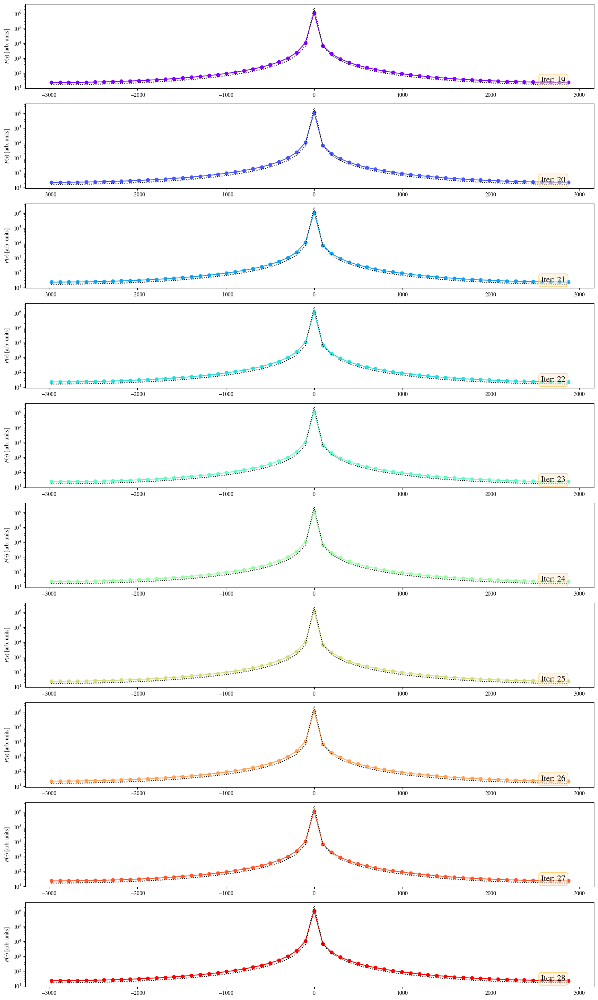

In [ ]:

# run_version_arr = ['masked_data','high_dl_fr_0','low_dl_low_fr']
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/1e7_bound/'

fig, ax = plt.subplots(10,1,figsize=(15, 25))
colors = iter(plt.cm.rainbow(np.linspace(0, 1, 10)))

for i in range(10):
    fg_amps = np.load(result_dir+'12modes/fg-amps.npy')[19+i]
    fg_ps_sample = calc_ps((fgmodes[:,:12] @ fg_amps.T).T)
    fg_ps_true = calc_ps(fg_true[:Ntimes,:Nfreqs])
    df = (freqs[1] - freqs[0]) * u.MHz
    delays = np.fft.fftshift(np.fft.fftfreq(Nfreqs, d=df.to("1/ns")))
    
    # Confidence interval of delay power spectrum posteriors
    percentile = conf_interval/2 + 50
    dps_fg_hp_ubound = np.percentile(fg_ps_sample, percentile, axis=0)
    dps_fg_hp_lbound = np.percentile(fg_ps_sample, 100-percentile, axis=0)
    dps_fg_hp_err = np.vstack((
        fg_ps_sample - dps_fg_hp_lbound,
        dps_fg_hp_ubound - fg_ps_sample
    ))
    
    ax[i].plot(
                    delays,
                    fg_ps_sample,
                    color=next(colors),
                    # ls="",
                    marker="o",
                    label=f"Recovered ({conf_interval}% Confidence)"
                    )
    ax[i].plot(delays, fg_ps_true, "k:", label="True")

    ax[i].set_ylabel(r"$P(\tau)$ [arb. units]")
    # ax.set_title("EoR Delay Power Spectrum Comparison")
    ax[i].set_yscale("log")
    # ax[i].grid()
    
    ax[i].text(0.95,0.07,"Iter: "+str(19+i),fontsize=15, bbox=bbox,
            transform=ax[i].transAxes, horizontalalignment='right')


fig.tight_layout()
# plt.savefig(result_dir+'/delay_power_spectrum.pdf',bbox_inches='tight',dpi=300)


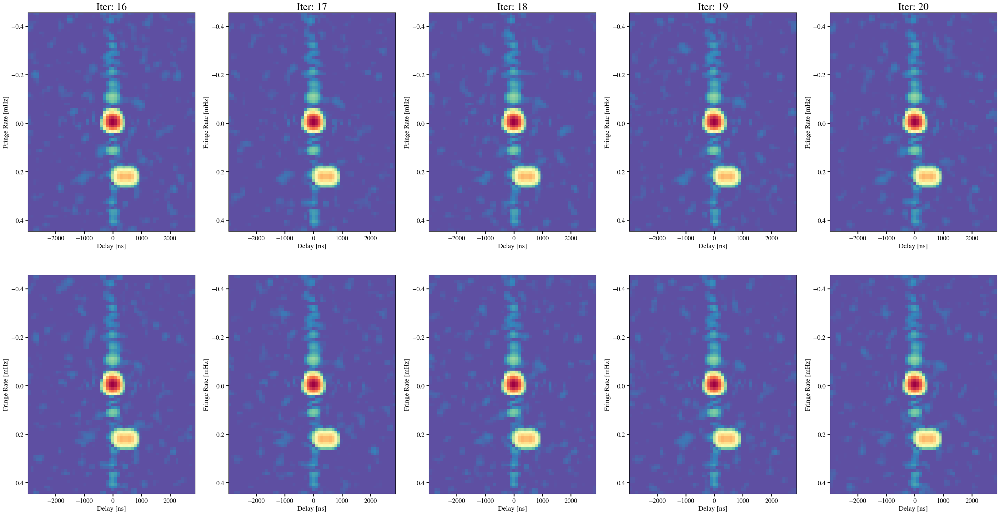

In [ ]:
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/'

nm_list = [(3,20),(4,20),(5,20),(6,20)]
sys_modes_operator = sys_modes(freqs_Hz=freqs*1e6, 
                                    times_sec=lsts * 24./(2.*np.pi) * 3600., 
                                    modes=nm_list)

fig, ax = plt.subplots(2,5,figsize=(40, 20))
i=0
for a in ax.flatten():
    b_sys=np.load(result_dir+'low_dl_fr_20/b-sys.npy')[16+i,:]
    fg_amps = np.load(result_dir+'low_dl_fr_20/fg-amps.npy')[16+i]
    eor_gcr=np.load(result_dir+'low_dl_fr_20/gcr-eor.npy')[16+i,:]
    sys_model = (sys_modes_operator @ b_sys).reshape((Ntimes,Nfreqs),order='F')
    
    data_sample = (1+sys_model) * (eor_gcr + (fgmodes @ fg_amps.T).T)
    plot_op=plot_waterfalls(data_sample, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=a, mode='log', 
                vmin=None,vmax=None,cmap='Spectral_r', dynamic_range=5, limit_drng='all', colorbar_flag=False,
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)
    i=i+1

for i in range(5):
    ax[0,i].set_title("Iter: "+str(16+i))

# _=fig.colorbar(plot_op[0], ax=ax, orientation='vertical', fraction=0.2, pad=0.02)

In [ ]:

# run_version_arr = ['masked_data','high_dl_fr_0','low_dl_low_fr']
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/'
run_version_arr = ['ps_prior_check']
conf_interval=95
Nburn = 10
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)

dl_inds=[[3,4,5,6]]
fig, ax = plt.subplots(2,1,figsize=(20, 10))
i=0
colors=['r','b','k','g','m']
fig_labels=['I','II','III','IV','V']
xvals = np.linspace(0,1000,1000)
for run_version in run_version_arr:
    ps_sample = np.load(result_dir+run_version+'/dps-eor.npy')
    ln_post = np.load(result_dir+run_version+'/ln-post.npy')
    ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
    ps_mean = np.mean(ps_sample, axis=0)

    ax[0].plot(xvals,ps_sample[0:1000,24],label='II a')
    ax[1].plot(xvals,ps_sample[0:1000,36],label='II b')

    i=i+1

for a in ax.flatten():
    a.legend(loc="best",fontsize=20)
    # a.set_xscale('log')
    # a.set_yscale('log')
fig.tight_layout()
# plt.savefig(result_dir+'/delay_power_spectrum.pdf',bbox_inches='tight',dpi=300)


In [ ]:

# run_version_arr = ['masked_data','high_dl_fr_0','low_dl_low_fr']
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/'
run_version_arr = ['ps_prior_check']
conf_interval=95
Nburn = 10
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)

dl_inds=[[3,4,5,6]]
fig, ax = plt.subplots(2,1,figsize=(20, 10))
i=0
colors=['r','b','k','g','m','cyan']
fig_labels=['II','Residuals']
for run_version in run_version_arr:
    eor_true=np.load(result_dir+'high_dl_fr_0/eor_true.npy')
    ps_sample = np.load(result_dir+run_version+'/dps-eor.npy')
    ln_post = np.load(result_dir+run_version+'/ln-post.npy')
    ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
    ps_mean = np.mean(ps_sample, axis=0)
    df = (freqs[1] - freqs[0]) * u.MHz
    delays = np.fft.fftshift(np.fft.fftfreq(Nfreqs, d=df.to("1/ns")))

    if i!=0:
        print(dl_inds[i-1])
        sys_delays= delays[np.unique(dl_inds[i-1])+int(Nfreqs/2)].value
    if Nburn > 0:
        ps_sample = ps_sample[Nburn:]
        ln_post = ln_post[Nburn:]
    # Posterior-weighted mean delay power spectrum
    dps_eor_hp_pwm = np.average(ps_sample, weights=ln_post, axis=0)
    
    # Confidence interval of delay power spectrum posteriors
    percentile = conf_interval/2 + 50
    dps_eor_hp_ubound = np.percentile(ps_sample, percentile, axis=0)
    dps_eor_hp_lbound = np.percentile(ps_sample, 100-percentile, axis=0)
    dps_eor_hp_err = np.vstack((
        dps_eor_hp_pwm - dps_eor_hp_lbound,
        dps_eor_hp_ubound - dps_eor_hp_pwm
    ))
    
    ax[i].errorbar(
                    delays,
                    dps_eor_hp_pwm,
                    yerr=np.abs(dps_eor_hp_err),
                    color=colors[i],
                    # ls="",
                    marker="o",
                    capsize=3,
                    label=f"Recovered ({conf_interval}% Confidence)"
                    )
    ax[i].plot(delays, ps_true, "k:", label="True")

    ax[i].legend(loc="best",fontsize=20)
    ax[i].set_ylabel(r"$P(\tau)$ [arb. units]")
    # ax.set_title("EoR Delay Power Spectrum Comparison")
    ax[i].set_yscale("log")
    # ax[i].grid()
    
    if i!=0:
        x0, x1 = np.min(sys_delays), np.max(sys_delays)   # the x-range to shade
        ax[i].axvspan(x0, x1, color=colors[i], alpha=0.1, ec=None, zorder=0.1)
        ax[-1].axvspan(x0, x1, color=colors[i], alpha=0.1, ec=None, zorder=0.1)

        if i==5:
            for dl in sys_delays:
                ax[i].axvline(dl,ls='dotted',c=colors[i])
                ax[-1].axvline(dl,ls='dotted',c=colors[i])
    # for dl in sys_delays:
    #     ax[i].axvline(dl,ls='dotted',c=colors[i])
    #     ax[-1].axvline(dl,ls='dotted',c=colors[i])
    ax[i].text(0.95,0.07,fig_labels[i],fontsize=15, bbox=bbox,
            transform=ax[i].transAxes, horizontalalignment='right')

    ax[-1].plot(delays,(dps_eor_hp_pwm-ps_true),color=colors[i],label=fig_labels[i])
    ax[-1].set_ylabel(r"$P(\tau)$ [arb. units]")
    ax[-1].set_xlabel(r'$\tau$ [ns]')
    ax[-1].legend()
    # ax[-1].grid()

    i=i+1
ax[-1].text(0.95,0.07,fig_labels[-1],fontsize=15, bbox=bbox,
            transform=ax[-1].transAxes, horizontalalignment='right')

fig.tight_layout()
# plt.savefig(result_dir+'/delay_power_spectrum.pdf',bbox_inches='tight',dpi=300)


In [ ]:
plt.figure(figsize=(15,10))
for i in range(12):
    mode_num = np.sum((fgmodes[:,i]*eor_true[0,:])).real
    plt.scatter(i+1,mode_num)
plt.legend()

# Varying number of FG modes

[3, 4, 5, 6]
[3, 4, 5, 6]
[3, 4, 5, 6]
[3, 4, 5, 6]


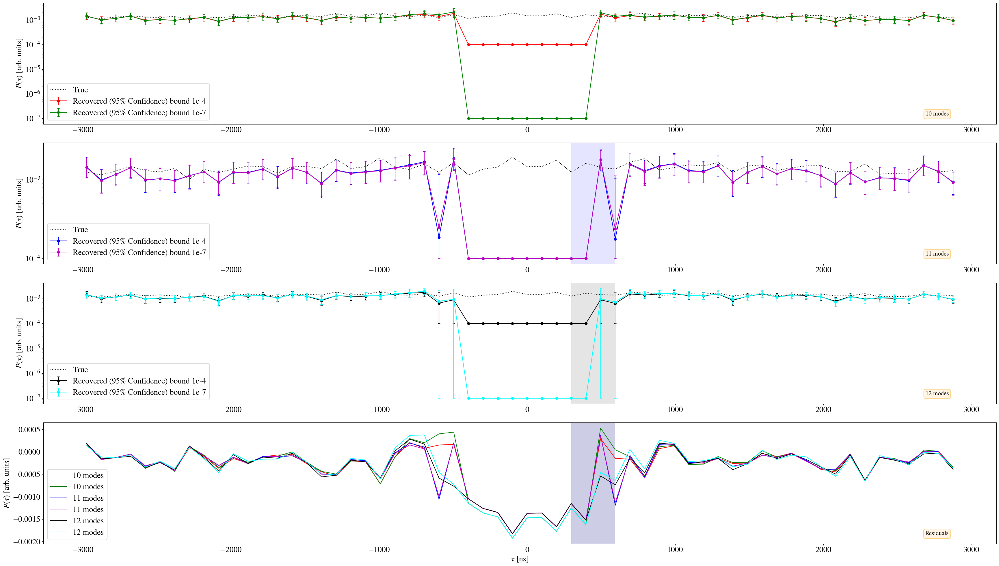

In [ ]:

# run_version_arr = ['masked_data','high_dl_fr_0','low_dl_low_fr']
result_dir_1e4='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/' #1e-4 lower limit
result_dir_1e7 = '/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/1e7_bound/'
run_version_arr_1e4 = ['low_dl_fr_20','low_dl_fr_20_11modes','low_dl_fr_20_12modes']
run_version_arr_1e7 = ['10modes','11modes','12modes']

conf_interval=95
Nburn = 10
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)

dl_inds=[[3,4,5,6],[3,4,5,6],[3,4,5,6]]
fig, ax = plt.subplots(4,1,figsize=(35, 20))
i=0
colors=['r','b','k']
colors_ii=['g','m','cyan']
fig_labels=['10 modes','11 modes','12 modes','Residuals']
for run_version_1e4,run_version_1e7 in zip(run_version_arr_1e4,run_version_arr_1e7):
    eor_true=np.load(result_dir_1e7+run_version_1e7+'/eor_true.npy')
    ps_sample_1e4 = np.load(result_dir_1e4+run_version_1e4+'/dps-eor.npy')
    ps_sample_1e7 = np.load(result_dir_1e7+run_version_1e7+'/dps-eor.npy')

    ln_post_1e4 = np.load(result_dir_1e4+run_version_1e4+'/ln-post.npy')
    ln_post_1e7 = np.load(result_dir_1e7+run_version_1e7+'/ln-post.npy')

    ps_true = calc_ps(eor_true[:Ntimes,:Nfreqs])
    ps_mean_1e4 = np.mean(ps_sample_1e4, axis=0)
    ps_mean_1e7 = np.mean(ps_sample_1e7, axis=0)

    df = (freqs[1] - freqs[0]) * u.MHz
    delays = np.fft.fftshift(np.fft.fftfreq(Nfreqs, d=df.to("1/ns")))

    if i!=0:
        print(dl_inds[i-1])
        sys_delays= delays[np.unique(dl_inds[i-1])+int(Nfreqs/2)].value
    if Nburn > 0:
        ps_sample_1e4 = ps_sample_1e4[Nburn:]
        ln_post_1e4 = ln_post_1e4[Nburn:]
    # Posterior-weighted mean delay power spectrum
    dps_eor_hp_pwm = np.average(ps_sample_1e4, weights=ln_post_1e4, axis=0)
    
    # Confidence interval of delay power spectrum posteriors
    percentile = conf_interval/2 + 50
    dps_eor_hp_ubound = np.percentile(ps_sample_1e4, percentile, axis=0)
    dps_eor_hp_lbound = np.percentile(ps_sample_1e4, 100-percentile, axis=0)
    dps_eor_hp_err = np.vstack((
        dps_eor_hp_pwm - dps_eor_hp_lbound,
        dps_eor_hp_ubound - dps_eor_hp_pwm
    ))
    
    ax[i].errorbar(
                    delays,
                    dps_eor_hp_pwm,
                    yerr=np.abs(dps_eor_hp_err),
                    color=colors[i],
                    # ls="",
                    marker="o",
                    capsize=3,
                    label=f"Recovered ({conf_interval}% Confidence) bound 1e-4"
                    )
    ax[i].plot(delays, ps_true, "k:", label="True")

    if i!=0:
        x0, x1 = np.min(sys_delays), np.max(sys_delays)   # the x-range to shade
        ax[i].axvspan(x0, x1, color=colors[i], alpha=0.1, ec=None, zorder=0.1)
        ax[-1].axvspan(x0, x1, color=colors[i], alpha=0.1, ec=None, zorder=0.1)

        if i==5:
            for dl in sys_delays:
                ax[i].axvline(dl,ls='dotted',c=colors[i])
                ax[-1].axvline(dl,ls='dotted',c=colors[i])
    # for dl in sys_delays:
    #     ax[i].axvline(dl,ls='dotted',c=colors[i])
    #     ax[-1].axvline(dl,ls='dotted',c=colors[i])
    ax[i].text(0.95,0.07,fig_labels[i],fontsize=15, bbox=bbox,
            transform=ax[i].transAxes, horizontalalignment='right')

    ax[-1].plot(delays,(dps_eor_hp_pwm-ps_true),color=colors[i],label=fig_labels[i])
    ax[-1].set_ylabel(r"$P(\tau)$ [arb. units]")
    ax[-1].set_xlabel(r'$\tau$ [ns]')
    ax[-1].legend()
    # ax[-1].grid()
    
    '''1e7 plot'''
    if i!=0:
        print(dl_inds[i-1])
        sys_delays= delays[np.unique(dl_inds[i-1])+int(Nfreqs/2)].value
    if Nburn > 0:
        ps_sample_1e7 = ps_sample_1e7[Nburn:]
        ln_post_1e7 = ln_post_1e7[Nburn:]
    # Posterior-weighted mean delay power spectrum
    dps_eor_hp_pwm = np.average(ps_sample_1e7, weights=ln_post_1e7, axis=0)
    
    # Confidence interval of delay power spectrum posteriors
    percentile = conf_interval/2 + 50
    dps_eor_hp_ubound = np.percentile(ps_sample_1e7, percentile, axis=0)
    dps_eor_hp_lbound = np.percentile(ps_sample_1e7, 100-percentile, axis=0)
    dps_eor_hp_err = np.vstack((
        dps_eor_hp_pwm - dps_eor_hp_lbound,
        dps_eor_hp_ubound - dps_eor_hp_pwm
    ))
    
    ax[i].errorbar(
                    delays,
                    dps_eor_hp_pwm,
                    yerr=np.abs(dps_eor_hp_err),
                    color=colors_ii[i],
                    # ls="",
                    marker="o",
                    capsize=3,
                    label=f"Recovered ({conf_interval}% Confidence) bound 1e-7"
                    )

    ax[i].legend(loc="best",fontsize=20)
    ax[i].set_ylabel(r"$P(\tau)$ [arb. units]")
    # ax.set_title("EoR Delay Power Spectrum Comparison")
    ax[i].set_yscale("log")

    ax[-1].plot(delays,(dps_eor_hp_pwm-ps_true),color=colors_ii[i],label=fig_labels[i])
    ax[-1].set_ylabel(r"$P(\tau)$ [arb. units]")
    ax[-1].set_xlabel(r'$\tau$ [ns]')
    ax[-1].legend()

    i=i+1
ax[-1].text(0.95,0.07,fig_labels[-1],fontsize=15, bbox=bbox,
            transform=ax[-1].transAxes, horizontalalignment='right')

fig.tight_layout()
# plt.savefig(result_dir+'/delay_power_spectrum.pdf',bbox_inches='tight',dpi=300)


# PPD plots

3 20
4 20
5 20
6 20


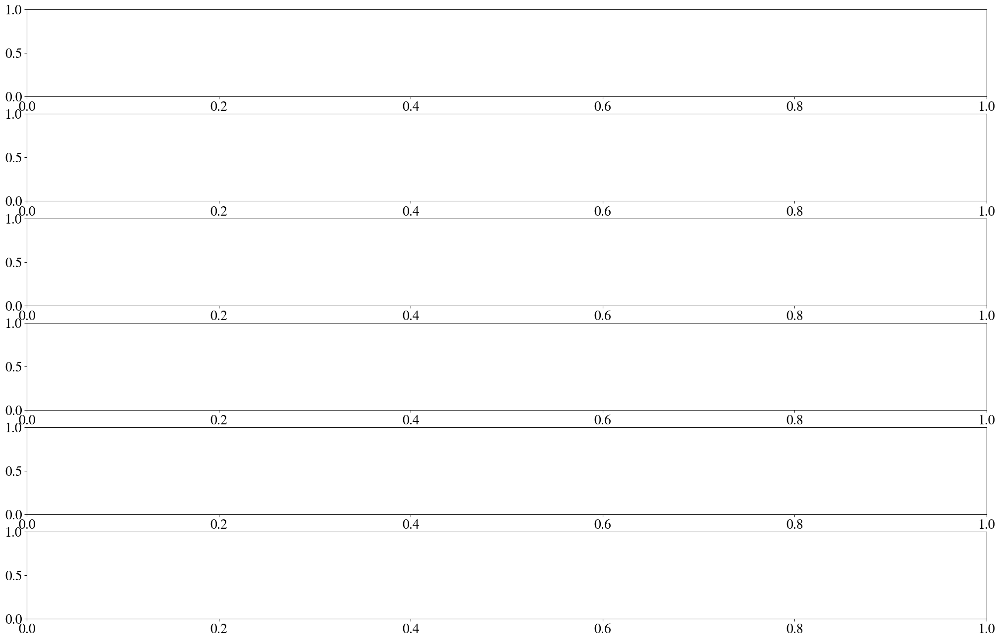

In [160]:
result_dir='/nvme2/scratch/sohini/hydra-pspec-systematic/paper_plots/low_dl_fr_20'
Nfgmodes=10
fgmodes=np.load(result_dir+'/fgmodes.npy') # Only for fg_fit
eor_true=np.load(result_dir+'/eor_true.npy')
eor_gcr = np.load(result_dir+'/gcr-eor.npy')
fg_amps_gcr = np.load(result_dir+'/fg-amps.npy')
b_sys_gcr = np.load(result_dir+'/b-sys.npy')
ps_sample = np.load(result_dir+'/dps-eor.npy')
ln_post = np.load(result_dir+'/ln-post.npy')
nm_list = [(3,20),(4,20),(5,20),(6,20)]
sys_modes_operator = sys_modes(freqs_Hz=freqs*1e6, 
                                    times_sec=lsts * 24./(2.*np.pi) * 3600., 
                                    modes=nm_list)
fg_true=np.load(result_dir+'/fg_true.npy')
sys_amps_true = np.array([4. + 1j, 4.1 + 1j, 5. + 1j, 4. + 1j])
sys_model_true = np.load(result_dir+'/gain_true.npy')
# sys_model_true = (1. + (sys_modes_operator @ sys_amps_true).reshape([Nfreqs,Ntimes]).T)

data_true = np.load(result_dir+'/data_true.npy')
fig,ax=plt.subplots(6,1,figsize=(25,16))
ps_fg=np.empty(ps_sample.shape)
ps_sys=np.empty(ps_sample.shape)
ps_del_g=np.empty(ps_sample.shape)
ps_data=np.empty(ps_sample.shape)

fig_labels = ['EoR','FG','delta_g','Systematics gain','Total Data','Residuals']
for i in range(len(ps_sample)):
    sys_model = (sys_modes_operator @ b_sys_gcr[i,:]).reshape([Nfreqs,Ntimes]).T
    data_model = (1+sys_model) * (eor_gcr[i,:,:] + (fgmodes[:,:Nfgmodes] @ fg_amps_gcr[i,:].T).T)
    ps_data[i] = calc_ps(data_model)
    ps_fg[i] = calc_ps((fgmodes[:,:Nfgmodes] @ fg_amps_gcr[i,:].T).T)
    ps_sys[i] = calc_ps(1+sys_model)
    ps_del_g[i] = calc_ps(sys_model)
#     ax[0].plot(delays,ps_sample[i],'#FEE1C7',alpha=0.1)
#     ax[1].plot(delays,ps_fg[i],'#FEE1C7',alpha=0.1)
#     ax[2].plot(delays,ps_del_g[i],c='#FEE1C7',alpha=0.1)
#     ax[3].plot(delays,ps_sys[i],c='#FEE1C7',alpha=0.1)
#     ax[4].plot(delays,ps_data[i],c='#FEE1C7',alpha=0.1)

# print(ps_sample.shape,ps_fg.shape,ps_sys.shape,ps_data.shape)
eor_avg = np.mean(ps_sample,axis=0)
fg_avg = np.mean(ps_fg,axis=0)
sys_avg = np.mean(ps_sys,axis=0)
data_avg = np.mean(ps_data,axis=0)
del_g_avg = np.mean(ps_del_g,axis=0)

# ax[0].plot(delays,eor_avg,c='k',ls='dotted',label='Mean')
# ax[1].plot(delays,fg_avg,c='k',ls='dotted',label='Mean')
# ax[2].plot(delays,del_g_avg,c='k',ls='dotted',label='Mean')
# ax[3].plot(delays,sys_avg,c='k',ls='dotted',label='Mean')
# ax[4].plot(delays,data_avg,c='k',ls='dotted',label='Mean')

# ax[0].plot(delays,calc_ps(eor_true),c='purple',ls='solid',label='True')
# ax[1].plot(delays,calc_ps(fg_true),c='purple',ls='solid',label='True')
# ax[2].plot(delays,calc_ps((sys_modes_operator @ sys_amps_true).reshape([Nfreqs,Ntimes]).T),c='purple',ls='solid',label='True')
# ax[3].plot(delays,calc_ps(sys_model_true),c='purple',ls='solid',label='True')
# ax[4].plot(delays,calc_ps(data_true),c='purple',ls='solid',label='True')

# ax[-1].plot(delays,calc_ps(eor_true)-eor_avg,c='r',ls='dotted',label='EoR')
# ax[-1].plot(delays,calc_ps(fg_true)-fg_avg,c='b',ls='dotted',label='FG')
# ax[-1].plot(delays,calc_ps((sys_modes_operator @ sys_amps_true).reshape([Nfreqs,Ntimes]).T)-del_g_avg,c='green',ls='dotted',label='delta_g')
# ax[-1].plot(delays,calc_ps(sys_model_true)-sys_avg,c='cyan',ls='dotted',label='Sys')
# ax[-1].plot(delays,calc_ps(data_true)-data_avg,c='k',ls='dotted',label='Data')


# i=0
# for a in ax.flatten():
#     a.set_yscale('log')
#     a.legend()
#     a.text(0.95,0.07,fig_labels[i],fontsize=15, bbox=bbox,
#             transform=a.transAxes, horizontalalignment='right')
#     i=i+1
# ax[-1].set_yscale('linear')

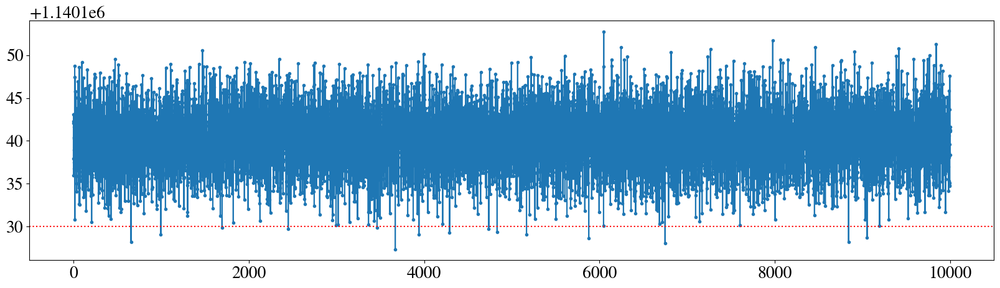

In [161]:
'''Traces of FG delay 0'''
fig,ax=plt.subplots(1,1,figsize=(20,5))
ax.plot(ps_fg[:,30],marker='.')
# ax.set_yscale('log')
ax.axhline(calc_ps(fg_true)[30],ls='dotted',c='r')

In [162]:
'''Fitting FG amps'''

A = fgmodes[:, :Nfgmodes]   # (60, 10)
B = fg_true.T                # (60, 80)

# Works for real or complex
fg_amps_fit, *_ = np.linalg.lstsq(A, B, rcond=None)  # X_hat: (10, 80)

#With noise added
A = fgmodes[:, :Nfgmodes]   # (60, 10)
B = fg_true.T + n               # (60, 80)

# Works for real or complex
fg_amps_fit_wn, *_ = np.linalg.lstsq(A, B, rcond=None)  # X_hat: (10, 80)

#With noise and systematics
A = fgmodes[:, :Nfgmodes]   # (60, 10)
B = (sys_model_true * fg_true).T + n               # (60, 80)

# Works for real or complex
fg_amps_fit_wsys, *_ = np.linalg.lstsq(A, B, rcond=None)  # X_hat: (10, 80)


In [163]:
fg_amps_gcr.shape

(10000, 80, 10)

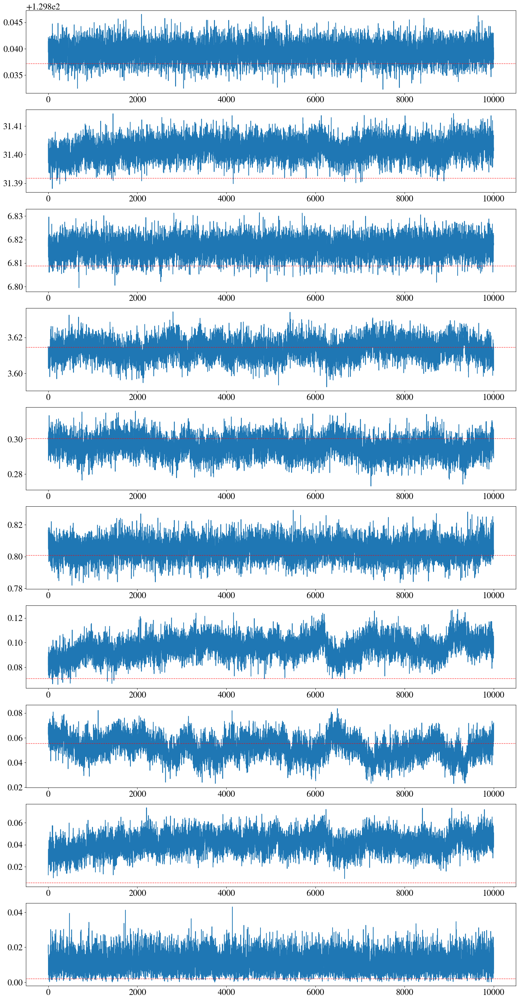

In [164]:
'''Traces of FG amps'''
fig,axs = plt.subplots(10,1,figsize=(20,40))

iters=np.linspace(0,10000,10000)
for i in range(10):
    axs[i].plot(iters,np.abs(fg_amps_gcr[:,40,i]))
    axs[i].axhline(np.abs(fg_amps_fit[i,40]),ls='dotted',c='r')

In [165]:
print("True parameters: ",sys_amps_alt)
print("Mean of samples: ",b_sys_gcr.mean(axis=0))

True parameters:  [1.+4.j 2.+3.j 3.+2.j 4.+1.j]
Mean of samples:  [3.9975864 +1.00225884j 4.09919149+1.00105048j 4.99964428+1.00064j
 3.99905739+1.00038233j]


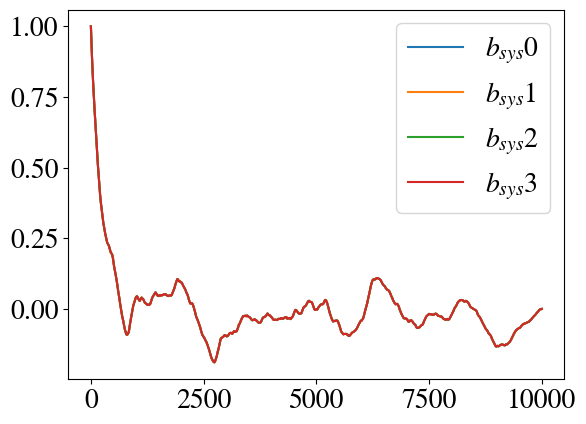

In [166]:
for i in range(4):
    plt.plot(emcee.autocorr.function_1d(b_sys_gcr[:,0]),label=r'$b_{sys}$'+str(i))
plt.legend()

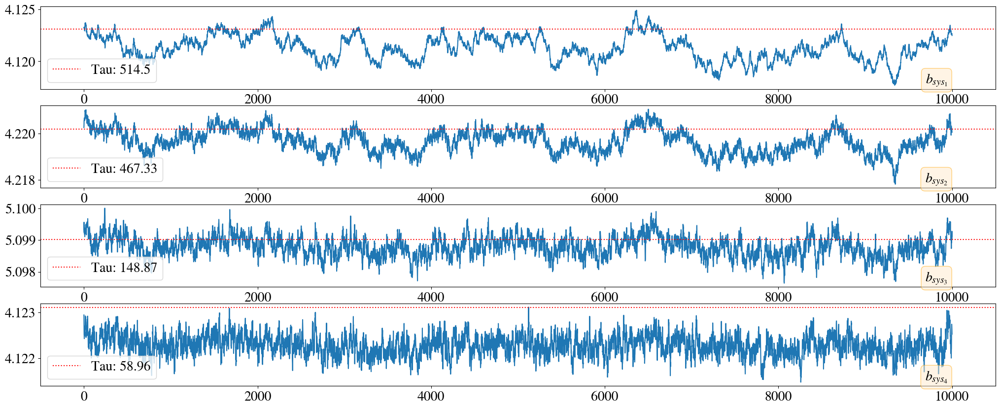

In [173]:
fig, axs = plt.subplots(4,1,figsize=(25,10))
bbox = dict(boxstyle='round', fc='blanchedalmond', ec='orange', alpha=0.5)
fig_labels=[r'$b_{sys_{1}}$',r'$b_{sys_{2}}$',r'$b_{sys_{3}}$',r'$b_{sys_{4}}$']
iters=np.linspace(0,10000,10000)
for i in range(4):
    axs[i].plot(iters,np.abs(b_sys_gcr[:,i])) 
    axs[i].axhline(np.abs(sys_amps_true[i]),ls='dotted',c='r',label=str('Tau: '+str(round(taus[i],2))))
    axs[i].text(0.95,0.07,fig_labels[i],bbox=bbox,
            transform=axs[i].transAxes, horizontalalignment='right')
    axs[i].legend(loc='lower left')

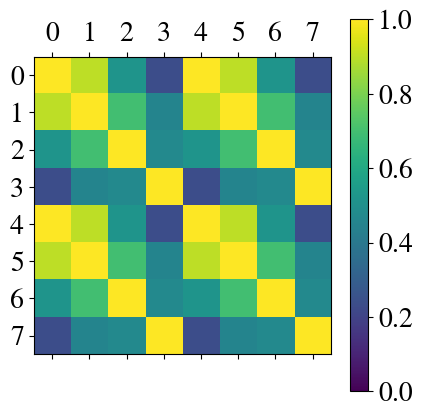

In [157]:
corrcoeff_01=np.corrcoef(b_sys_gcr.T,b_sys_gcr.T)
ticklabs=['1','2','3','4','1','2','3','4']
plt.matshow(corrcoeff_01.real,vmin=0,vmax=1)
# plt.xticks([0,1,2,3,4,5,6,7],labels=ticklabs)
# plt.yticks([0,1,2,3,4,5,6,7],labels=ticklabs)
plt.colorbar()

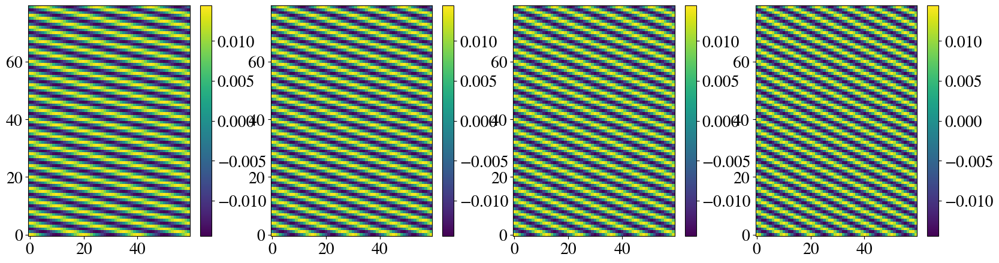

In [149]:
fig, axs = plt.subplots(1,4,figsize=(20,5))

for i in range(4):
    im=axs[i].imshow(sys_modes_operator[:,i].reshape([Nfreqs,Ntimes]).T.real,aspect='auto',origin='lower')
    plt.colorbar(im)

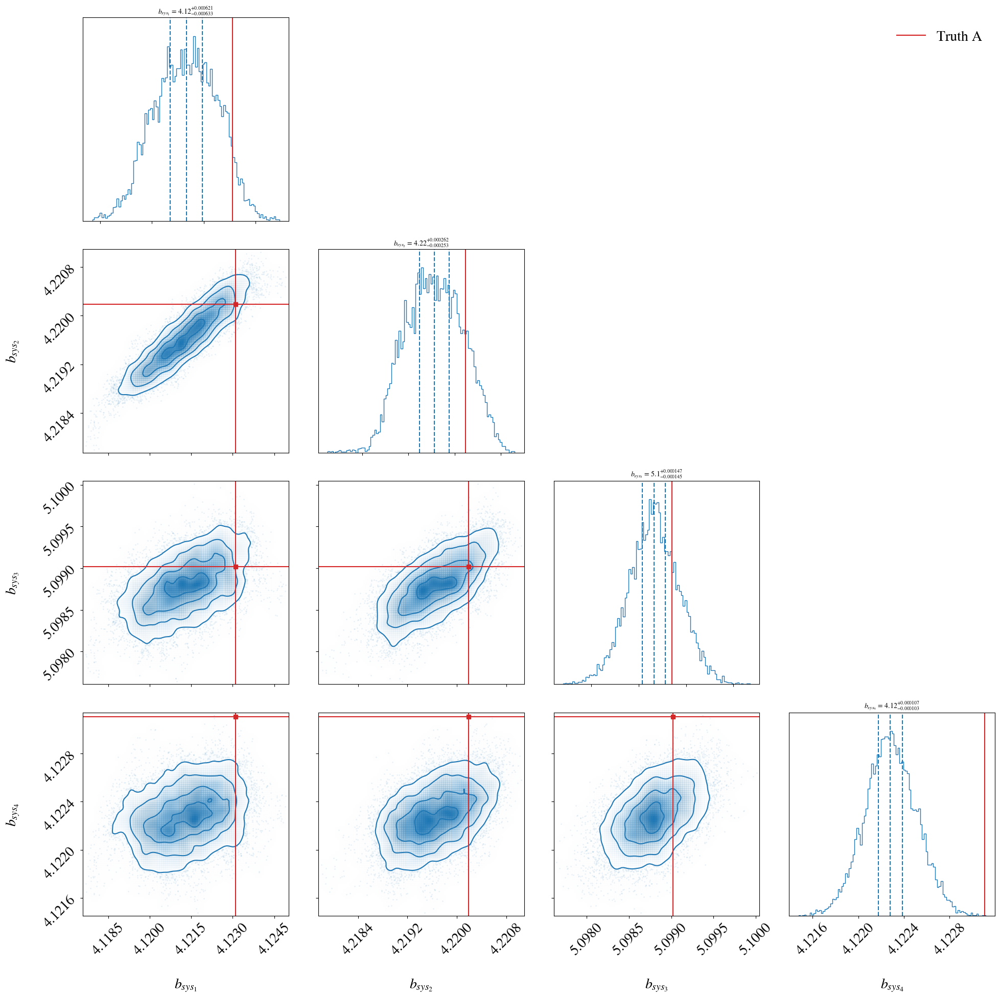

Text(0.5, 0.98, 'B_sys corner plots')

In [174]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import corner

def corner_plot(
    samples, labels=None, truths=None, burn=0, thin=1, fig=None,
    truths_label="Truth A",
    extra_truths=None, extra_color="tab:green", extra_truths_label="Truth B",
    title=None, legend_loc="best"
):
    mpl.rcParams.update({'font.size': 20})

    S = samples[burn::thin]
    ndim = S.shape[1]

    fig = corner.corner(
        S, labels=labels, truths=truths,
        truth_color="tab:red",
        quantiles=[0.32, 0.50, 0.68], fig=fig,
        show_titles=True, title_fmt=".3g",
        title_kwargs={"fontsize": 10},
        bins=100, smooth=2.0, color="C0",
    )

    # Optional second set of truths
    if extra_truths is not None:
        corner.overplot_lines(fig, extra_truths, color=extra_color, linewidth=1.6)
        corner.overplot_points(fig, [extra_truths], color=extra_color, marker="s", ms=5)

    # Legend (put it on the first diagonal axis)
    axes = np.array(fig.axes).reshape(ndim, ndim)
    ax0 = axes[0, -1]

    legend_handles = []
    if truths is not None:
        legend_handles.append(Line2D([0], [0], color="tab:red", lw=1.6, label=truths_label))
    if extra_truths is not None:
        legend_handles.append(Line2D([0], [0], color=extra_color, lw=1.6, label=extra_truths_label))

    if legend_handles:
        ax0.legend(handles=legend_handles, loc=legend_loc, frameon=False)

    # Overall title (optional)
    if title:
        fig.suptitle(title, fontsize=14, y=0.98)
        fig.tight_layout(rect=(0, 0, 1, 0.96))
    else:
        fig.tight_layout()

    plt.show()
    return fig


'''B_sys corner plots'''
# usage
# samples shape: (n, 4)
fig,ax = plt.subplots(4,4,figsize=(20,20))
truth_vals = np.array([round(np.abs(el),3) for el in sys_amps_true])
corner_plot(np.abs(b_sys_gcr), truths=np.abs(sys_amps_true),labels=[r"$b_{sys_1}$", r"$b_{sys_2}$", r"$b_{sys_3}$", r"$b_{sys_4}$"],fig=fig)
fig.suptitle("B_sys corner plots")

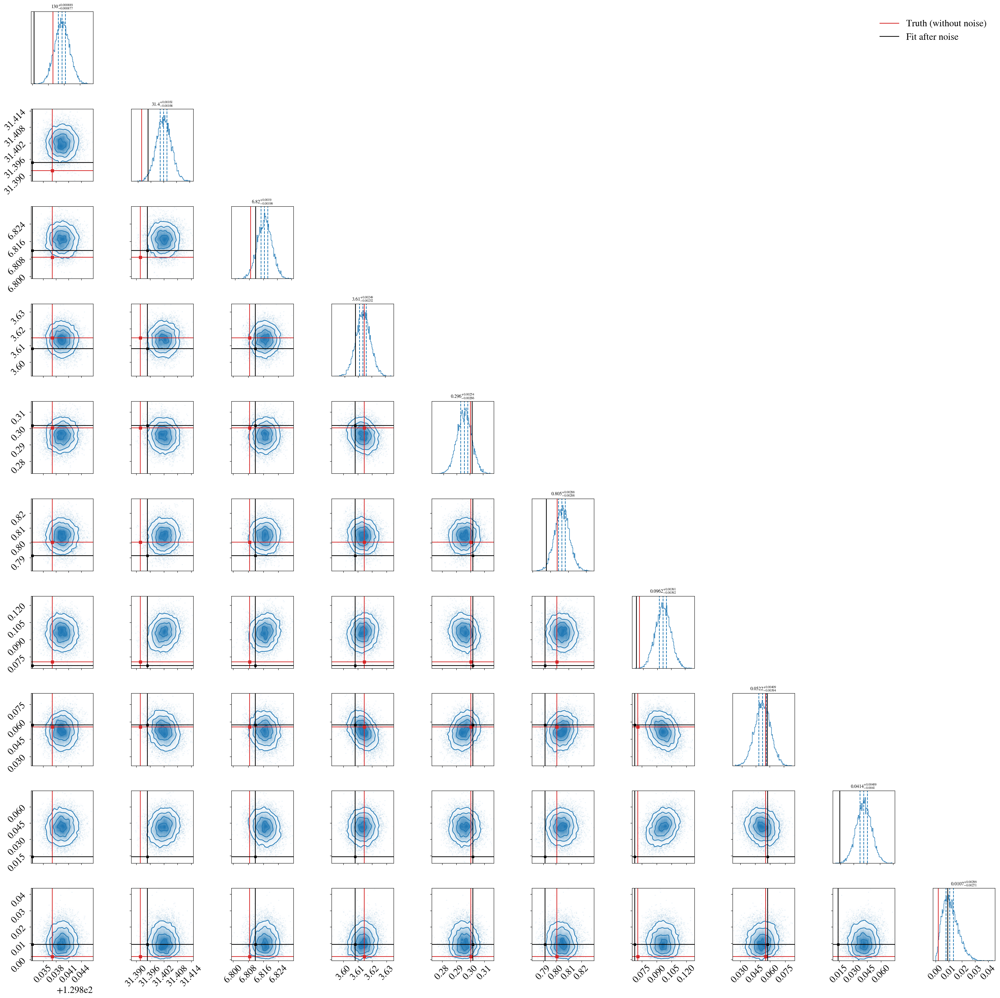

Text(0.5, 0.98, 'FG parameters after noise')

In [18]:
'''FG plots'''
fig,ax=plt.subplots(10,10,figsize=(30,30))
corner_plot(np.abs(fg_amps_gcr[:,40,:]), truths=np.abs(fg_amps_fit.T[40,:]),fig=fig,extra_truths=np.abs(fg_amps_fit_wn.T[40,:]),extra_color='k',truths_label='Truth (without noise)',extra_truths_label='Fit after noise',legend_loc='upper right')
fig.suptitle("FG parameters after noise")

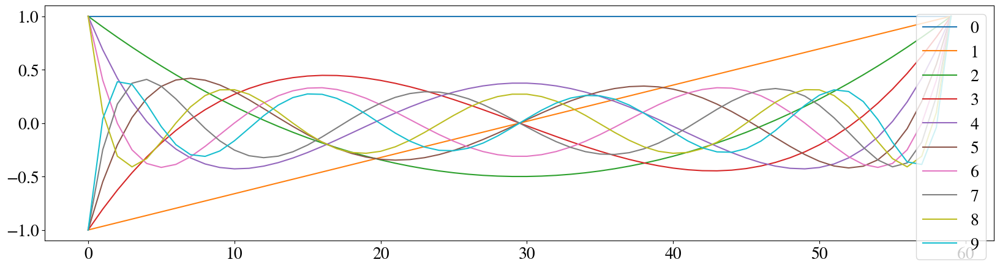

In [19]:
'''fgmodes'''
fig,ax=plt.subplots(1,1,figsize=(20,5))
for i in range(10):
    ax.plot(fgmodes[:,i],label=str(i))
ax.legend()


Text(0.5, 1.0, 'Noise realisation')

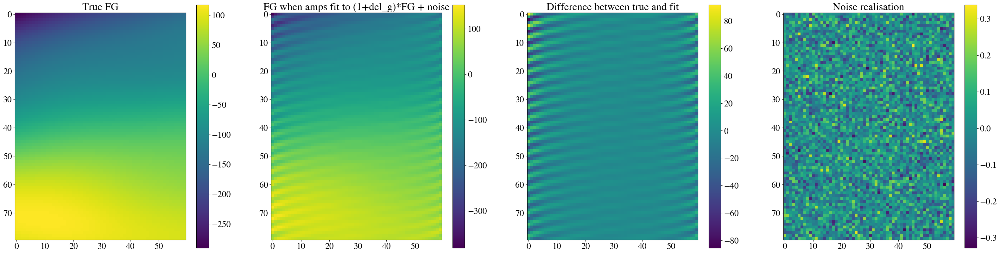

In [70]:
fig, ax = plt.subplots(1,4,figsize=(40,10))

im = ax[0].imshow(fg_true.real)
plt.colorbar(im)
ax[0].set_title("True FG")

im = ax[1].imshow((fgmodes @ fg_amps_fit_wsys).T.real)
plt.colorbar(im)
ax[1].set_title('FG when amps fit to (1+del_g)*FG + noise')

im = ax[2].imshow((fg_true-(fgmodes @ fg_amps_fit_wsys).T).real)
plt.colorbar(im)
ax[2].set_title('Difference between true and fit')

im = ax[3].imshow((n.T).real)
plt.colorbar(im)
ax[3].set_title('Noise realisation')



In [21]:
noise_ps_check.mean(),calc_ps(eor_true).mean()

(np.float64(0.0004028548457780918), np.float64(0.001426736418293431))

Text(0.5, 1.0, 'DPS comparison')

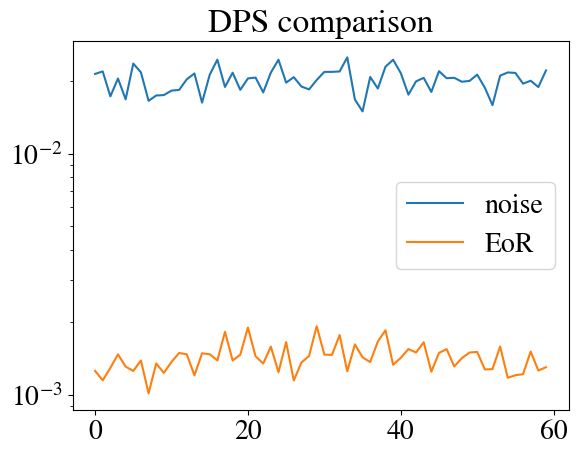

In [22]:
# Generate noise
noise_ps_val = 0.02 #0.000004 #0.000004 # 0.0004
noise_ps_true = noise_ps_val * np.ones(Nfreqs)
N_true = covariance_from_pspec(noise_ps_true, fourier_op)
Ninv = np.diag(1./np.diag(N_true)) # get diagonal, invert, pack back into diagonal
n = np.sqrt(N_true) @ (np.random.randn(freqs.size, Ntimes) 
                    + 1.j*np.random.randn(freqs.size, Ntimes)) / np.sqrt(2.)
# Note factor of sqrt(2) above
noise_ps_check = calc_ps(n.T)

plt.plot(calc_ps(n.T).real,label='noise')
plt.plot(calc_ps(eor_true).real,label='EoR')
plt.yscale('log')
plt.legend()
plt.title("DPS comparison")

Text(0.5, 1.0, 'True-Mean')

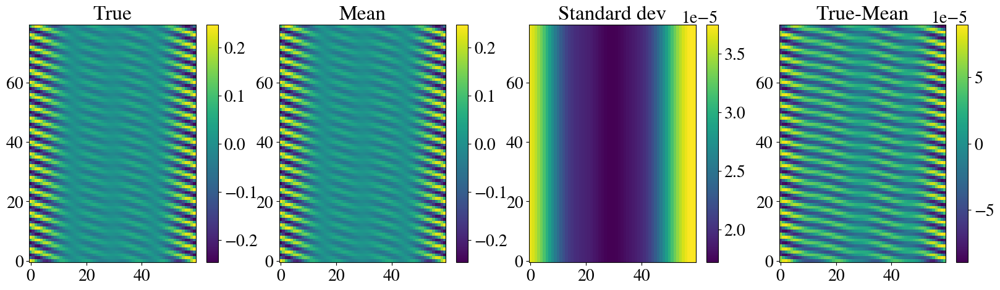

In [23]:
Niter=1000
sys_amps_true = np.array([4. + 1j, 4.1 + 1j, 5. + 1j, 4. + 1j])

delta_g_true = (sys_modes_operator @ sys_amps_true).reshape([Nfreqs,Ntimes]).T
delta_g_arr = np.empty([Niter,Ntimes,Nfreqs],dtype='complex')
for i in range(Niter):
    delta_g_arr[i,:,:] = (sys_modes_operator @ b_sys_gcr[i,:]).reshape([Nfreqs,Ntimes]).T

b_sys_mean = np.mean(b_sys_gcr,axis=0)
delta_g_mean = (sys_modes_operator @ b_sys_mean).reshape([Nfreqs,Ntimes]).T
delta_g_std = np.std(delta_g_arr, axis=0)
# delta_g_mean = np.mean(delta_g_arr, axis=0)
fig, axs = plt.subplots(1,4,figsize=(20,5))


im=axs[0].imshow(delta_g_true.real,aspect='auto',origin='lower')
plt.colorbar(im)
axs[0].set_title("True")

im=axs[1].imshow(delta_g_mean.real,aspect='auto',origin='lower')
plt.colorbar(im)
axs[1].set_title("Mean")

im=axs[2].imshow(delta_g_std.real,aspect='auto',origin='lower')
plt.colorbar(im)
axs[2].set_title("Standard dev")

im=axs[3].imshow(delta_g_true.real - delta_g_mean.real,aspect='auto',origin='lower')
plt.colorbar(im)
axs[3].set_title("True-Mean")


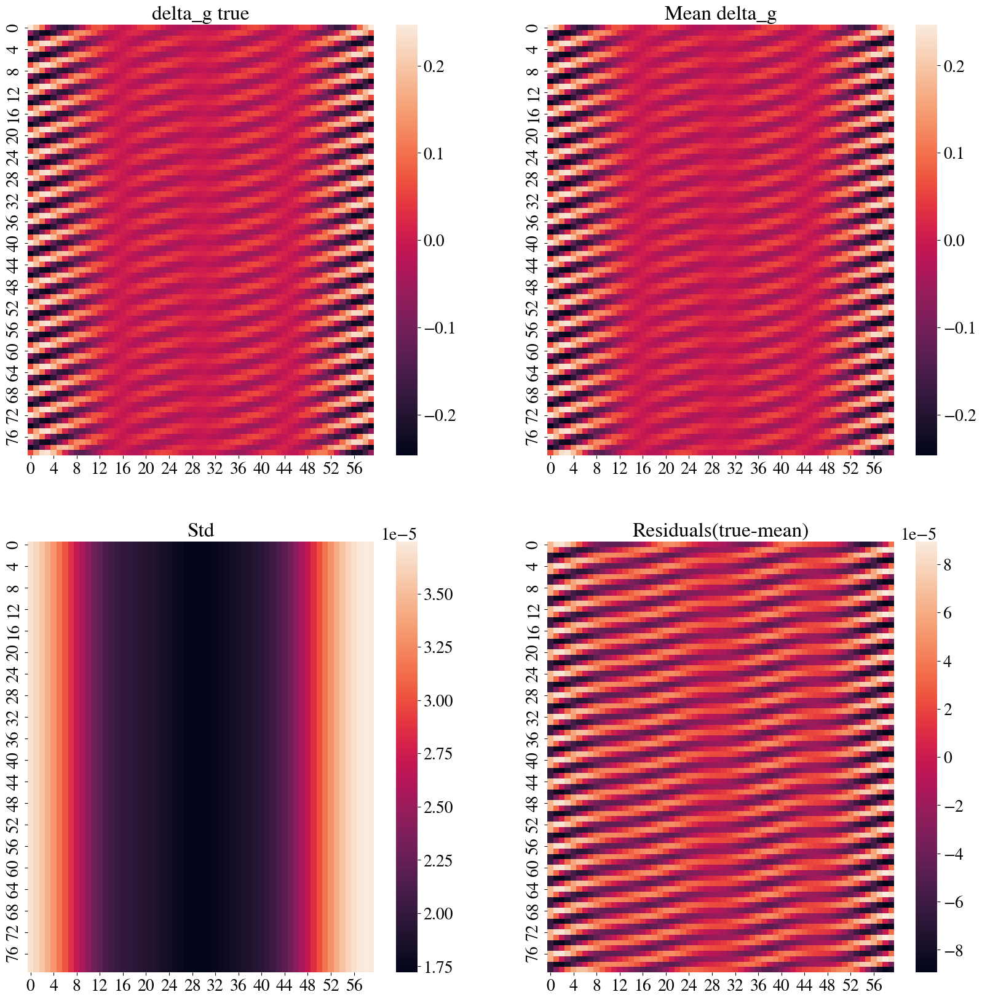

In [24]:
import seaborn as sns

fig,axs=plt.subplots(2,2,figsize=(20,20))

sns.heatmap(delta_g_true.real,ax=axs[0,0])
sns.heatmap(delta_g_mean.real,ax=axs[0,1])
sns.heatmap(delta_g_std.real,ax=axs[1,0])
sns.heatmap((delta_g_true-delta_g_mean).real,ax=axs[1,1])

titles = ['delta_g true','Mean delta_g', "Std", "Residuals(true-mean)"]

i=0
for a in axs.flatten():
    a.set_title(titles[i])
    i=i+1

Text(0.5, 1.0, 'Z for delta_g')

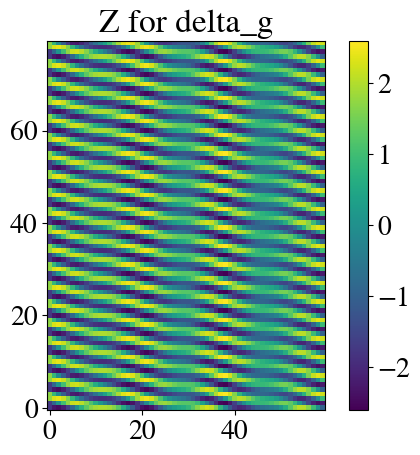

In [25]:
Z_2d = (delta_g_mean - delta_g_true)/delta_g_std

plt.imshow(Z_2d.real,origin='lower')
plt.colorbar()
plt.title("Z for delta_g")

Text(0.5, 1.0, 'Histogram of Z vals for delta_g')

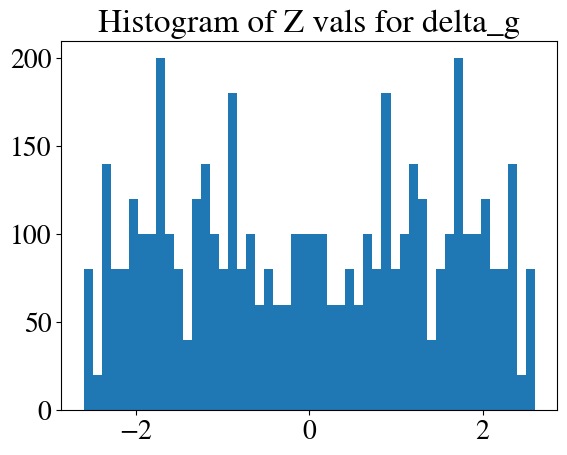

In [26]:
vals=plt.hist(Z_2d.flatten().real,bins=50)
plt.title("Histogram of Z vals for delta_g")

Text(0.5, 1.0, 'True-Mean')

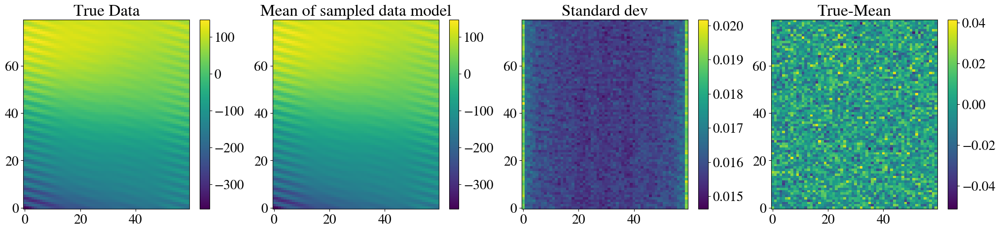

In [27]:
Niter=1000
data_true= (1+delta_g_true)*(eor_true + fg_true)
sampled_data_arr = np.empty([Niter,Ntimes,Nfreqs],dtype='complex')
for i in range(Niter):
    sys_model = (sys_modes_operator @ b_sys_gcr[i,:]).reshape([Nfreqs,Ntimes]).T
    sampled_data_arr[i,:,:] = (1+sys_model) * (eor_gcr[i,:,:] + (fgmodes[:,:Nfgmodes] @ fg_amps_gcr[i,:].T).T)

data_std = np.std(sampled_data_arr, axis=0)
data_mean = np.mean(sampled_data_arr, axis=0)
fig, axs = plt.subplots(1,4,figsize=(25,5))


im=axs[0].imshow(data_true.real,aspect='auto',origin='lower')
plt.colorbar(im)
axs[0].set_title("True Data")

im=axs[1].imshow(data_mean.real,aspect='auto',origin='lower')
plt.colorbar(im)
axs[1].set_title("Mean of sampled data model")

im=axs[2].imshow(data_std.real,aspect='auto',origin='lower')
plt.colorbar(im)
axs[2].set_title("Standard dev")

im=axs[3].imshow(data_true.real - data_mean.real,aspect='auto',origin='lower')
plt.colorbar(im)
axs[3].set_title("True-Mean")


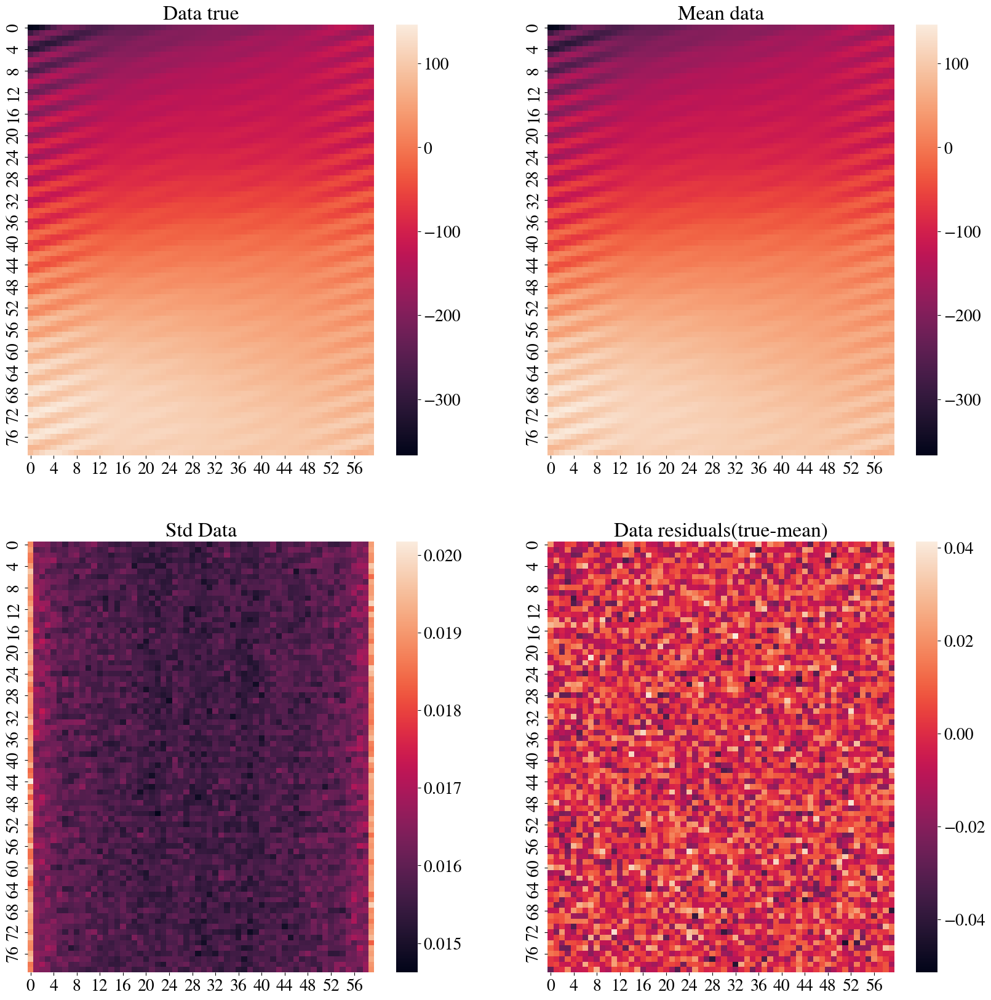

In [28]:
import seaborn as sns

fig,axs=plt.subplots(2,2,figsize=(20,20))

sns.heatmap(data_true.real,ax=axs[0,0])
sns.heatmap(data_mean.real,ax=axs[0,1])
sns.heatmap(data_std.real,ax=axs[1,0])
sns.heatmap((data_true-data_mean).real,ax=axs[1,1])

titles = ['Data true','Mean data', "Std Data", "Data residuals(true-mean)"]

i=0
for a in axs.flatten():
    a.set_title(titles[i])
    i=i+1

Text(0.5, 1.0, 'Z for data')

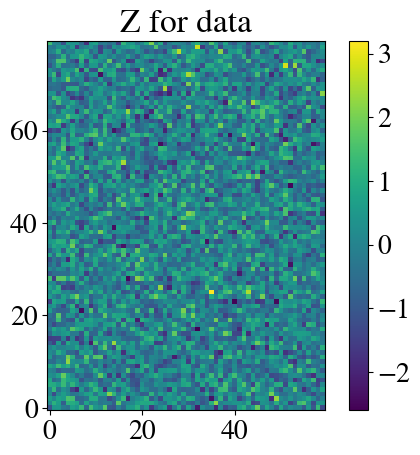

In [29]:
Z_2d_data = (data_mean - data_true)/data_std

plt.imshow(Z_2d_data.real,origin='lower')
plt.colorbar()
plt.title("Z for data")

Text(0.5, 1.0, 'Ratio at 900')

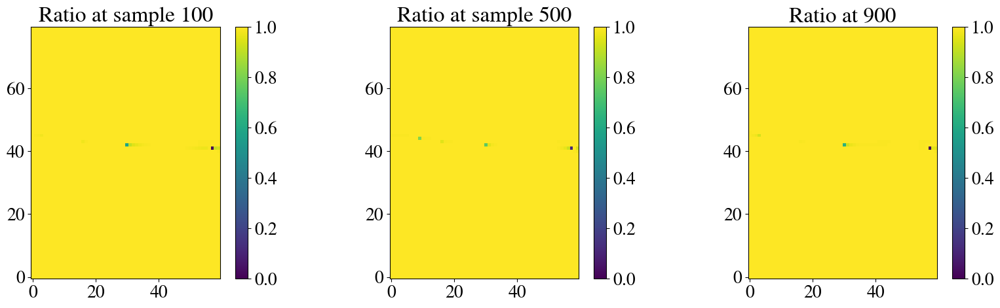

In [30]:
fig,ax = plt.subplots(1,3,figsize=(20,5))


im=ax[0].imshow(fg_true.real/(fgmodes[:,:Nfgmodes] @ fg_amps_gcr[100,:].T).T.real,origin='lower',vmin=0,vmax=1)
plt.colorbar(im)
ax[0].set_title("Ratio at sample 100")

im=ax[1].imshow(fg_true.real/(fgmodes[:,:Nfgmodes] @ fg_amps_gcr[500,:].T).T.real,origin='lower',vmin=0,vmax=1)
plt.colorbar(im)
ax[1].set_title("Ratio at sample 500")

im=ax[2].imshow(fg_true.real/(fgmodes[:,:Nfgmodes] @ fg_amps_gcr[900,:].T).T.real,origin='lower',vmin=0,vmax=1)
plt.colorbar(im)
ax[2].set_title("Ratio at 900")

In [31]:
import numpy as np

A = sys_modes_operator   # (60, 10)
B = (sys_modes_operator @ sys_amps_true).T               # (60, 80)

# Works for real or complex
X_hat, *_ = np.linalg.lstsq(A, B, rcond=None)  # X_hat: (10, 80)
b_lsqr = X_hat


Text(0.5, 1.0, 'Residual')

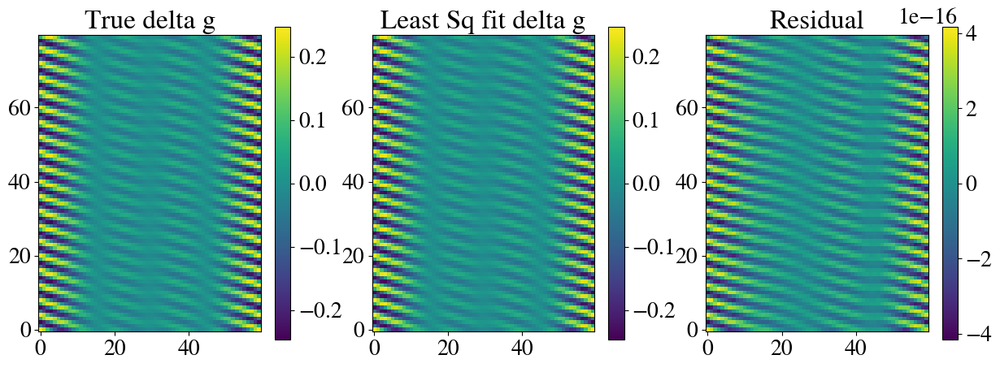

In [32]:
fig,ax = plt.subplots(1,3,figsize=(15,5))

im=ax[0].imshow(delta_g_true.real,origin='lower')
plt.colorbar(im)
ax[0].set_title("True delta g")

im=ax[1].imshow((sys_modes_operator @ b_lsqr).reshape([Nfreqs,Ntimes]).T.real,origin='lower')
plt.colorbar(im)
ax[1].set_title("Least Sq fit delta g")

im=ax[2].imshow(delta_g_true.real-(sys_modes_operator @ b_lsqr).reshape([Nfreqs,Ntimes]).T.real,origin='lower')
plt.colorbar(im)
ax[2].set_title("Residual")

In [33]:
# fig,ax = plt.subplots(1,3,figsize=(15,5))

# im=ax[0].imshow(fg_true.real,origin='lower')
# plt.colorbar(im)
# ax[0].set_title("True FG")

# im=ax[1].imshow((fgmodes[:,:Nfgmodes] @ fg_amps_fit).real.T,origin='lower')
# plt.colorbar(im)
# ax[1].set_title("Least Sq fit")

# im=ax[2].imshow(fg_true.real-(fgmodes[:,:Nfgmodes] @ fg_amps_fit).real.T,origin='lower')
# plt.colorbar(im)
# ax[2].set_title("Residual")

In [34]:
# def covariance_to_correlation(Sigma, *, complex_ok=True, fill_diagonal_one=True, nan_on_zero_var=False):
#     Sigma = np.asarray(Sigma)

#     # Variances (diagonal). For complex Hermitian covariances, the diagonal is real ≥ 0.
#     if complex_ok and np.iscomplexobj(Sigma):
#         var = np.abs(np.diag(Sigma))
#     else:
#         var = np.diag(Sigma).astype(float)

#     std = np.sqrt(var)

#     # Handle zero-variance rows/cols
#     with np.errstate(divide='ignore', invalid='ignore'):
#         corr = Sigma / np.outer(std, std)

#     if nan_on_zero_var:
#         # leave NaNs where std==0
#         pass
#     else:
#         # set entries involving zero-variance variables to 0 (and diag to 1 later)
#         corr[~np.isfinite(corr)] = 0.0

#     if fill_diagonal_one:
#         np.fill_diagonal(corr, 1.0)

#     # Optional: enforce symmetry/Hermitian and clip tiny numerical drift
#     if np.iscomplexobj(corr):
#         corr = (corr + corr.conj().T) / 2
#     else:
#         corr = (corr + corr.T) / 2
#         corr = np.clip(corr, -1.0, 1.0, out=corr)

#     return corr

# # Example
# b_sys_cov = np.cov(b_sys_gcr,fg_amps_gcr)

# R = covariance_to_correlation(b_sys_cov)


In [35]:
# fig,ax=plt.subplots(1,2,figsize=(40,10))
# # im=ax[1].matshow(R.real,aspect='auto')
# # plt.colorbar(im)
# # ax[1].set_title("Correlation matrix")

# # im=ax[0].matshow(b_sys_cov.real,aspect='auto')
# # plt.colorbar(im)
# # ax[0].set_title("Covariance matrix")

# sns.heatmap(R.real,ax=ax[0])
# sns.heatmap(b_sys_cov.real,ax=ax[1])

Investigating the mean

In [36]:
fg_vis_arr=np.empty([fg_amps_gcr.shape[0],Ntimes,Nfreqs],dtype='complex')
for i in range(fg_amps_gcr.shape[0]):
    fg_vis_arr[i,:,:] = (fgmodes @ fg_amps_gcr[i,:].T).T

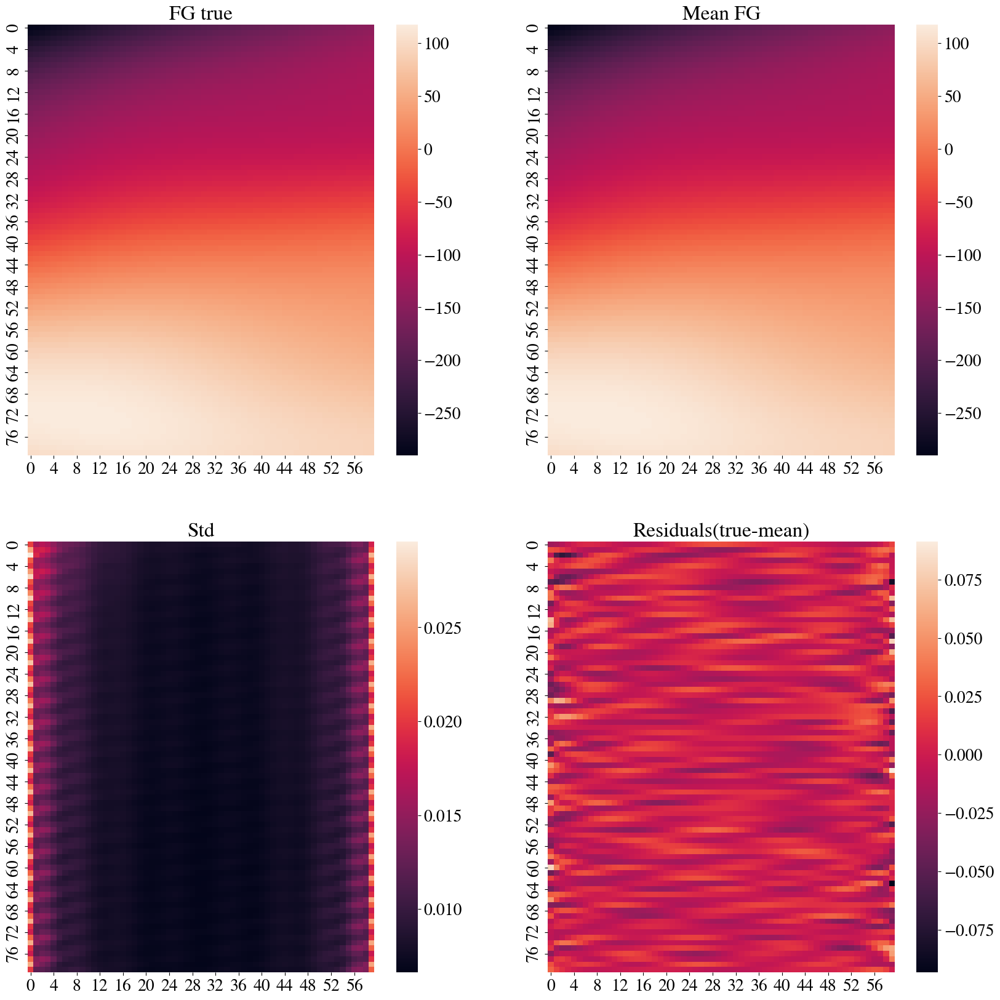

In [37]:
import seaborn as sns

fig,axs=plt.subplots(2,2,figsize=(20,20))

sns.heatmap(fg_true.real,ax=axs[0,0])
sns.heatmap(fg_vis_arr.mean(axis=0).real,ax=axs[0,1])
sns.heatmap(np.std(fg_vis_arr,axis=0).real,ax=axs[1,0])
sns.heatmap((fg_true-fg_vis_arr.mean(axis=0)).real,ax=axs[1,1])

titles = ['FG true','Mean FG', "Std", "Residuals(true-mean)"]

i=0
for a in axs.flatten():
    a.set_title(titles[i])
    i=i+1

In [38]:
fg_vis_mean = np.mean(fg_vis_arr,axis=0).mean(axis=0)
eor_vis_mean = np.mean(eor_gcr,axis=0).mean(axis=0)
sys_vis_mean = np.mean(delta_g_arr,axis=0).mean(axis=0)

/tmp/ipykernel_2572994/1266510373.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


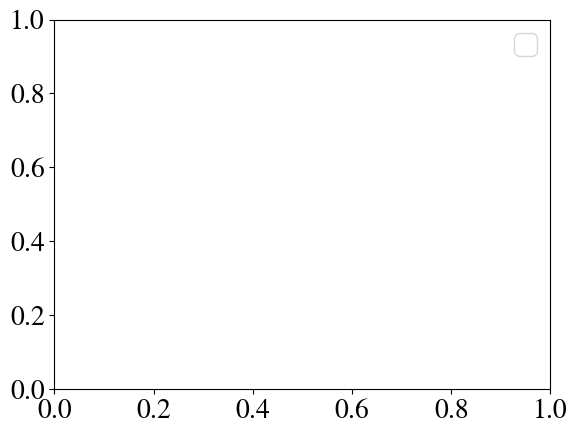

In [39]:
fig,ax=plt.subplots()
# plt.plot(delays,np.abs(fg_vis_mean),label='fg')
# plt.plot(delays,np.abs(eor_vis_mean),label='eor')
# plt.plot(delays,np.abs(sys_vis_mean),label='sys')
plt.legend()

# Plotting all the statistics in one plot

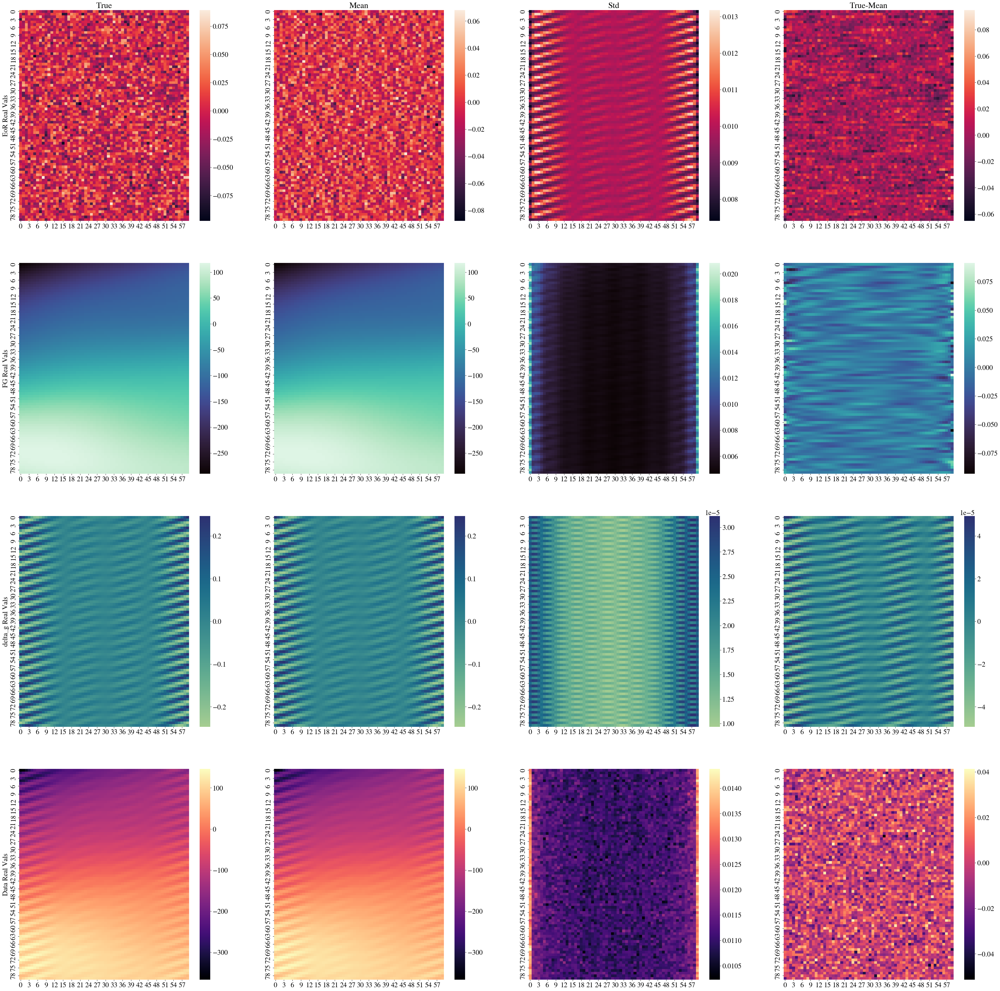

In [40]:
fig,axs = plt.subplots(4,4,figsize=(50,50))

means = [eor_gcr.real.mean(axis=0),fg_vis_arr.real.mean(axis=0),delta_g_arr.real.mean(axis=0),sampled_data_arr.real.mean(axis=0)]
stds = [np.std(eor_gcr.real,axis=0),np.std(fg_vis_arr.real,axis=0),np.std(delta_g_arr.real, axis=0),np.std(sampled_data_arr.real, axis=0)]
truths = [eor_true,fg_true,delta_g_true,data_true]
cmaps = ['rocket','mako','crest','magma']
for i in range(4):
    sns.heatmap(truths[i].real,ax=axs[i,0],cmap=cmaps[i])
    sns.heatmap(means[i],ax=axs[i,1],cmap=cmaps[i])
    sns.heatmap(stds[i],ax=axs[i,2],cmap=cmaps[i])
    sns.heatmap((truths[i].real-means[i]),ax=axs[i,3],cmap=cmaps[i])

col_labels = ['True','Mean','Std','True-Mean']
row_labels = ['EoR','FG','delta_g','Data']

for i in range(4):
    axs[i,0].set_ylabel(row_labels[i]+" Real Vals")
    axs[0,i].set_title(col_labels[i])

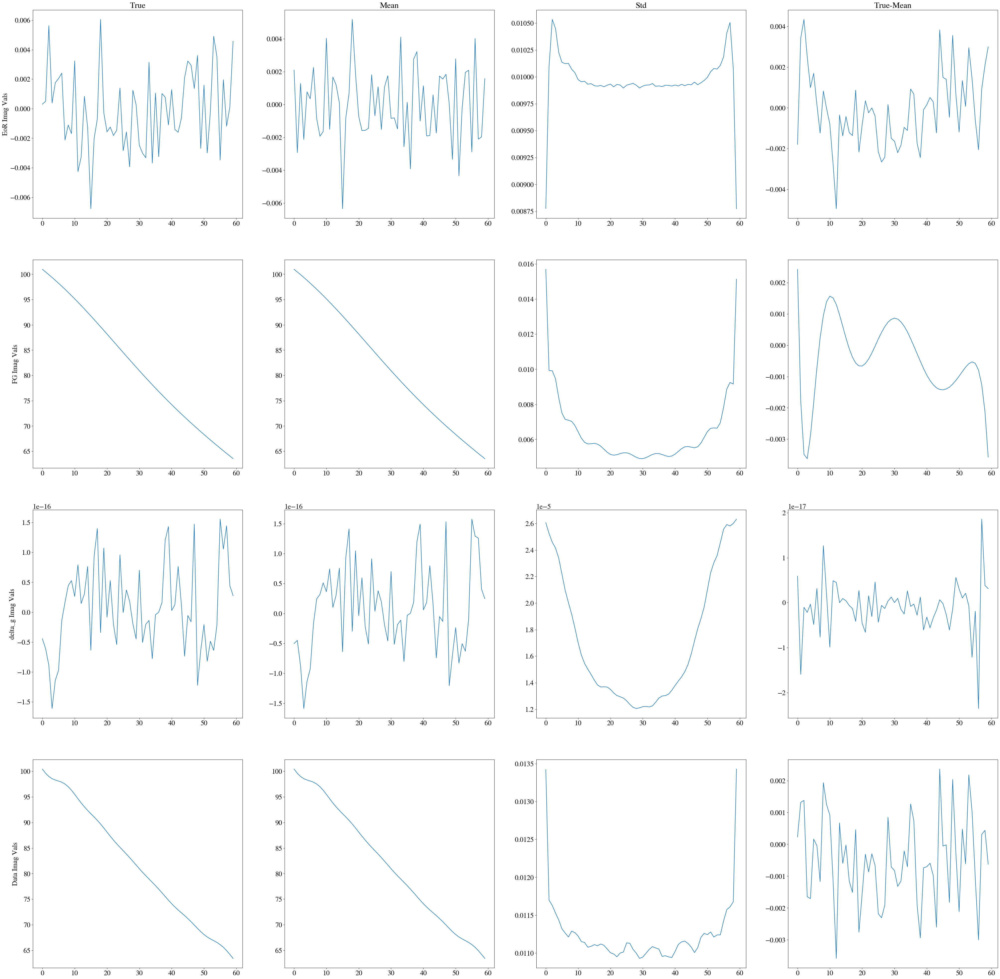

In [41]:
fig,axs = plt.subplots(4,4,figsize=(50,50))

means = [np.mean(np.imag(eor_gcr).mean(axis=0),axis=0),np.mean(np.imag(fg_vis_arr).mean(axis=0),axis=0),np.mean(np.imag(delta_g_arr).mean(axis=0),axis=0),np.mean(np.imag(sampled_data_arr).mean(axis=0),axis=0)]
stds = [np.mean(np.std(np.imag(eor_gcr),axis=0),axis=0),np.mean(np.std(np.imag(fg_vis_arr),axis=0),axis=0),np.mean(np.std(np.imag(delta_g_arr), axis=0),axis=0),np.mean(np.std(np.imag(sampled_data_arr), axis=0),axis=0)]
truths = [np.mean(eor_true,axis=0),np.mean(fg_true,axis=0),np.mean(delta_g_true,axis=0),np.mean(data_true,axis=0)]
cmaps = ['rocket','mako','crest','magma']
for i in range(4):
    axs[i,0].plot(np.imag(truths[i]))
    axs[i,1].plot(means[i])
    axs[i,2].plot(stds[i])
    axs[i,3].plot(np.imag(truths[i])-means[i])

col_labels = ['True','Mean','Std','True-Mean']
row_labels = ['EoR','FG','delta_g','Data']

for i in range(4):
    axs[i,0].set_ylabel(row_labels[i]+" Imag Vals")
    axs[0,i].set_title(col_labels[i])

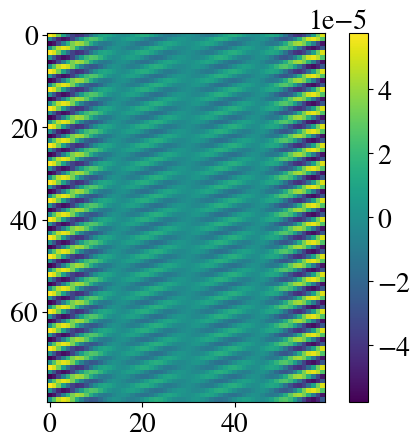

In [42]:
sys_amps_test = np.array([0.001,0.001,0.001,0.001])
plt.imshow((sys_modes_operator @ sys_amps_test).reshape([Nfreqs,Ntimes]).T.real)
plt.colorbar()

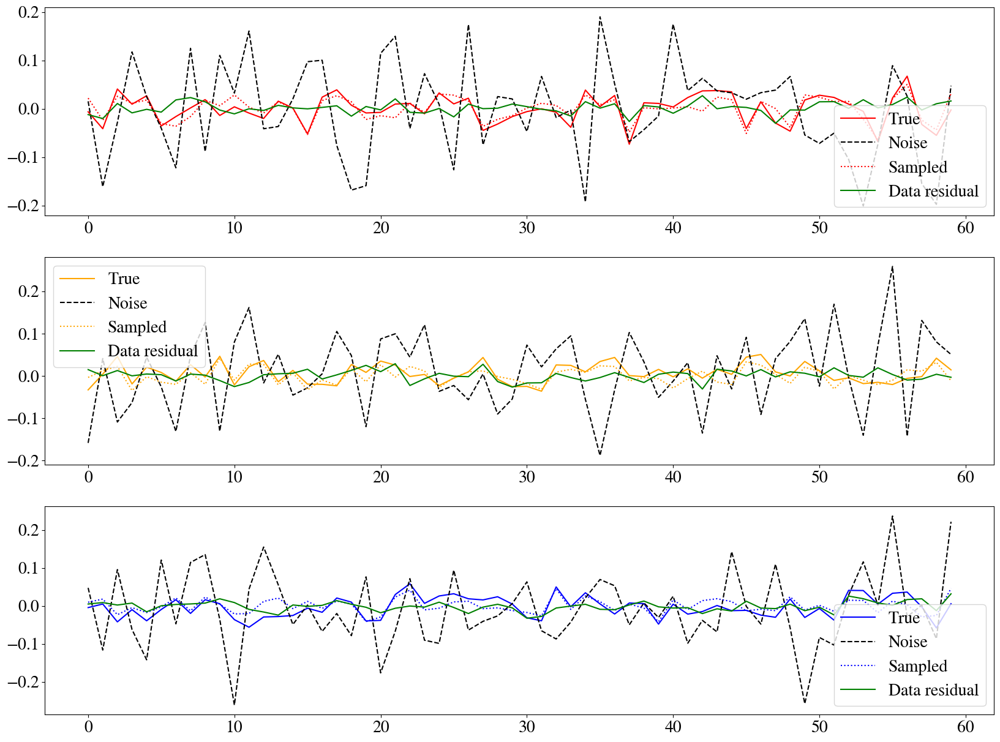

In [43]:
fig,ax=plt.subplots(3,1,figsize=(20,15))
cols=['r','orange','b','k']
for i in range(3):
    ax[i].plot(eor_true[40+i,:].real,label='True',c=cols[i])
    ax[i].plot(n.T[40+i,:].real,label='Noise',c='k',ls='dashed')
    ax[i].plot(eor_gcr.mean(axis=0)[40+i,:].real,label='Sampled',c=cols[i],ls='dotted')
    ax[i].plot((data_true-data_mean)[40+i,:].real,label='Data residual',c='green')
    ax[i].legend()
# ax.set_title("EoR vis averaged over all time samples")
# ax.legend()

In [44]:
'''calculate chisq of data'''
data_chisq = (data_true - data_mean).real**2/(np.std(n.T).real**2)

In [45]:
lsts_round=np.array([round(l,2) for l in lsts])
times = Quantity(np.unique(lsts_round * 12 / np.pi), unit='h')
# freqs_mhz = freqs * u.MHz
xticklocs=[0,10,20,30,40,50]
yticklocs=[0,10,20,30,40,50,60,70]
xstep = (freqs[-1]-freqs[0])/freqs.size
ystep = (lsts[-1]-lsts[0])/Ntimes

xticks= freqs[xticklocs]
yticks=times[yticklocs]

xticklabels = [f"{val:.2f} MHz" for val in xticks]
yticklabels = [f"{val:.2f} h" for val in yticks.value]

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((6, 6))  # Force sci notation for values >= 1e6

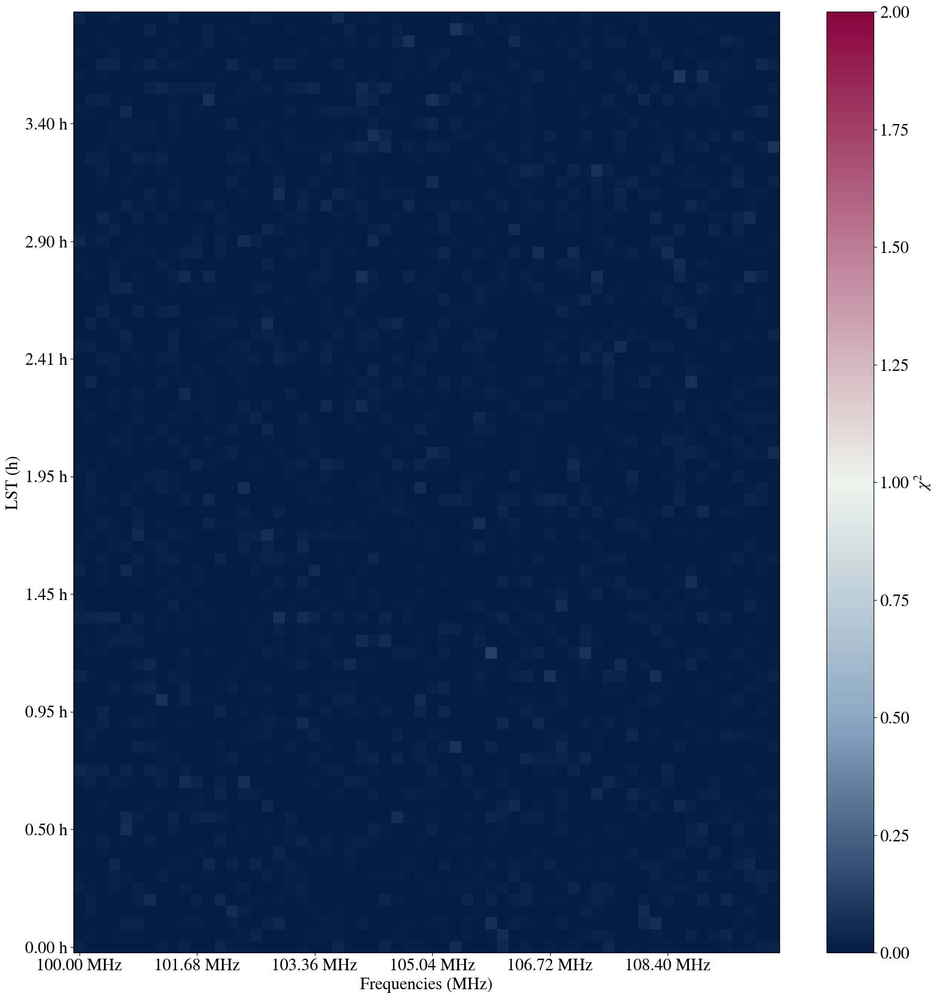

In [46]:
fig,ax=plt.subplots(1,1,figsize=(20,20))
im=ax.matshow(data_chisq.real,vmin=0,cmap=paper_map,origin='lower',vmax=2)

plt.colorbar(im, label=r'$\chi^2$')
ax.set_xticks(xticklocs)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticklocs)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'Frequencies (MHz)')
ax.set_ylabel(r'LST (h)')
ax.tick_params(axis='x',top=False,bottom=True,labelbottom=True, labeltop=False)

# plt.savefig(fig_dir+'/Chisq_data.pdf',bbox_inches='tight',dpi=100)

In [47]:
''' Getting DL-FR data for each sample'''
sky_true = eor_true + fg_true
sky_dlfr_arr=np.empty(eor_gcr.shape,dtype='complex')
for i in tqdm(range(len(eor_gcr))):
    sky_dlfr_arr[i,:,:] = data_dly_fr(eor_gcr[i,:,:]+fg_vis_arr[i,:,:],freqs*1e6, lsts, windows='blackman-harris',)

100%|██████████| 10000/10000 [00:01<00:00, 6886.57it/s]


In [48]:
lsts_round=np.array([round(l,2) for l in lsts])
times = Quantity(np.unique(lsts_round * 12 / np.pi), unit='h')
fringe_rates = fourier_freqs(lsts * units.day.to('s')) * 1e3 # mHz

# freqs_mhz = freqs * u.MHz
xticklocs=[1,10,20,30,40,50,59]
yticklocs=[0,10,20,30,40,50,60,70]
xstep = (delays[-1]-delays[0])/delays.size
ystep = (fringe_rates[-1]-fringe_rates[0])/Ntimes

xticks= delays[xticklocs]
yticks=fringe_rates[yticklocs]

xticklabels = [str(int(round(val,2))) for val in xticks.value]
# xticklabels = [f"{val:.2f}" for val in xticks.value]
yticklabels = [f"{val:.2f}" for val in yticks]

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((6, 6))  # Force sci notation for values >= 1e6

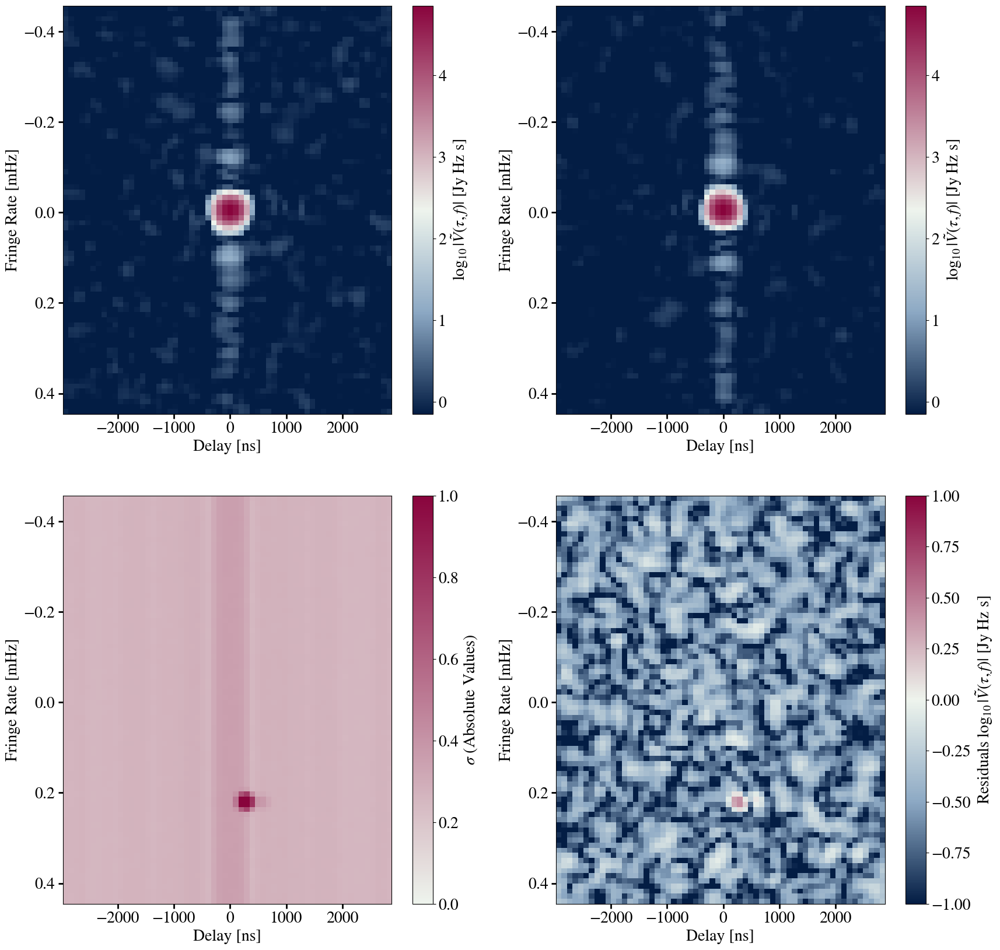

In [50]:
fig,axs=plt.subplots(2,2,figsize=(20,20))
'''True EoR'''
sky_true_dlfr=plot_waterfalls(sky_true, freqs*1e6, lsts, windows='blackman-harris', fig=fig,ax=axs.flatten()[0], mode='log', 
                vmin=None,vmax=None,cmap=paper_map, dynamic_range=5, limit_drng='all', colorbar_flag=True,
                baseline=None, horizon_color='magenta',
                freq_window_kwargs=None, time_window_kwargs=None)

'''Mean EoR'''
im1=plot_waterfalls_from_dlfr(sky_dlfr_arr.mean(axis=0), freqs*1e6, lsts, fig=fig,ax=axs.flatten()[1], mode='log', 
                vmin=None,vmax=None,cmap=paper_map, dynamic_range=5, limit_drng='all', colorbar_flag=True,
                baseline=None, horizon_color='magenta')

'''STD EoR'''
im2=plot_waterfalls_from_dlfr(np.std(sky_dlfr_arr,axis=0), freqs*1e6, lsts, fig=fig,ax=axs.flatten()[2], mode='abs', 
                vmin=0,vmax=1,cmap=paper_map_pink, dynamic_range=None, limit_drng='all', colorbar_flag=True,
                baseline=None, horizon_color='magenta',cbar_label=r'$\sigma$ (Absolute Values)')


'''True - Mean'''
im3=plot_waterfalls_from_dlfr(sky_true_dlfr[1] - sky_dlfr_arr.mean(axis=0), freqs*1e6, lsts, fig=fig,ax=axs.flatten()[3], mode='log', 
                vmin=-1,vmax=1,cmap=paper_map, dynamic_range=None, limit_drng='all', colorbar_flag=True,
                baseline=None, horizon_color='magenta',cbar_label='Residuals')

# for ax in axs.flatten()[2:]:
#     ax.set_xticks(xticklocs)
#     ax.set_xticklabels(xticklabels)
#     ax.set_yticks(yticklocs)
#     ax.set_yticklabels(yticklabels)
#     ax.set_xlabel(r'Delays (ns)')
#     ax.set_ylabel(r'Fringe Rates (mHz)')
#     ax.tick_params(axis='x',top=False,bottom=True,labelbottom=True, labeltop=False)

# plt.savefig(fig_dir+'/result_waterfalls.pdf',bbox_inches='tight',dpi=300)

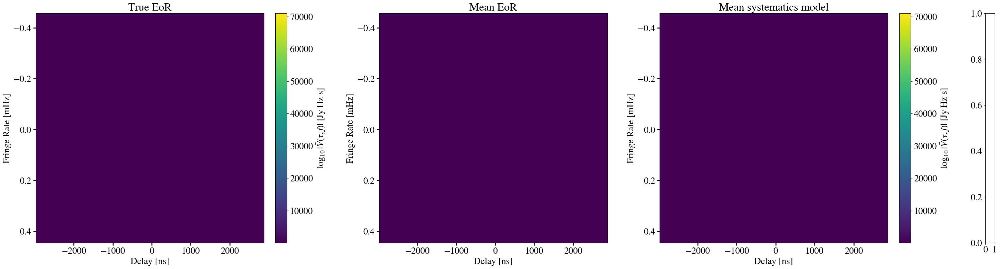

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LogNorm

# --- prep data (your existing calls) ---
data_true_dlfr = data_dly_fr(data_true,       freqs*1e6, lsts, windows='blackman-harris')
mean_eor_dlfr  = sky_dlfr_arr.mean(axis=0)
delta_g_dlfr   = data_dly_fr(delta_g_mean,    freqs*1e6, lsts, windows='blackman-harris')
sys_model_dlfr   = data_dly_fr(1+delta_g_mean,    freqs*1e6, lsts, windows='blackman-harris')

# --- choose a shared norm / limits ---
mode = 'log'                 # you’re using mode='log'
dynamic_range = 5            # decades
# stack everything you plan to plot
stack = np.concatenate([np.ravel(np.abs(data_true_dlfr)),
                        np.ravel(np.abs(mean_eor_dlfr)),
                        np.ravel(np.abs(delta_g_dlfr))])

# robust vmax (or use stack.max())
vmax = np.nanmax(stack)
# for log scale, pick vmin by dynamic range; ensure > 0
vmin = max(np.nanmin(stack[stack > 0]), vmax / 10**dynamic_range)

# norm = LogNorm(vmin=vmin, vmax=vmax) if mode == 'log' else Normalize(vmin=vmin, vmax=vmax)
norm = Normalize(vmin=vmin, vmax=vmax)
# --- build figure with GridSpec (last narrow column for the colorbar) ---
fig = plt.figure(figsize=(30, 8), constrained_layout=True)
gs  = fig.add_gridspec(nrows=1, ncols=4, width_ratios=[1, 1, 1, 0.04], wspace=0.08)

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1], sharex=ax0, sharey=ax0)
ax2 = fig.add_subplot(gs[0, 2], sharex=ax0, sharey=ax0)
cax = fig.add_subplot(gs[0, 3])  # colorbar axis

# --- plot (turn OFF per-panel colorbars, pass shared limits/norm) ---
im0 = plot_waterfalls_from_dlfr(
    data_true_dlfr, freqs*1e6, lsts,
    fig=fig, ax=ax0, mode='log',
    vmin=vmin, vmax=vmax, cmap='viridis', dynamic_range=dynamic_range,
    limit_drng='all', colorbar_flag=True, baseline=None, horizon_color='magenta'
)

im1 = plot_waterfalls_from_dlfr(
    mean_eor_dlfr, freqs*1e6, lsts,
    fig=fig, ax=ax1, mode='log',
    vmin=vmin, vmax=vmax, cmap='viridis', dynamic_range=dynamic_range,
    limit_drng='all', colorbar_flag=False, baseline=None, horizon_color='magenta'
)

im2 = plot_waterfalls_from_dlfr(
    delta_g_dlfr, freqs*1e6, lsts,
    fig=fig, ax=ax2, mode='log',
    vmin=vmin, vmax=vmax, cmap='viridis', dynamic_range=dynamic_range,
    limit_drng='all', colorbar_flag=True, baseline=None, horizon_color='magenta'
)

# titles (optional)
ax0.set_title("True EoR")
ax1.set_title("Mean EoR")
ax2.set_title("Mean systematics model")

# --- single unified colorbar ---
# If your helper returns an AxesImage with the correct norm, you can use any of im0/im1/im2:
# cb = fig.colorbar(im2, cax=cax)
# Otherwise, create a ScalarMappable with the shared norm/cmap:
# from matplotlib.cm import ScalarMappable
# sm = ScalarMappable(norm=norm, cmap='viridis')
# sm.set_array([])  # required for older Matplotlib
# cb = fig.colorbar(sm, cax=cax)

# # axes labels only where you want them
# ax0.set_ylabel("Fringe Rate")
# for ax in (ax0, ax1, ax2):
#     ax.set_xlabel("Delay [ns]")  # or "Delay" etc.

plt.show()


# Autocorrelation tests

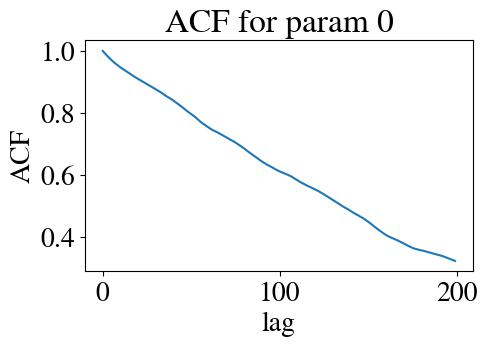

In [ ]:
j = 0  # parameter index
burn=1000
x = np.abs(b_sys_gcr)[burn:, j]
acf = _acf_fft(x)
import matplotlib.pyplot as plt
plt.figure(figsize=(5,3))
plt.plot(acf[:200])
plt.xlabel("lag"); plt.ylabel("ACF")
plt.title(f"ACF for param {j}")
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- helpers ---
def _standardize(X):
    X = np.asarray(X, dtype=float)
    mu  = np.nanmean(X, axis=0, keepdims=True)
    sig = np.nanstd (X, axis=0, ddof=1, keepdims=True)
    sig[sig == 0] = 1.0
    Z = (X - mu) / sig
    # drop rows with NaNs if any
    good = np.all(np.isfinite(Z), axis=1)
    return Z[good], good.sum()

def cross_corr_block(b_sys, FG):
    """
    Return the d x (jk) Pearson correlation matrix between b_sys and FG pixels.
    """
    n, d = b_sys.shape
    n2, j, k = FG.shape
    assert n == n2, "sample count (n) must match"

    Zb, n_used = _standardize(b_sys)         # (n_used, d)
    Zf, _      = _standardize(FG.reshape(n, -1))  # (n_used, jk)

    # Align rows after potential NaN filtering
    m = min(Zb.shape[0], Zf.shape[0])
    Zb = Zb[:m]; Zf = Zf[:m]

    C = (Zb.T @ Zf) / (m - 1)                # (d, jk)
    C = np.clip(C, -1.0, 1.0)
    return C.reshape(d, j, k), (d, j, k)

def full_corr_matrix(b_sys, FG):
    """
    Return the full Pearson correlation matrix of size (d + jk) x (d + jk).
    Use only if (d + jk) is not huge.
    """
    n, d = b_sys.shape
    Xf = FG.reshape(n, -1)                    # (n, jk)
    X  = np.hstack([b_sys, Xf])               # (n, p)
    Z, m = _standardize(X)                    # (m, p)
    R = (Z.T @ Z) / (m - 1)                   # (p, p)
    R = np.clip(R, -1.0, 1.0)
    return R, d, Xf.shape[1]

def top_correlations_block(C_djk, top=10):
    """
    From d x j x k block (|corr|), list the strongest |corr| pairs (b_idx, j, k, corr).
    """
    d, j, k = C_djk.shape
    flat = C_djk.reshape(d, -1)
    idx = np.argsort(np.abs(flat), axis=None)[-top:][::-1]
    out = []
    for idf in idx:
        bi, fk = divmod(idf, flat.shape[1])
        fj, fk = divmod(fk, k)
        out.append((bi, fj, fk, flat[bi, fj*k + fk]))
    return out


/tmp/ipykernel_2365026/2231582437.py:6: ComplexWarning: Casting complex values to real discards the imaginary part
  X = np.asarray(X, dtype=float)


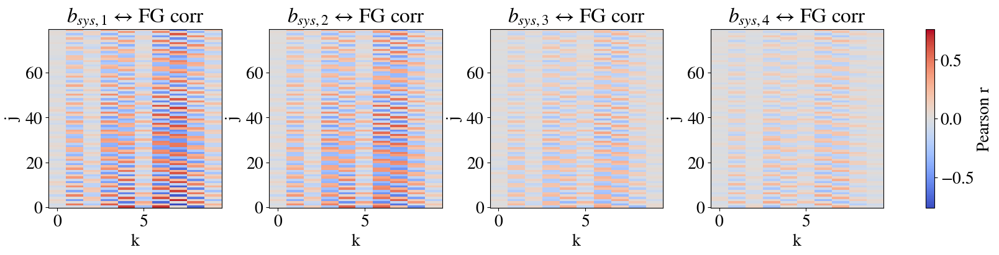

b1 vs FG[1,7]: r = -0.761
b1 vs FG[5,7]: r = -0.718
b1 vs FG[3,7]: r = 0.713
b1 vs FG[9,7]: r = -0.683
b1 vs FG[0,6]: r = 0.678
b1 vs FG[2,6]: r = -0.662
b1 vs FG[0,4]: r = 0.657
b1 vs FG[0,8]: r = -0.656
b1 vs FG[7,7]: r = 0.653
b1 vs FG[44,7]: r = 0.645


In [ ]:
C_djk, (d, j, k) = cross_corr_block(b_sys_gcr, fg_amps_gcr)  # shape (d, j, k)

# Plot as a heatmap per b_sys parameter (one row of panels)
fig, axs = plt.subplots(1, d, figsize=(4*d, 4), constrained_layout=True)
vmax = np.nanmax(np.abs(C_djk))
for i in range(d):
    im = axs[i].imshow(C_djk[i], origin="lower", aspect="auto",
                       vmin=-vmax, vmax=vmax, cmap="coolwarm")
    axs[i].set_title(fr"$b_{{sys,{i+1}}}$ ↔ FG corr")
    axs[i].set_xlabel("k");  axs[i].set_ylabel("j")
fig.colorbar(im, ax=axs.ravel().tolist(), label="Pearson r")
plt.show()

# Top |corr| locations and values
top = top_correlations_block(C_djk, top=10)
for bi, fj, fk, r in top:
    print(f"b{bi+1} vs FG[{fj},{fk}]: r = {r:.3f}")


/tmp/ipykernel_2365026/2231582437.py:6: ComplexWarning: Casting complex values to real discards the imaginary part
  X = np.asarray(X, dtype=float)


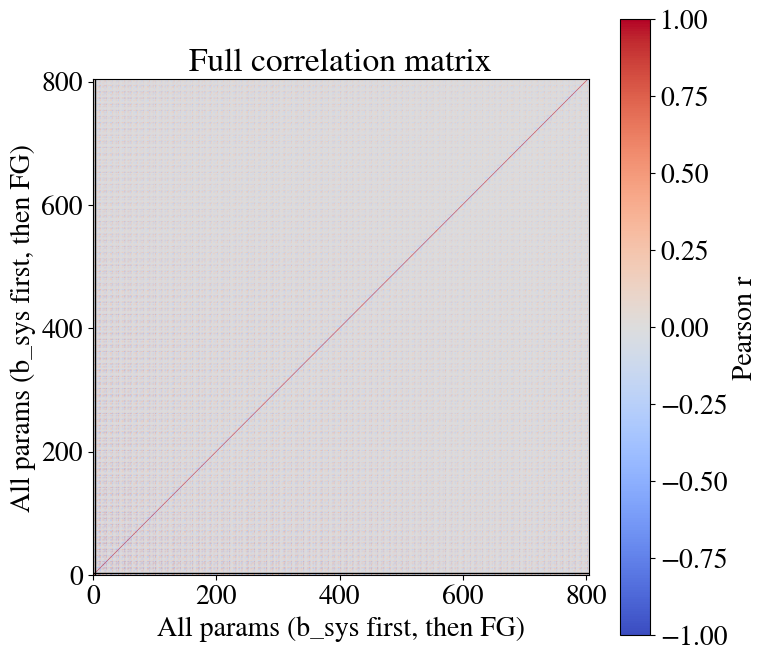

b1 vs FG[1,7]: r = -0.761
b1 vs FG[5,7]: r = -0.718
b1 vs FG[3,7]: r = 0.713
b1 vs FG[9,7]: r = -0.683
b1 vs FG[0,6]: r = 0.678
b1 vs FG[2,6]: r = -0.662
b1 vs FG[0,4]: r = 0.657
b1 vs FG[0,8]: r = -0.656
b1 vs FG[7,7]: r = 0.653
b1 vs FG[44,7]: r = 0.645


In [ ]:
R, d, p_fg = full_corr_matrix(b_sys_gcr, fg_amps_gcr)  # R shape (p, p)
p = R.shape[0]

# Plot with block separators so you can see the b_sys vs FG structure
fig, ax = plt.subplots(figsize=(8, 8))
vmax = np.nanmax(np.abs(R))
im = ax.imshow(R, origin="lower", vmin=-vmax, vmax=vmax, cmap="coolwarm")
ax.axvline(d-0.5, color='k', lw=1)
ax.axhline(d-0.5, color='k', lw=1)
ax.set_title("Full correlation matrix")
ax.set_xlabel("All params (b_sys first, then FG)")
ax.set_ylabel("All params (b_sys first, then FG)")
fig.colorbar(im, ax=ax, label="Pearson r")
plt.show()

# Top cross-block correlations (b_sys ↔ FG only)
RbF = R[:d, d:]                        # (d, p_fg)
idx = np.argsort(np.abs(RbF), axis=None)[-10:][::-1]
for idf in idx:
    bi, f = divmod(idf, p_fg)
    fj, fk = divmod(f, fg_amps_gcr.shape[2])
    print(f"b{bi+1} vs FG[{fj},{fk}]: r = {RbF[bi, f]:.3f}")
